In [2]:
!pip install tf-levenberg-marquardt


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


/tmp/ipykernel_1946/2881501840.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


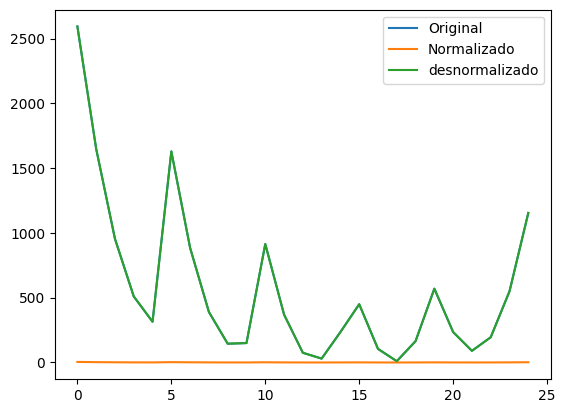

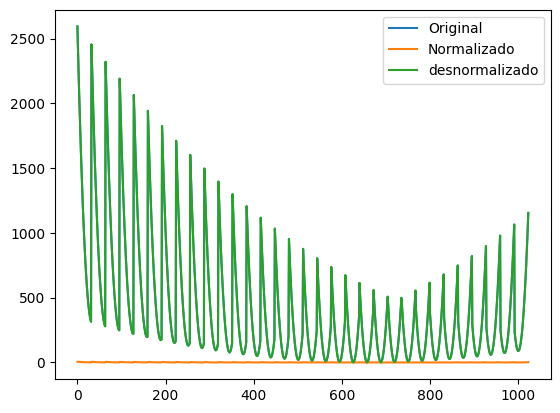

In [3]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def function(grid):
    x = np.linspace(-10, 10, grid)
    y = np.linspace(-10, 10, grid)
    x, y = np.meshgrid(x, y)
    z = (x + 2 * y - 7)**2 + (2 * x + y - 5)**2
    return x, y, z

def create_dataframe(grid):
   x, y, z = function(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="function", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [4]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [5]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import tf_levenberg_marquardt as lm


# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())

        self.lm_model = lm.model.ModelWrapper(
            tf.keras.models.clone_model(self.model))
  

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())
        return(self.lm_model)


2025-03-18 12:39:10.834777: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-18 12:39:12.242598: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-18 12:39:13.065290: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742301554.053215    1946 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742301554.287876    1946 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-18 12:39:16.200914: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [6]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [7]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

 
  def SaveModelWeights(self, model, fileName):
    if not fileName.endswith(".keras"):
        fileName += ".keras"
    path = f"content/models/{fileName}"
    open(path,'w').close()
    model.save(path)

  def SaveDataset(self, trainer, fileName):
    path = f"content/dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] >= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'content/results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

In [8]:
import os
print(os.getcwd())

/workspaces/Ic-Rna-2024/fuction_ensemble_3/redes-ensemble-s/Teste03


# Treinando com 25 dados


In [9]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='r2',
            boundarie = 0.95, 
            hidden_sizes = [[1, 2], [2, 3], [1, 5], [1, 6], [3, 3], [4, 3], [1, 9], [2, 9], [2, 1], [2, 2]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[1, 2], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_1_20,0.985637,0.991363,0.979711,0.895321,0.962765,3203.867623,1926.434814,4182.826816,6022.528626,5102.677721,0.982534,56.602717,0.975377,59.012412,3.855772,16.044530
model_1_1_19,0.985403,0.991305,0.979316,0.896227,0.962658,3255.939724,1939.404985,4264.263073,5970.384075,5117.323574,1.001586,57.060842,0.974977,59.490040,3.823528,16.012286
model_1_1_18,0.985418,0.991247,0.979259,0.898567,0.963107,3252.560378,1952.519293,4275.847432,5835.745073,5055.796253,1.008899,57.031223,0.975003,59.459160,3.825604,16.014363
model_1_1_17,0.985316,0.991240,0.979262,0.897720,0.962931,3275.439745,1954.085640,4275.226731,5884.521898,5079.874315,1.009457,57.231458,0.974827,59.667919,3.811585,16.000343
model_1_1_16,0.985724,0.990628,0.981583,0.905799,0.966373,3184.386783,2090.451709,3796.784562,5419.698269,4608.241415,0.975597,56.430371,0.975527,58.832729,3.867970,16.056728
model_1_1_15,0.983168,0.990416,0.977347,0.893934,0.960696,3754.602347,2137.672650,4670.174878,6102.308682,5386.241780,1.103826,61.274810,0.971144,63.883406,3.538525,15.727283
model_1_1_14,0.980260,0.989597,0.976481,0.865420,0.954059,4403.040990,2320.487620,4848.632034,7742.802486,6295.717260,1.137055,66.355414,0.966161,69.180302,3.219899,15.408657
model_1_1_13,0.980145,0.989459,0.976402,0.866149,0.954152,4428.779911,2351.344196,4864.942755,7700.888358,6282.915556,1.146398,66.549079,0.965963,69.382211,3.208241,15.396999
model_1_1_12,0.979978,0.989394,0.976629,0.863852,0.953841,4466.031981,2365.702068,4818.172885,7833.041143,6325.607014,1.139614,66.828377,0.965677,69.673399,3.191489,15.380247
model_1_1_11,0.978048,0.988529,0.975504,0.848263,0.949722,4896.659191,2558.678323,5050.136214,8729.923878,6890.030046,1.181165,69.976133,0.962367,72.955162,3.007383,15.196141


DataFrame salvo em content/results/metrics_1_1
+++++++++++ [1_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 2 ++++++++++++++++++
Stopped at epoch:  42
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 3 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_2] | 4 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_2_1,0.989082,0.991711,0.969276,0.896606,0.962398,2435.447011,1848.894533,2427.084086,2798.467891,2612.775989,0.910113,49.350248,0.981283,51.451191,4.404229,16.592987
model_1_2_0,0.986383,0.991629,0.966626,0.894447,0.960472,3037.394469,1867.235727,2636.409879,2856.890286,2746.650082,0.942042,55.112562,0.976656,57.458818,3.962489,16.151248
model_1_2_2,0.990637,0.990308,0.970737,0.906334,0.965124,2088.401995,2161.839770,2311.625211,2535.160679,2423.392945,0.921512,45.699037,0.983950,47.644540,4.711691,16.900449
model_1_2_3,0.991181,0.989866,0.972665,0.903273,0.965623,1967.183410,2260.561908,2159.379932,2618.005800,2388.692866,0.900754,44.352941,0.984881,46.241138,4.831284,17.020042
model_1_2_4,0.991415,0.989647,0.973724,0.901480,0.965876,1914.929915,2309.352340,2075.676315,2666.541121,2371.108718,0.886711,43.759912,0.985283,45.622862,4.885127,17.073886
model_1_2_6,0.991884,0.989186,0.975268,0.897479,0.965974,1810.383665,2412.051897,1953.751033,2774.831727,2364.291380,0.862044,42.548604,0.986086,44.359986,4.997412,17.186170
model_1_2_5,0.991880,0.989133,0.975172,0.897899,0.966002,1811.250782,2423.908936,1961.296138,2763.454067,2362.375103,0.864454,42.558792,0.986080,44.370608,4.996454,17.185212
model_1_2_7,0.992058,0.988725,0.975906,0.896321,0.966112,1771.422237,2514.897138,1903.294758,2806.171950,2354.733354,0.856469,42.088267,0.986386,43.880052,5.040924,17.229682
model_1_2_8,0.992150,0.988710,0.976914,0.893523,0.966140,1750.918616,2518.326432,1823.677192,2881.919953,2352.798572,0.839965,41.843979,0.986543,43.625364,5.064208,17.252967
model_1_2_9,0.992301,0.988218,0.977285,0.892355,0.966123,1717.234633,2628.136299,1794.365577,2913.525222,2353.945400,0.836513,41.439530,0.986802,43.203696,5.103059,17.291817


DataFrame salvo em content/results/metrics_1_2
+++++++++++ [1_3] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_3] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_3] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_3_5,0.992734,0.987070,0.998032,0.960261,0.992711,1620.773498,2884.181746,802.652994,4226.595815,2514.624405,0.789267,40.258831,0.987544,41.972733,5.218682,17.407441
model_1_3_6,0.992748,0.986858,0.998016,0.960268,0.992703,1617.608247,2931.501253,809.070447,4225.787042,2517.428744,0.778018,40.219501,0.987568,41.931728,5.222592,17.411350
model_1_3_0,0.992706,0.986831,0.998251,0.959762,0.992763,1626.949590,2937.457307,713.497922,4279.675304,2496.586613,0.816510,40.335463,0.987496,42.052627,5.211076,17.399834
model_1_3_3,0.992729,0.986611,0.998202,0.959971,0.992767,1621.826791,2986.573750,733.292917,4257.372855,2495.332886,0.813720,40.271911,0.987536,41.986369,5.217383,17.406141
model_1_3_2,0.992724,0.986573,0.998227,0.959901,0.992771,1623.017894,2995.055751,723.177737,4264.865680,2494.021708,0.815421,40.286696,0.987526,42.001784,5.215915,17.404673
model_1_3_1,0.992723,0.986519,0.998248,0.959842,0.992774,1623.274196,3006.924247,714.478547,4271.177000,2492.827773,0.814912,40.289877,0.987524,42.005101,5.215599,17.404357
model_1_3_4,0.992731,0.986517,0.998153,0.960010,0.992744,1621.375029,3007.385730,753.477946,4253.282270,2503.380108,0.804317,40.266301,0.987539,41.980521,5.217940,17.406699
model_1_3_7,0.992740,0.986504,0.998004,0.960153,0.992678,1619.392208,3010.293258,813.981097,4238.051449,2526.016273,0.773392,40.241673,0.987554,41.954844,5.220388,17.409146
model_1_3_8,0.992741,0.986454,0.997973,0.960168,0.992662,1619.154296,3021.504568,826.770581,4236.445544,2531.608063,0.769251,40.238716,0.987556,41.951762,5.220681,17.409440
model_1_3_9,0.992745,0.986332,0.997973,0.960108,0.992653,1618.355869,3048.715600,826.675869,4242.898539,2534.787204,0.766167,40.228794,0.987562,41.941417,5.221668,17.410426


DataFrame salvo em content/results/metrics_1_3
+++++++++++ [1_4] | 1 ++++++++++++++++++
Stopped at epoch:  33
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_4] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_4] | 3 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_4] | 4 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_4_0,0.992527,0.986222,0.996334,0.995047,0.996555,1666.806309,3073.307497,309.390578,886.741569,598.066073,0.763694,40.826539,0.987190,42.564610,5.162671,17.351429
model_1_4_1,0.992461,0.985782,0.995362,0.994663,0.996120,1681.655007,3171.402337,391.402055,955.608232,673.505143,0.782936,41.007987,0.987076,42.753782,5.144933,17.333691
model_1_4_3,0.992391,0.985764,0.993701,0.993626,0.995182,1697.319715,3175.500795,531.549065,1141.137325,836.343195,0.806199,41.198540,0.986955,42.952447,5.126389,17.315147
model_1_4_4,0.992366,0.985698,0.993383,0.993435,0.995007,1702.745689,3190.177247,558.370923,1175.325259,866.848091,0.808727,41.264339,0.986914,43.021048,5.120005,17.308764
model_1_4_2,0.992405,0.985669,0.994548,0.994029,0.995596,1694.097574,3196.740305,460.094071,1068.948068,764.521069,0.790325,41.159417,0.986980,42.911658,5.130189,17.318947
model_1_4_5,0.992079,0.984960,0.990934,0.991634,0.993482,1766.948219,3354.893189,765.057054,1497.863845,1131.460450,0.813407,42.035083,0.986420,43.824604,5.045982,17.234740
model_1_4_6,0.991918,0.984403,0.989370,0.990711,0.992626,1802.694685,3478.927441,897.074315,1663.026434,1280.050375,0.815642,42.458152,0.986146,44.265684,5.005924,17.194683
model_1_4_7,0.991778,0.983981,0.988264,0.989955,0.991968,1833.918358,3573.177121,990.389668,1798.410333,1394.400001,0.814732,42.824273,0.985906,44.647391,4.971580,17.160338
model_1_4_8,0.991754,0.983930,0.988116,0.989809,0.991856,1839.367605,3584.600457,1002.845130,1824.623849,1413.734489,0.813599,42.887849,0.985864,44.713674,4.965646,17.154404
model_1_4_9,0.991701,0.983776,0.987718,0.989520,0.991611,1851.168004,3618.950918,1036.421318,1876.236847,1456.329082,0.812531,43.025202,0.985773,44.856874,4.952856,17.141614


DataFrame salvo em content/results/metrics_1_4
+++++++++++ [1_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_5] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_5_7,0.992474,0.986816,0.828577,0.994187,0.994034,1678.835956,2940.787356,1370.425580,2718.950557,2044.688069,0.895026,40.973601,0.987097,42.717932,5.148288,17.337046
model_1_5_10,0.992610,0.986805,0.808144,0.993988,0.993660,1648.287135,2943.134529,1533.780525,2811.863625,2172.822075,0.865057,40.599103,0.987332,42.327490,5.185016,17.373774
model_1_5_9,0.992563,0.986799,0.817135,0.994079,0.993827,1658.905524,2944.605575,1461.901161,2769.620805,2115.760983,0.877738,40.729664,0.987251,42.463610,5.172173,17.360932
model_1_5_8,0.992554,0.986740,0.817543,0.994064,0.993821,1660.821035,2957.724414,1458.638583,2776.690506,2117.664544,0.877755,40.753172,0.987236,42.488119,5.169865,17.358624
model_1_5_6,0.992358,0.986703,0.836951,0.994176,0.994124,1704.537969,2966.077756,1303.484829,2723.917425,2013.701127,0.905627,41.286051,0.986900,43.043683,5.117901,17.306660
model_1_5_11,0.992639,0.986637,0.796090,0.993798,0.993389,1642.026673,2980.747021,1630.142745,2900.995935,2265.569340,0.846825,40.521928,0.987380,42.247031,5.192627,17.381385
model_1_5_5,0.992222,0.986475,0.845040,0.994140,0.994194,1734.935601,3016.836765,1238.819250,2741.120786,1989.970018,0.915914,41.652558,0.986666,43.425794,5.082549,17.271307
model_1_5_15,0.992606,0.986374,0.762762,0.993505,0.992801,1649.193087,3039.464992,1896.581422,3037.912710,2467.247066,0.819998,40.610258,0.987325,42.339121,5.183917,17.372675
model_1_5_4,0.992198,0.986330,0.844891,0.994080,0.994151,1740.319626,3049.254709,1240.004233,2769.181842,2004.593037,0.913606,41.717138,0.986625,43.493123,5.076352,17.265110
model_1_5_14,0.992566,0.986155,0.767043,0.993478,0.992832,1658.140398,3088.123698,1862.355616,3050.772482,2456.564049,0.826106,40.720270,0.987257,42.453816,5.173096,17.361854


DataFrame salvo em content/results/metrics_1_5
+++++++++++ [1_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_6] | 2 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [1_6] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [1_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_6_4,0.992185,0.989137,0.954787,0.993045,0.985986,1743.146308,2423.117820,2463.611677,1605.891454,2034.751566,0.749641,41.751004,0.986603,43.528430,5.073106,17.261864
model_1_6_5,0.992238,0.989067,0.954782,0.992860,0.985838,1731.466276,2438.706697,2463.921058,1648.670206,2056.295632,0.742232,41.610891,0.986693,43.382353,5.086552,17.275310
model_1_6_7,0.992398,0.988866,0.956185,0.993221,0.986388,1695.728947,2483.582780,2387.439694,1565.309198,1976.374446,0.742735,41.179230,0.986968,42.932315,5.128264,17.317022
model_1_6_6,0.992394,0.988860,0.956218,0.993224,0.986397,1696.541158,2484.771826,2385.662058,1564.515646,1975.088852,0.744277,41.189090,0.986961,42.942595,5.127306,17.316065
model_1_6_2,0.992163,0.988845,0.954492,0.993847,0.986568,1748.198038,2488.263415,2479.705848,1420.712109,1950.208979,0.730124,41.811458,0.986564,43.591459,5.067318,17.256077
model_1_6_3,0.992249,0.988831,0.955268,0.993569,0.986492,1728.990850,2491.378693,2437.415631,1484.981353,1961.198492,0.741278,41.581136,0.986712,43.351331,5.089414,17.278172
model_1_6_8,0.992410,0.988810,0.956212,0.992855,0.986102,1693.000678,2496.036627,2385.952109,1649.696754,2017.824432,0.744328,41.146089,0.986989,42.897764,5.131484,17.320243
model_1_6_11,0.992462,0.988803,0.955871,0.992610,0.985843,1681.377546,2497.461250,2404.545363,1706.328748,2055.437056,0.719371,41.004604,0.987078,42.750255,5.145263,17.334021
model_1_6_9,0.992420,0.988797,0.956020,0.992714,0.985954,1690.667867,2498.844053,2396.431349,1682.477851,2039.454600,0.736526,41.117732,0.987007,42.868199,5.134242,17.323000
model_1_6_10,0.992473,0.988788,0.956168,0.992735,0.985999,1678.932093,2500.957077,2388.349715,1677.412741,2032.881228,0.725771,40.974774,0.987097,42.719155,5.148174,17.336932


DataFrame salvo em content/results/metrics_1_6
+++++++++++ [1_7] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_7] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [1_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_7_6,0.992298,0.988689,0.368972,0.985441,0.957109,1717.910433,2523.025495,4774.963907,1231.990802,3003.477354,0.633188,41.447683,0.986797,43.212197,5.102272,17.291030
model_1_7_5,0.992388,0.988684,0.388183,0.986936,0.959050,1697.865091,2524.212954,4629.593472,1105.501262,2867.547367,0.637307,41.205159,0.986951,42.959347,5.125746,17.314504
model_1_7_4,0.992394,0.988682,0.389593,0.987045,0.959192,1696.601506,2524.582192,4618.928145,1096.255133,2857.591639,0.636986,41.189823,0.986961,42.943359,5.127235,17.315993
model_1_7_7,0.992248,0.988663,0.358884,0.984627,0.956072,1729.170346,2528.839886,4851.299970,1300.926502,3076.113236,0.635147,41.583294,0.986711,43.353581,5.089206,17.277964
model_1_7_8,0.992238,0.988662,0.357361,0.984483,0.955903,1731.336440,2528.989392,4862.823874,1313.077888,3087.950881,0.635093,41.609331,0.986694,43.380727,5.086702,17.275460
model_1_7_2,0.992484,0.988631,0.419012,0.988863,0.961880,1676.420582,2535.832346,4396.314314,942.412892,2669.363603,0.642391,40.944115,0.987116,42.687191,5.151168,17.339926
model_1_7_3,0.992483,0.988625,0.416967,0.988796,0.961729,1676.693027,2537.274810,4411.790016,948.128393,2679.959205,0.642437,40.947442,0.987114,42.690660,5.150843,17.339601
model_1_7_1,0.992490,0.988570,0.431960,0.989565,0.963004,1675.137513,2549.478381,4298.335081,883.020753,2590.677917,0.638655,40.928444,0.987126,42.670852,5.152699,17.341457
model_1_7_0,0.992498,0.988543,0.439538,0.989896,0.963613,1673.297200,2555.627095,4240.991338,855.018130,2548.004734,0.640375,40.905956,0.987140,42.647407,5.154897,17.343656
model_1_7_9,0.992160,0.988502,0.338722,0.983172,0.954103,1748.841692,2564.654529,5003.865091,1424.038757,3213.951924,0.635567,41.819155,0.986559,43.599483,5.066582,17.255340


DataFrame salvo em content/results/metrics_1_7
+++++++++++ [1_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_8] | 3 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_8] | 4 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_8_2,0.991644,0.988550,0.987137,0.994029,0.990534,1863.763864,2553.995935,2990.403972,699.730283,1845.067128,0.655146,43.171332,0.985676,45.009224,4.939293,17.128052
model_1_8_3,0.991958,0.988301,0.987572,0.993812,0.990729,1793.776207,2609.460651,2889.117335,725.208264,1807.162799,0.678188,42.352995,0.986214,44.156050,5.015843,17.204602
model_1_8_1,0.991042,0.988028,0.985769,0.995095,0.990039,1998.067725,2670.428462,3308.370296,574.809809,1941.590052,0.606909,44.699751,0.984644,46.602712,4.800128,16.988887
model_1_8_0,0.990964,0.988024,0.985724,0.995047,0.989998,2015.468368,2671.267749,3318.863959,580.507493,1949.685726,0.605348,44.893968,0.984510,46.805197,4.782786,16.971544
model_1_8_4,0.992272,0.987159,0.987566,0.994994,0.991080,1723.729629,2864.371343,2890.529698,586.734615,1738.632157,0.711021,41.517823,0.986752,43.285323,5.095509,17.284267
model_1_8_5,0.992275,0.987153,0.987585,0.994946,0.991077,1723.008004,2865.563683,2886.234372,592.304238,1739.269305,0.711549,41.509132,0.986758,43.276261,5.096346,17.285104
model_1_8_6,0.992361,0.986544,0.987091,0.994711,0.990712,1703.955485,3001.454845,3001.060322,619.874958,1810.467640,0.689680,41.278996,0.986904,43.036328,5.118585,17.307343
model_1_8_7,0.992362,0.986511,0.987087,0.994671,0.990698,1703.688588,3008.858198,3001.974798,624.508294,1813.241546,0.689831,41.275763,0.986906,43.032957,5.118898,17.307656
model_1_8_8,0.992362,0.986506,0.987105,0.994608,0.990689,1703.660649,3009.863936,2997.814983,631.897642,1814.856312,0.690272,41.275424,0.986907,43.032605,5.118931,17.307689
model_1_8_10,0.992367,0.986291,0.986929,0.994518,0.990557,1702.526645,3057.926296,3038.756688,642.493952,1840.625320,0.683731,41.261685,0.986915,43.018280,5.120263,17.309021


DataFrame salvo em content/results/metrics_1_8
+++++++++++ [1_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_9] | 2 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_9] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_1_9_7,0.992112,0.988766,0.989891,0.948439,0.980649,1759.585455,2505.854799,2347.941978,3666.384951,3007.163465,0.750084,41.947413,0.986477,43.733201,5.054333,17.243091
model_1_9_6,0.992116,0.988758,0.989882,0.948699,0.980702,1758.567419,2507.588890,2349.998698,3647.916936,2998.957817,0.750127,41.935277,0.986485,43.720548,5.055490,17.244249
model_1_9_8,0.992081,0.988736,0.989943,0.946656,0.980281,1766.424817,2512.430522,2335.747237,3793.163035,3064.455136,0.750788,42.028857,0.986424,43.818112,5.046574,17.235332
model_1_9_9,0.991931,0.988674,0.990029,0.942030,0.979286,1799.916402,2526.357318,2315.810925,4122.104100,3218.957513,0.751539,42.425422,0.986167,44.231560,5.009009,17.197767
model_1_9_10,0.991747,0.988590,0.990146,0.937216,0.978273,1840.862646,2545.111894,2288.576620,4464.406406,3376.491513,0.748630,42.905275,0.985852,44.731842,4.964021,17.152779
model_1_9_4,0.992181,0.988520,0.989986,0.950876,0.981278,1744.174592,2560.595320,2325.881691,3493.077342,2909.479517,0.742950,41.763316,0.986595,43.541267,5.071927,17.260685
model_1_9_5,0.992185,0.988470,0.990015,0.950559,0.981227,1743.209179,2571.812522,2319.057376,3515.655964,2917.356670,0.743075,41.751757,0.986603,43.529215,5.073034,17.261792
model_1_9_2,0.992249,0.988200,0.990389,0.955341,0.982601,1728.950552,2632.071965,2232.204784,3175.624909,2703.914847,0.714618,41.580651,0.986712,43.350826,5.089460,17.278218
model_1_9_1,0.992259,0.988057,0.990957,0.954457,0.982823,1726.735244,2664.028331,2100.339865,3238.490209,2669.415037,0.687853,41.554004,0.986729,43.323044,5.092024,17.280783
model_1_9_3,0.992310,0.987612,0.990792,0.953187,0.982409,1715.306679,2763.259429,2138.486344,3328.771418,2733.628881,0.707072,41.416261,0.986817,43.179437,5.105306,17.294064


DataFrame salvo em content/results/metrics_1_9
Testando combinacao2: Hidden Size=[1, 2], regularizer=0.2, learning_rate=0.1
+++++++++++ [2_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [2_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 5 ++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_2_3,0.967034,0.944314,0.988095,0.930974,0.951607,7353.318136,12421.068160,888.986147,41869.092245,21379.039196,0.511700,85.751491,0.841763,89.402109,20.194186,43.352827
model_5_2_2,0.966979,0.944059,0.988030,0.930907,0.951555,7365.614531,12478.030917,893.859480,41909.519040,21401.689260,0.511689,85.823158,0.841498,89.476828,20.190844,43.349485
model_5_2_4,0.967334,0.943651,0.988930,0.931292,0.951895,7286.366579,12568.976445,826.673273,41676.258870,21251.466071,0.486259,85.360217,0.843204,88.994178,20.212479,43.371120
model_5_2_5,0.967547,0.942671,0.989645,0.931221,0.951907,7238.850552,12787.731945,773.257362,41719.264740,21246.261051,0.455970,85.081435,0.844226,88.703528,20.225565,43.384205
model_5_2_6,0.967425,0.940895,0.989596,0.930635,0.951500,7266.127540,13183.761576,776.955870,42074.923168,21425.939519,0.402276,85.241583,0.843639,88.870494,20.218042,43.376683
model_5_2_7,0.967309,0.939015,0.990948,0.929829,0.951061,7292.004333,13603.222155,675.978212,42563.990108,21619.984160,0.362663,85.393234,0.843082,89.028600,20.210933,43.369573
model_5_2_8,0.967359,0.937662,0.991767,0.929542,0.950934,7280.822334,13904.865537,614.814124,42737.833314,21676.323719,0.334511,85.327735,0.843323,88.960313,20.214002,43.372642
model_5_2_9,0.967522,0.937283,0.992670,0.929444,0.950943,7244.455270,13989.548049,547.348061,42797.135500,21672.241780,0.300857,85.114366,0.844106,88.737861,20.224017,43.382657
model_5_2_10,0.967104,0.934775,0.993346,0.928184,0.950135,7337.697743,14548.893419,496.907462,43561.476907,22029.192185,0.271321,85.660363,0.842099,89.307102,20.198439,43.357080
model_5_2_11,0.966239,0.932762,0.993599,0.926020,0.948671,7530.656489,14997.899178,477.959689,44874.150203,22676.054946,0.257470,86.779355,0.837947,90.473732,20.146525,43.305166


DataFrame salvo em content/results/metrics_5_2
+++++++++++ [5_3] | 1 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_3_0,0.970736,0.939424,0.892947,0.985826,0.981910,6527.607637,13511.939067,1674.980913,2817.805954,2246.393434,0.196540,80.793611,0.859532,84.233163,20.432408,43.591049
model_5_3_1,0.968939,0.938195,0.854774,0.973456,0.969602,6928.483483,13786.022705,2272.258269,5277.110258,3774.684264,0.230966,83.237512,0.850905,86.781106,20.313208,43.471848
model_5_3_2,0.967927,0.936697,0.824519,0.965952,0.961689,7154.141761,14120.094229,2745.628849,6768.960515,4757.294682,0.245105,84.582160,0.846049,88.182997,20.249107,43.407747


DataFrame salvo em content/results/metrics_5_3
+++++++++++ [5_4] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_4] | 2 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [5_4] | 3 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [5_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_4_21,0.975385,0.941834,0.983803,0.446362,0.940433,5490.505672,12974.348338,3436.367013,12236.843460,7836.605237,1.142205,74.097946,0.881849,77.252449,20.778449,43.937089
model_5_4_20,0.975055,0.941269,0.984076,0.438966,0.940032,5564.272696,13100.345795,3378.385686,12400.321109,7889.353398,1.151630,74.594053,0.880262,77.769676,20.751757,43.910398
model_5_4_19,0.974607,0.940611,0.984140,0.429487,0.939287,5664.084422,13247.100180,3364.894314,12609.831732,7987.363023,1.163246,75.260112,0.878114,78.464091,20.716199,43.874840
model_5_4_18,0.974210,0.939803,0.984477,0.421757,0.938909,5752.725977,13427.345238,3293.329049,12780.675720,8037.002385,1.172596,75.846727,0.876206,79.075679,20.685142,43.843782
model_5_4_17,0.972802,0.936842,0.988369,0.429907,0.942732,6066.669618,14087.878432,2467.746088,12600.545075,7534.145582,1.222700,77.888829,0.869451,81.204717,20.578870,43.737511
model_5_4_16,0.972485,0.936052,0.988732,0.426386,0.942729,6137.507762,14264.052199,2390.693064,12678.374929,7534.533996,1.229000,78.342248,0.867926,81.677439,20.555652,43.714293
model_5_4_15,0.971933,0.934401,0.989406,0.418197,0.942585,6260.573860,14632.290912,2247.570383,12859.372099,7553.471241,1.224471,79.123788,0.865278,82.492252,20.515946,43.674586
model_5_4_14,0.971550,0.934373,0.989415,0.415426,0.942358,6345.915052,14638.652139,2245.850041,12920.617214,7583.233627,1.232355,79.661252,0.863441,83.052596,20.488867,43.647508
model_5_4_13,0.971105,0.933173,0.989746,0.405029,0.941753,6445.264680,14906.323576,2175.501716,13150.405960,7662.953838,1.246257,80.282406,0.861303,83.700194,20.457798,43.616439
model_5_4_12,0.970315,0.931510,0.990138,0.392550,0.941020,6621.543866,15277.101272,2092.365488,13426.230527,7759.298008,1.263527,81.372869,0.857510,84.837081,20.403832,43.562473


DataFrame salvo em content/results/metrics_5_4
+++++++++++ [5_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_5] | 4 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_5_20,0.992310,0.970955,0.772424,0.994297,0.991755,1715.368563,6478.752612,1356.470762,1086.374495,1221.422629,0.763492,41.417008,0.963087,43.180216,23.105234,46.263874
model_5_5_19,0.992268,0.970852,0.775549,0.994634,0.992034,1724.617158,6501.733718,1337.840513,1022.222385,1180.031449,0.768739,41.528510,0.962888,43.296465,23.094479,46.253120
model_5_5_18,0.991822,0.970777,0.788861,0.995089,0.992595,1824.178411,6518.359297,1258.493146,935.537010,1097.015078,0.803024,42.710402,0.960745,44.528672,22.982230,46.140871
model_5_5_21,0.993529,0.970745,0.764835,0.994134,0.991497,1443.404145,6525.543302,1401.702419,1117.534591,1259.618505,0.702345,37.992159,0.968939,39.609564,23.450481,46.609121
model_5_5_15,0.991497,0.970600,0.787474,0.995006,0.992513,1896.618943,6557.839467,1266.764905,951.279472,1109.022189,0.812694,43.550189,0.959186,45.404210,22.904344,46.062985
model_5_5_17,0.991613,0.970425,0.792158,0.995461,0.992900,1870.693877,6596.877517,1238.842045,864.668829,1051.755437,0.813204,43.251519,0.959744,45.092825,22.931871,46.090511
model_5_5_14,0.991318,0.970288,0.789888,0.995238,0.992711,1936.694891,6627.578567,1252.375635,907.109558,1079.742597,0.826524,44.007896,0.958324,45.881403,22.862524,46.021164
model_5_5_16,0.991627,0.970243,0.795966,0.995457,0.992974,1867.737540,6637.542276,1216.143862,865.486640,1040.815251,0.807792,43.217329,0.959808,45.057180,22.935034,46.093674
model_5_5_22,0.994118,0.970162,0.765711,0.993599,0.991171,1312.121312,6655.636380,1396.478282,1219.404239,1307.941260,0.663771,36.223215,0.971764,37.765312,23.641199,46.799840
model_5_5_23,0.994860,0.969954,0.778867,0.991619,0.990162,1146.427792,6701.902800,1318.064384,1596.635163,1457.349773,0.599056,33.858940,0.975330,35.300385,23.911188,47.069828


DataFrame salvo em content/results/metrics_5_5
+++++++++++ [5_6] | 1 ++++++++++++++++++
Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [5_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_6_0,0.993280,0.960687,0.995310,0.992401,0.993771,1498.970285,8769.124086,1197.454794,4202.429922,2699.942358,0.677077,38.716538,0.967743,40.364781,23.374933,46.533573
model_5_6_1,0.991338,0.951609,0.995305,0.987389,0.990571,1932.069872,10793.922988,1198.731410,6974.464942,4086.598176,0.705008,43.955317,0.958424,45.826586,22.867306,46.025946
model_5_6_2,0.987659,0.938705,0.995166,0.977953,0.984511,2752.684106,13672.321058,1234.116734,12192.848758,6713.482746,0.725875,52.466028,0.940765,54.699616,22.159336,45.317977
model_5_6_3,0.984794,0.925369,0.995098,0.970472,0.979718,3391.871653,16646.993692,1251.566626,16329.808322,8790.687474,0.734617,58.239777,0.927010,60.719165,21.741726,44.900366
model_5_6_4,0.981384,0.909280,0.994970,0.961734,0.974105,4152.379255,20235.778031,1284.118410,21162.650385,11223.384397,0.745399,64.438958,0.910644,67.182257,21.337126,44.495767
model_5_6_5,0.979575,0.905768,0.994953,0.957113,0.971153,4556.038719,21019.117782,1288.459515,23717.938670,12503.199092,0.746739,67.498435,0.901958,70.371983,21.151582,44.310223
model_5_6_6,0.973007,0.879844,0.994798,0.940376,0.960428,6021.084591,26801.679560,1328.218210,32974.507413,17151.362812,0.755258,77.595648,0.870431,80.899055,20.593955,43.752595
model_5_6_7,0.957487,0.845293,0.994801,0.900899,0.935244,9482.935031,34508.501877,1327.381591,54806.505706,28066.943648,0.761358,97.380363,0.795935,101.526046,19.685502,42.844142


DataFrame salvo em content/results/metrics_5_6
+++++++++++ [5_7] | 1 ++++++++++++++++++
Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 2 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_7_2,0.952789,0.746307,0.419542,0.944146,0.907838,10530.865942,56587.994094,3757.252851,4154.445039,3955.848945,1.330256,102.620008,0.773385,106.988754,19.475868,42.634509
model_5_7_1,0.951618,0.743966,0.423829,0.942107,0.906395,10791.931882,57110.174963,3729.503480,4306.103106,4017.803293,1.331967,103.884223,0.767767,108.306790,19.426892,42.585533
model_5_7_0,0.950736,0.736538,0.421841,0.942168,0.906298,10988.663351,58767.036460,3742.371242,4301.509249,4021.940246,1.336125,104.826826,0.763533,109.289521,19.390761,42.549402
model_5_7_6,0.963632,0.705224,0.257596,0.945373,0.896691,8112.173195,65752.027486,4805.513867,4063.142832,4434.328349,1.459874,90.067603,0.825433,93.901968,19.997758,43.156399
model_5_7_5,0.962996,0.704473,0.250354,0.945159,0.895959,8254.037341,65919.387922,4852.393069,4079.086925,4465.739997,1.464639,90.851733,0.822380,94.719479,19.963085,43.121725
model_5_7_4,0.962380,0.701446,0.242243,0.945283,0.895455,8391.422549,66594.665012,4904.888611,4069.814662,4487.351637,1.469316,91.604708,0.819424,95.504510,19.930069,43.088710
model_5_7_3,0.961697,0.700102,0.233852,0.944742,0.894354,8543.858869,66894.439726,4959.207714,4110.074288,4534.641001,1.474381,92.432997,0.816144,96.368061,19.894064,43.052705
model_5_7_7,0.969892,0.685633,0.271946,0.926822,0.881699,6715.737112,70121.922320,4712.625523,5442.999797,5077.812660,1.479844,81.949601,0.855483,85.438365,20.375582,43.534223


DataFrame salvo em content/results/metrics_5_7
+++++++++++ [5_8] | 1 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_8] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_8] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_5_8_0,0.976638,0.724603,0.855749,0.957975,0.948272,5211.170481,61429.202187,3367.857702,3448.294932,3408.076317,1.395396,72.188437,0.887860,75.261649,20.882880,44.041521
model_5_8_1,0.969477,0.237766,0.888000,0.743375,0.820354,6808.290771,170021.951353,2614.886355,21057.045346,11835.965850,1.241829,82.512367,0.853491,86.025090,20.348207,43.506848
model_5_8_2,0.967422,0.136179,0.874902,0.697093,0.789212,7266.815725,192681.600243,2920.693972,24854.735291,13887.714632,1.185136,85.245620,0.843624,88.874703,20.217853,43.376494
model_5_8_6,0.964379,0.118582,0.909049,0.563697,0.712196,7945.606287,196606.613784,2123.457880,35800.336376,18961.897128,1.023416,89.138130,0.829017,92.932925,20.039251,43.197892
model_5_8_3,0.966913,0.117748,0.877715,0.680663,0.779479,7380.256082,196792.652832,2855.017834,26202.874768,14528.946301,1.171225,85.908417,0.841183,89.565716,20.186873,43.345513
model_5_8_4,0.966248,0.093955,0.885651,0.643801,0.757932,7528.676038,202100.005048,2669.723362,29227.482223,15948.602792,1.127378,86.767944,0.837989,90.461835,20.147051,43.305692
model_5_8_5,0.965308,0.065703,0.900668,0.600499,0.733628,7738.261096,208401.671936,2319.126792,32780.624491,17549.875641,1.067690,87.967387,0.833479,91.712340,20.092135,43.250776
model_5_8_19,0.952141,0.052852,0.920159,0.265235,0.528310,10675.406254,211268.279798,1864.053648,60290.342423,31077.198035,0.754033,103.321858,0.770274,107.720483,19.448604,42.607245
model_5_8_7,0.962287,0.050691,0.916602,0.510835,0.680617,8412.231221,211750.355925,1947.099567,40137.888904,21042.494236,0.968414,91.718216,0.818976,95.622851,19.925116,43.083757
model_5_8_20,0.950369,0.042556,0.907962,0.228033,0.502983,11070.632762,213564.774590,2148.831621,63342.907244,32745.869432,0.726564,105.217074,0.761770,109.696383,19.375898,42.534538


DataFrame salvo em content/results/metrics_5_8
+++++++++++ [5_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [5_9] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_6_1_0,0.986592,0.972338,0.881683,0.858919,0.910477,2990.737967,6170.107062,6796.692271,7344.717181,7070.704726,0.724490,54.687640,0.935642,57.015806,21.993449,45.152090
model_6_1_1,0.958343,0.867916,0.692060,0.267535,0.646618,9291.830113,29462.327166,17689.504088,38132.299184,27910.901636,0.612653,96.394139,0.800048,100.497837,19.726218,42.884859


DataFrame salvo em content/results/metrics_6_1
+++++++++++ [6_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [6_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_0_8,0.983675,0.982815,0.982163,0.966252,0.986149,3641.311836,3833.331209,9113.529704,2213.798524,5663.664114,0.680340,60.343283,0.921642,62.912222,21.599801,44.758442
model_7_0_7,0.983250,0.982390,0.981629,0.965332,0.985742,3736.152561,3927.962624,9386.153047,2274.186360,5830.169703,0.679529,61.124075,0.919601,63.726254,21.548377,44.707017
model_7_0_6,0.981954,0.980896,0.982440,0.957342,0.985608,4025.201521,4261.383995,8971.764431,2798.313225,5885.038828,0.638941,63.444476,0.913381,66.145439,21.399339,44.557980
model_7_0_5,0.981752,0.980206,0.982357,0.955472,0.985406,4070.257949,4415.226735,9013.996885,2920.993428,5967.495157,0.623978,63.798573,0.912412,66.514611,21.377077,44.535717
model_7_0_4,0.976160,0.973057,0.979762,0.925345,0.981368,5317.678821,6009.872190,10340.269021,4897.279413,7618.774217,0.470454,72.922416,0.885568,76.026875,20.842416,44.001056
model_7_0_3,0.969397,0.971608,0.968288,0.920886,0.973842,6826.238256,6333.056838,16202.574401,5189.762785,10696.168593,0.565052,82.621052,0.853105,86.138401,20.342942,43.501583
model_7_0_2,0.964656,0.967991,0.962092,0.913040,0.969343,7883.768902,7139.839317,19367.910008,5704.469767,12536.189888,0.598618,88.790590,0.830348,92.570589,20.054877,43.213518
model_7_0_1,0.959526,0.964926,0.956526,0.896890,0.964570,9028.120716,7823.548355,22211.747340,6763.907895,14487.827617,0.571556,95.016423,0.805723,99.061469,19.783801,42.942442
model_7_0_0,0.956410,0.963192,0.954160,0.885405,0.962170,9722.999269,8210.375716,23420.921154,7517.322977,15469.122066,0.560911,98.605270,0.790769,102.803100,19.635501,42.794142


DataFrame salvo em content/results/metrics_7_0
+++++++++++ [7_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [7_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_1] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_1_24,0.995746,0.990256,0.995657,0.992511,0.994960,948.888386,2173.431173,2367.846009,1213.600325,1790.723167,0.457626,30.804032,0.979581,32.115423,24.289418,47.448058
model_7_1_23,0.995663,0.990238,0.995513,0.992581,0.994866,967.466061,2177.401300,2446.390137,1202.218007,1824.304072,0.462277,31.104116,0.979181,32.428283,24.250639,47.409280
model_7_1_22,0.995606,0.990183,0.995497,0.992424,0.994818,980.192154,2189.692125,2454.862532,1227.654993,1841.258763,0.467327,31.308021,0.978907,32.640868,24.224503,47.383143
model_7_1_21,0.995524,0.990060,0.995334,0.992494,0.994709,998.402043,2217.229124,2543.686886,1216.227706,1879.957296,0.471524,31.597501,0.978515,32.942672,24.187688,47.346329
model_7_1_19,0.995332,0.989859,0.995218,0.993617,0.994876,1041.232208,2261.935476,2607.286990,1034.266555,1820.776773,0.539270,32.268130,0.977594,33.641851,24.103680,47.262320
model_7_1_20,0.995352,0.989837,0.995164,0.993691,0.994852,1036.723986,2266.936029,2636.220241,1022.359695,1829.289968,0.534761,32.198198,0.977691,33.568942,24.112358,47.270999
model_7_1_18,0.995276,0.989813,0.995198,0.993549,0.994845,1053.706654,2272.330846,2618.164514,1045.293768,1831.729141,0.544837,32.460848,0.977325,33.842774,24.079861,47.238502
model_7_1_17,0.994414,0.988798,0.993875,0.992901,0.993682,1245.945506,2498.739659,3339.320497,1150.342093,2244.831295,0.594948,35.297953,0.973188,36.800660,23.744700,46.903341
model_7_1_16,0.994284,0.988601,0.993670,0.992860,0.993515,1275.013659,2542.546857,3451.114057,1157.016822,2304.065439,0.603316,35.707333,0.972563,37.227469,23.698576,46.857216
model_7_1_15,0.993970,0.988183,0.992997,0.992820,0.992990,1345.069783,2635.907128,3818.087924,1163.490378,2490.789151,0.608528,36.675193,0.971055,38.236532,23.591598,46.750238


DataFrame salvo em content/results/metrics_7_1
+++++++++++ [7_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_2] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_2_24,0.997291,0.993126,0.983651,0.994723,0.986722,604.341360,1533.244332,1830.682513,224.287478,1027.484996,0.358759,24.583355,0.986995,25.629920,25.191722,48.350362
model_7_2_23,0.997239,0.993102,0.983240,0.994688,0.986415,615.970204,1538.743105,1876.759038,225.756509,1051.257774,0.361813,24.818747,0.986745,25.875332,25.153603,48.312243
model_7_2_22,0.997237,0.992999,0.983684,0.994635,0.986722,616.297708,1561.687401,1827.000390,228.001756,1027.501073,0.365101,24.825344,0.986738,25.882210,25.152540,48.311180
model_7_2_21,0.997587,0.992653,0.988537,0.994217,0.990118,538.219886,1638.741511,1283.566558,245.801094,764.683826,0.356549,23.199566,0.988418,24.187220,25.423466,48.582106
model_7_2_20,0.997815,0.991918,0.991839,0.995729,0.992923,487.329201,1802.661686,913.846334,181.505951,547.676143,0.371183,22.075534,0.989513,23.015335,25.622120,48.780761
model_7_2_19,0.997872,0.991660,0.992784,0.995726,0.993605,474.643929,1860.401166,808.069458,181.661595,494.865526,0.372492,21.786324,0.989786,22.713813,25.674870,48.833511
model_7_2_17,0.997784,0.991580,0.992516,0.995594,0.993375,494.263088,1878.191234,838.076515,187.283591,512.680053,0.378112,22.232028,0.989364,23.178492,25.593864,48.752505
model_7_2_18,0.997849,0.991570,0.992871,0.995674,0.993654,479.870746,1880.348980,798.302162,183.846750,491.074456,0.375783,21.905952,0.989674,22.838534,25.652966,48.811607
model_7_2_16,0.997752,0.991507,0.992519,0.995519,0.993357,501.445338,1894.486812,837.642123,190.466777,514.054450,0.381405,22.392975,0.989209,23.346291,25.565011,48.723651
model_7_2_12,0.996996,0.991260,0.992743,0.993922,0.993081,670.138127,1949.631987,812.552633,258.337596,535.445114,0.398269,25.887026,0.985579,26.989091,24.985032,48.143673


DataFrame salvo em content/results/metrics_7_2
+++++++++++ [7_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_3] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_3_21,0.998176,0.995913,0.999391,0.964030,0.993111,406.895481,911.729515,161.808281,2191.108456,1176.458369,0.178317,20.171650,0.991244,21.030399,25.982887,49.141528
model_7_3_23,0.998231,0.995911,0.999406,0.965189,0.993328,394.686186,912.180165,157.976566,2120.545261,1139.260914,0.174231,19.866711,0.991507,20.712478,26.043818,49.202459
model_7_3_18,0.998185,0.995905,0.999357,0.964846,0.993229,404.839344,913.500200,170.981757,2141.393878,1156.187817,0.191608,20.120620,0.991288,20.977196,25.993019,49.151660
model_7_3_20,0.998189,0.995899,0.999402,0.964324,0.993172,404.057925,914.689473,158.895780,2173.195757,1166.045768,0.181244,20.101192,0.991305,20.956941,25.996884,49.155524
model_7_3_22,0.998238,0.995898,0.999383,0.965452,0.993358,393.127718,915.012544,163.980203,2104.492576,1134.236389,0.178405,19.827449,0.991540,20.671544,26.051731,49.210372
model_7_3_19,0.998223,0.995885,0.999390,0.965220,0.993322,396.302973,917.770260,162.110487,2118.646114,1140.378300,0.183150,19.907360,0.991472,20.754857,26.035642,49.194283
model_7_3_24,0.998646,0.995815,0.999477,0.973709,0.994903,302.073227,933.492594,139.117283,1601.505919,870.311601,0.157807,17.380254,0.993500,18.120167,26.578661,49.737302
model_7_3_17,0.998441,0.995384,0.999105,0.973985,0.994663,347.679985,1029.524427,237.999354,1584.730122,911.364738,0.227382,18.646179,0.992518,19.439985,26.297435,49.456076
model_7_3_16,0.998279,0.995343,0.999032,0.971190,0.994108,383.985531,1038.677415,257.406498,1754.942249,1006.174374,0.235636,19.595549,0.991737,20.429772,26.098790,49.257431
model_7_3_15,0.998393,0.994961,0.998944,0.975377,0.994786,358.488740,1123.961352,280.668009,1499.897665,890.282837,0.249391,18.933799,0.992286,19.739850,26.236205,49.394846


DataFrame salvo em content/results/metrics_7_3
+++++++++++ [7_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_4] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_4] | 4 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_4_0,0.998674,0.995810,0.995335,0.999455,0.999742,295.713126,934.507917,48.801506,165.304494,107.053000,0.156374,17.196311,0.993637,17.928394,26.621220,49.779861
model_7_4_1,0.998697,0.995809,0.995396,0.999449,0.999741,290.749843,934.788294,48.164768,167.132577,107.648673,0.155180,17.051388,0.993743,17.777301,26.655073,49.813714
model_7_4_2,0.998735,0.995204,0.991570,0.998958,0.999513,282.253244,1069.747710,88.188021,316.266413,202.227217,0.182237,16.800394,0.993926,17.515622,26.714391,49.873031
model_7_4_3,0.998742,0.995098,0.992927,0.998147,0.999234,280.530961,1093.400612,73.994840,562.119289,318.057064,0.178245,16.749059,0.993963,17.462101,26.726632,49.885272
model_7_4_4,0.998740,0.995059,0.993038,0.998032,0.999193,281.115304,1102.061168,72.833257,597.077837,334.955547,0.176847,16.766494,0.993951,17.480278,26.722470,49.881111
model_7_4_5,0.998711,0.994636,0.991380,0.997376,0.998933,287.608065,1196.498512,90.176883,796.245095,443.210989,0.178297,16.959011,0.993811,17.680992,26.676803,49.835443
model_7_4_6,0.998681,0.994593,0.991524,0.997186,0.998865,294.289115,1206.131429,88.675398,853.854078,471.264738,0.176726,17.154857,0.993667,17.885175,26.630875,49.789515
model_7_4_7,0.998738,0.994520,0.991888,0.997018,0.998809,281.405639,1222.306609,84.857625,904.674146,494.765885,0.169354,16.775149,0.993944,17.489302,26.720406,49.879046
model_7_4_8,0.998720,0.994479,0.992026,0.996872,0.998757,285.491071,1231.496973,83.422757,949.057142,516.239950,0.167853,16.896481,0.993856,17.615799,26.691578,49.850219
model_7_4_9,0.998700,0.994438,0.992140,0.996722,0.998703,289.975954,1240.671901,82.226442,994.646692,538.436567,0.166411,17.028680,0.993760,17.753627,26.660404,49.819045


DataFrame salvo em content/results/metrics_7_4
+++++++++++ [7_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [7_5] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_5_7,0.998744,0.992530,0.997476,0.998034,0.997656,280.223184,1666.168819,1578.009446,98.601570,838.305508,0.085905,16.739868,0.993970,17.452519,26.728827,49.887468
model_7_5_11,0.999015,0.992504,0.997983,0.998494,0.998131,219.762411,1671.937540,1261.160670,75.539050,668.349860,0.060828,14.824386,0.995271,15.455490,27.214906,50.373547
model_7_5_24,0.999008,0.992495,0.997938,0.998394,0.998085,221.277172,1674.065892,1288.879058,80.506435,684.692746,0.037124,14.875388,0.995238,15.508664,27.201168,50.359808
model_7_5_5,0.998613,0.992459,0.997246,0.997701,0.997432,309.478174,1682.041118,1721.528310,115.290739,918.409525,0.098130,17.591992,0.993340,18.340919,26.530225,49.688866
model_7_5_12,0.998982,0.992457,0.997908,0.998507,0.998067,227.026090,1682.514966,1307.875450,74.870937,691.373194,0.059762,15.067385,0.995115,15.708835,27.149870,50.308511
model_7_5_17,0.999055,0.992450,0.998040,0.998642,0.998192,210.825592,1684.049432,1225.274948,68.096261,646.685604,0.049230,14.519834,0.995463,15.137974,27.297938,50.456578
model_7_5_6,0.998635,0.992447,0.997277,0.997807,0.997466,304.446557,1684.766800,1702.184766,109.958756,906.071761,0.093853,17.448397,0.993449,18.191211,26.563009,49.721650
model_7_5_16,0.999000,0.992389,0.997924,0.998629,0.998089,223.087162,1697.754045,1298.078842,68.734742,683.406792,0.050491,14.936103,0.995199,15.571963,27.184875,50.343516
model_7_5_8,0.998774,0.992385,0.997513,0.997993,0.997685,273.543755,1698.612207,1554.935824,100.617535,827.776680,0.075391,16.539158,0.994114,17.243264,26.777077,49.935717
model_7_5_18,0.998957,0.992367,0.997844,0.998303,0.997997,232.663626,1702.593049,1347.714746,85.075663,716.395204,0.046715,15.253315,0.994993,15.902680,27.100813,50.259453


DataFrame salvo em content/results/metrics_7_5
+++++++++++ [7_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_6] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_6_13,0.999597,0.993033,0.996759,0.999939,0.998008,89.811929,1553.990302,180.386805,1.967588,91.177196,0.048656,9.476916,0.998067,9.880367,29.004564,52.163205
model_7_6_12,0.999542,0.992959,0.996800,0.999946,0.998035,102.153342,1570.654270,178.107827,1.751133,89.929480,0.049082,10.107094,0.997802,10.537374,28.747050,51.905691
model_7_6_11,0.999539,0.992945,0.996762,0.999944,0.998011,102.905466,1573.777424,180.234776,1.813544,91.024160,0.049223,10.144233,0.997786,10.576094,28.732378,51.891019
model_7_6_21,0.999682,0.992936,0.996020,0.999959,0.997566,71.026855,1575.625325,221.527056,1.310599,111.418828,0.047338,8.427743,0.998472,8.786530,29.473884,52.632525
model_7_6_22,0.999682,0.992936,0.996033,0.999959,0.997573,70.838013,1575.694465,220.837822,1.309710,111.073766,0.046925,8.416532,0.998476,8.774841,29.479208,52.637849
model_7_6_15,0.999647,0.992935,0.996766,0.999948,0.998015,78.734376,1575.852814,180.035088,1.678283,90.856686,0.048688,8.873239,0.998306,9.250991,29.267840,52.426481
model_7_6_10,0.999511,0.992923,0.996850,0.999931,0.998060,109.107279,1578.614845,175.353143,2.210089,88.781616,0.049729,10.445443,0.997652,10.890127,28.615337,51.773977
model_7_6_16,0.999647,0.992920,0.996743,0.999951,0.998002,78.702564,1579.215415,181.305471,1.564720,91.435096,0.048548,8.871447,0.998306,9.249122,29.268649,52.427289
model_7_6_14,0.999595,0.992912,0.996692,0.999948,0.997970,90.316107,1581.022270,184.138758,1.663867,92.901313,0.048331,9.503479,0.998056,9.908061,28.993368,52.152009
model_7_6_17,0.999650,0.992889,0.996402,0.999957,0.997797,78.008975,1586.081135,200.287032,1.370107,100.828570,0.048834,8.832269,0.998321,9.208277,29.286352,52.444993


DataFrame salvo em content/results/metrics_7_6
+++++++++++ [7_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [7_7] | 4 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_7_1,0.999742,0.993119,0.994722,0.999807,0.999689,57.539646,1534.866585,110.567062,105.885928,108.226495,0.051699,7.585489,0.998762,7.908419,29.895052,53.053692
model_7_7_11,0.999785,0.993112,0.998403,0.999625,0.999656,47.961955,1536.379964,33.455566,206.263446,119.859506,0.042965,6.925457,0.998968,7.220288,30.259184,53.417824
model_7_7_12,0.999783,0.993084,0.998427,0.999616,0.999650,48.412178,1542.663676,32.954552,210.878618,121.916585,0.042328,6.957886,0.998958,7.254098,30.240497,53.399138
model_7_7_2,0.999753,0.993050,0.994990,0.999824,0.999710,55.181491,1550.164603,104.966571,96.887805,100.927188,0.049914,7.428425,0.998813,7.744668,29.978745,53.137385
model_7_7_13,0.999746,0.993048,0.998426,0.999512,0.999567,56.615007,1550.588568,32.984605,268.342194,150.663399,0.044184,7.524294,0.998782,7.844619,29.927452,53.086093
model_7_7_14,0.999733,0.993042,0.998450,0.999475,0.999539,59.477162,1552.101320,32.478481,288.859771,160.669126,0.041736,7.712144,0.998720,8.040466,29.828815,52.987456
model_7_7_18,0.999739,0.993012,0.998576,0.999478,0.999545,58.272762,1558.798337,29.839239,287.129260,158.484249,0.040397,7.633660,0.998746,7.958641,29.869730,53.028371
model_7_7_17,0.999737,0.993003,0.998556,0.999474,0.999541,58.757285,1560.700444,30.245412,289.105392,159.675402,0.040181,7.665330,0.998736,7.991659,29.853170,53.011810
model_7_7_16,0.999734,0.992994,0.998523,0.999469,0.999536,59.360255,1562.838530,30.941231,292.001620,161.471425,0.041212,7.704561,0.998723,8.032560,29.832750,52.991391
model_7_7_15,0.999733,0.992987,0.998414,0.999471,0.999535,59.560582,1564.337523,33.224594,290.721481,161.973037,0.040394,7.717550,0.998718,8.046102,29.826012,52.984653


DataFrame salvo em content/results/metrics_7_7
+++++++++++ [7_8] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 3 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_8_0,0.999668,0.993642,0.999464,0.999602,0.999536,73.965552,1418.270390,44.556134,25.912741,35.234438,0.049110,8.600323,0.998408,8.966456,29.392801,52.551442
model_7_8_1,0.999682,0.993569,0.999491,0.999546,0.999526,71.041550,1434.591482,42.335981,29.589809,35.962895,0.045636,8.428615,0.998471,8.787439,29.473470,52.632111
model_7_8_2,0.999714,0.993484,0.999490,0.999447,0.999483,63.847500,1453.433285,42.413194,36.044923,39.229058,0.047392,7.990463,0.998626,8.330634,29.687005,52.845646
model_7_8_3,0.999733,0.993435,0.999503,0.999376,0.999461,59.664764,1464.434737,41.292987,40.640963,40.966975,0.049651,7.724297,0.998716,8.053136,29.822517,52.981157
model_7_8_4,0.999750,0.993331,0.999452,0.999312,0.999405,55.804186,1487.590113,45.566374,44.864579,45.215477,0.054128,7.470220,0.998799,7.788243,29.956302,53.114943
model_7_8_5,0.999750,0.993314,0.999471,0.999281,0.999402,55.708278,1491.448188,43.981282,46.886126,45.433704,0.053532,7.463798,0.998801,7.781547,29.959743,53.118383
model_7_8_7,0.999773,0.993059,0.999553,0.999087,0.999363,50.536768,1548.271331,37.132813,59.537160,48.334987,0.049419,7.108922,0.998912,7.411563,30.154598,53.313238
model_7_8_6,0.999772,0.993020,0.999535,0.999104,0.999361,50.885031,1557.048871,38.610196,58.421508,48.515852,0.049966,7.133374,0.998905,7.437057,30.140862,53.299503
model_7_8_8,0.999789,0.993007,0.999688,0.998765,0.999299,46.990510,1559.896522,25.948295,80.501214,53.224754,0.050715,6.854962,0.998989,7.146792,30.300109,53.458749
model_7_8_13,0.999820,0.992948,0.999718,0.998403,0.999160,40.116366,1572.921888,23.450670,104.103546,63.777108,0.050740,6.333748,0.999137,6.603389,30.616431,53.775072


DataFrame salvo em content/results/metrics_7_8
+++++++++++ [7_9] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_9] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_7_9_4,0.999848,0.992980,0.999861,0.999884,0.999886,34.010730,1565.779181,14.624431,18.662878,16.643655,0.073023,5.831872,0.999268,6.080147,30.946648,54.105289
model_7_9_3,0.999846,0.992976,0.999860,0.999890,0.999889,34.396796,1566.783985,14.765580,17.695842,16.230711,0.072715,5.864878,0.999260,6.114558,30.924073,54.082714
model_7_9_5,0.999838,0.992519,0.999857,0.999772,0.999822,36.218828,1668.729657,15.082859,36.848282,25.965571,0.076813,6.018208,0.999221,6.274416,30.820842,53.979482
model_7_9_6,0.999840,0.992498,0.999861,0.999782,0.999829,35.710060,1673.405705,14.630395,35.117181,24.873788,0.073815,5.975789,0.999232,6.230191,30.849135,54.007776
model_7_9_7,0.999842,0.992492,0.999869,0.999785,0.999833,35.136306,1674.789508,13.780354,34.698209,24.239281,0.072575,5.927589,0.999244,6.179938,30.881530,54.040171
model_7_9_0,0.999833,0.992383,0.999923,0.999854,0.999891,37.329016,1698.977917,8.152530,23.545992,15.849261,0.055137,6.109748,0.999197,6.369852,30.760458,53.919099
model_7_9_8,0.999835,0.992376,0.999564,0.999590,0.999615,36.874290,1700.657135,45.909338,66.151559,56.030449,0.098030,6.072420,0.999206,6.330936,30.784971,53.943612
model_7_9_1,0.999834,0.992360,0.999918,0.999855,0.999890,37.075743,1704.176943,8.675422,23.388828,16.032125,0.055306,6.088985,0.999202,6.348206,30.774074,53.932715
model_7_9_2,0.999835,0.992327,0.999914,0.999852,0.999887,36.746550,1711.591324,9.066363,23.835836,16.451099,0.055286,6.061893,0.999209,6.319961,30.791911,53.950552
model_7_9_10,0.999828,0.992324,0.999522,0.999513,0.999557,38.404053,1712.229915,50.308493,78.586694,64.447594,0.093096,6.197100,0.999174,6.460924,30.703674,53.862315


DataFrame salvo em content/results/metrics_7_9
Testando combinacao8: Hidden Size=[2, 3], regularizer=0.05, learning_rate=0.1
+++++++++++ [8_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_0] | 5 ++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_0_3,0.987915,0.989347,0.975108,0.885224,0.963386,2695.576234,2376.143491,5970.084960,6701.671411,6335.878185,0.446283,51.918939,0.941994,54.129236,22.201265,45.359906
model_8_0_4,0.988426,0.989231,0.977432,0.882557,0.964547,2581.624884,2402.136169,5412.743461,6857.375421,6135.059441,0.447925,50.809693,0.944446,52.972767,22.287651,45.446292
model_8_0_5,0.988945,0.989114,0.979901,0.880394,0.965893,2465.919020,2428.171459,4820.524905,6983.703501,5902.114203,0.451212,49.658021,0.946936,51.772065,22.379360,45.538001
model_8_0_6,0.989223,0.988940,0.981585,0.877103,0.966504,2403.839462,2466.959035,4416.770498,7175.850859,5796.310678,0.450073,49.028966,0.948271,51.116230,22.430355,45.588996
model_8_0_7,0.989494,0.988838,0.983275,0.875327,0.967376,2343.448120,2489.731186,4011.266297,7279.565803,5645.416050,0.454424,48.409174,0.949571,50.470053,22.481243,45.639883
model_8_0_2,0.988624,0.988073,0.975141,0.931179,0.971162,2537.579292,2660.368707,5962.229598,4018.369866,4990.299732,0.824232,50.374391,0.945393,52.518933,22.322068,45.480709
model_8_0_8,0.990454,0.987244,0.988711,0.863687,0.969179,2129.212699,2845.364496,2707.638109,7959.176837,5333.407473,0.470696,46.143393,0.954181,48.107813,22.672985,45.831626
model_8_0_11,0.989970,0.986509,0.986279,0.858799,0.966670,2237.163328,3009.229874,3290.770352,8244.593188,5767.681770,0.537106,47.298661,0.951858,49.312263,22.574072,45.732713
model_8_0_9,0.990645,0.986434,0.990860,0.857064,0.969551,2086.623274,3026.059787,2192.157279,8345.933304,5269.045292,0.479767,45.679572,0.955098,47.624246,22.713395,45.872036
model_8_0_10,0.990535,0.986363,0.990273,0.856280,0.969013,2111.347915,3041.816086,2332.851479,8391.661127,5362.256303,0.498100,45.949406,0.954566,47.905567,22.689836,45.848477


DataFrame salvo em content/results/metrics_8_0
+++++++++++ [8_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [8_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [8_1] | 3 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_8_1_1,0.978480,0.980746,0.925600,0.897503,0.935387,4800.237792,4294.646675,12796.311409,7719.869318,10258.090364,0.859905,69.283748,0.896703,72.233301,21.047159,44.205799
model_8_1_0,0.975887,0.979194,0.928316,0.913648,0.940688,5378.559890,4640.971112,12329.164278,6503.860033,9416.512156,1.166085,73.338666,0.884258,76.460845,20.819648,43.978289
model_8_1_2,0.976024,0.978440,0.911394,0.882943,0.924238,5347.966303,4809.152163,15239.682653,8816.499974,12028.091314,0.945526,73.129791,0.884916,76.243077,20.831057,43.989697
model_8_1_3,0.975191,0.974668,0.900987,0.863593,0.914012,5533.718252,5650.399466,17029.549284,10273.875405,13651.712344,0.873496,74.388966,0.880919,77.555858,20.762770,43.921410
model_8_1_4,0.973043,0.971509,0.888588,0.845870,0.903091,6012.999416,6355.123743,19162.164842,11608.707556,15385.436199,0.869904,77.543532,0.870605,80.844721,20.596642,43.755283
model_8_1_5,0.970605,0.968969,0.875325,0.829014,0.891909,6556.763470,6921.630695,21443.250520,12878.303683,17160.777102,0.870766,80.973844,0.858904,84.421069,20.423495,43.582136
model_8_1_6,0.968090,0.966865,0.861588,0.812366,0.880519,7117.858294,7391.036809,23805.950067,14132.211717,18969.080892,0.860787,84.367401,0.846830,87.959096,20.259276,43.417916
model_8_1_7,0.965476,0.964971,0.847151,0.795526,0.868705,7700.866856,7813.553266,26288.942455,15400.533456,20844.737955,0.842790,87.754583,0.834284,91.490477,20.101824,43.260464
model_8_1_8,0.962736,0.963112,0.831822,0.778556,0.856376,8311.919387,8228.111131,28925.484507,16678.678648,22802.081578,0.822260,91.169728,0.821135,95.051013,19.949108,43.107749
model_8_1_9,0.959962,0.961201,0.816037,0.762233,0.843954,8930.676623,8654.393934,31640.419090,17908.104525,24774.261808,0.802850,94.502257,0.807820,98.525414,19.805505,42.964146


DataFrame salvo em content/results/metrics_8_1
+++++++++++ [8_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [8_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [8_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [8_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [9_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [10_0] | 5 +++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [11_0] | 5 ++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  39
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [12_0] | 5 +

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_2_0,0.951363,0.932291,0.887375,0.897528,0.906574,10848.867809,15103.024219,58539.760788,5698.029565,32118.895177,0.325476,104.157898,0.416354,108.592116,25.416368,52.231636
model_13_2_1,0.952578,0.930589,0.889915,0.902695,0.908912,10577.849766,15482.593435,57219.914186,5410.711419,31315.312803,0.316546,102.848674,0.430935,107.227155,25.466965,52.282233
model_13_2_2,0.952206,0.930315,0.888709,0.903599,0.908073,10660.890134,15543.764607,57846.530101,5360.435174,31603.482637,0.313053,103.251587,0.426467,107.647220,25.451326,52.266594
model_13_2_3,0.951615,0.924789,0.886243,0.911700,0.906864,10792.577505,16776.328405,59128.546450,4909.952297,32019.249373,0.303738,103.887331,0.419383,108.310030,25.426772,52.242040


DataFrame salvo em content/results/metrics_13_2
+++++++++++ [13_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_3] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_3] | 4 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_8,0.960645,0.914706,0.933872,0.920617,0.940385,8778.341326,19025.352033,39532.699721,5275.466792,22404.083256,0.454725,93.692803,0.527744,97.681500,25.839914,52.655183
model_13_3_7,0.961338,0.910636,0.936217,0.928302,0.942929,8623.901881,19933.183791,38130.953036,4764.744062,21447.848549,0.448025,92.864966,0.536053,96.818420,25.875414,52.690682
model_13_3_11,0.959326,0.908013,0.928869,0.909897,0.935458,9072.710815,20518.375006,42523.450218,5987.874242,24255.662230,0.453153,95.250779,0.511908,99.305801,25.773947,52.589215
model_13_3_6,0.961474,0.906241,0.937340,0.935377,0.944449,8593.559398,20913.545324,37459.083879,4294.553095,20876.818487,0.440856,92.701453,0.537685,96.647946,25.882463,52.697732
model_13_3_10,0.960629,0.904145,0.932175,0.919875,0.938970,8781.980313,21381.061350,40547.229790,5324.744769,22935.987280,0.446889,93.712221,0.527548,97.701744,25.839086,52.654354
model_13_3_5,0.961281,0.901185,0.937734,0.941956,0.945344,8636.470497,22041.372615,37223.770940,3857.342449,20540.556694,0.424317,92.932613,0.535377,96.888946,25.872501,52.687770
model_13_3_9,0.961521,0.899912,0.934670,0.928361,0.941704,8583.082648,22325.460453,39055.619873,4760.786631,21908.203252,0.437950,92.644928,0.538249,96.589014,25.884903,52.700171
model_13_3_4,0.961108,0.891167,0.938595,0.951312,0.946856,8675.046215,24276.058569,36709.110681,3235.558868,19972.334774,0.398508,93.139928,0.533301,97.105088,25.863588,52.678856
model_13_3_14,0.955253,0.884365,0.916284,0.915460,0.925940,9981.193412,25793.304931,50047.216100,5618.176584,27832.696342,0.418468,99.905923,0.463033,104.159125,25.583084,52.398352
model_13_3_13,0.956892,0.883045,0.920696,0.919329,0.929791,9615.646613,26087.773818,47409.448078,5361.047294,26385.247686,0.412942,98.059403,0.482699,102.233995,25.657706,52.472974


DataFrame salvo em content/results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_21,0.983088,0.933759,0.982467,0.929995,0.973195,3772.327443,14775.458868,3773.908722,3481.010181,3627.459451,0.269115,61.419276,0.797057,64.034022,27.529105,54.344373
model_13_4_20,0.980943,0.926108,0.986855,0.933085,0.977253,4250.705126,16482.090811,2829.284349,3327.350797,3078.317573,0.299394,65.197432,0.771321,67.973022,27.290320,54.105588
model_13_4_19,0.980673,0.925835,0.986957,0.932693,0.977262,4310.997833,16542.972875,2807.419108,3346.875392,3077.147250,0.299023,65.658189,0.768078,68.453394,27.262151,54.077419
model_13_4_18,0.980051,0.924874,0.986876,0.932708,0.977200,4449.870576,16757.450512,2824.775791,3346.114901,3085.445346,0.303330,66.707350,0.760607,69.547220,27.198739,54.014008
model_13_4_17,0.979748,0.924500,0.986900,0.932503,0.977181,4517.358517,16840.761977,2819.718545,3356.327864,3088.023205,0.301764,67.211298,0.756976,70.072622,27.168635,53.983903
model_13_4_16,0.977429,0.922886,0.986448,0.933588,0.977022,5034.566699,17200.843742,2916.895463,3302.346584,3109.621023,0.323049,70.954681,0.729151,73.975368,26.951835,53.767103
model_13_4_15,0.975690,0.922531,0.986426,0.935003,0.977264,5422.424575,17280.080398,2921.668585,3231.996787,3076.832686,0.352378,73.637114,0.708285,76.771999,26.803403,53.618671
model_13_4_14,0.975309,0.922359,0.986383,0.935471,0.977315,5507.486676,17318.408330,2931.057165,3208.707084,3069.882124,0.359167,74.212443,0.703709,77.371820,26.772273,53.587541
model_13_4_13,0.972162,0.918782,0.990473,0.931898,0.979912,6209.511682,18116.249757,2050.624515,3386.370942,2718.497728,0.172148,78.800455,0.665942,82.155153,26.532325,53.347593
model_13_4_12,0.972033,0.917215,0.990781,0.934546,0.980643,6238.295372,18465.761153,1984.306199,3254.722809,2619.514504,0.180800,78.982880,0.664393,82.345345,26.523076,53.338344


DataFrame salvo em content/results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_0,0.988741,0.931307,0.989241,0.983901,0.988319,2511.299284,15322.570835,6775.393288,3355.136101,5065.264694,0.205960,50.112865,0.864898,52.246274,28.342889,55.158157
model_13_5_1,0.989753,0.916925,0.991164,0.983595,0.989641,2285.668112,18530.373745,5564.558021,3418.998506,4491.778264,0.167724,47.808661,0.877036,49.843975,28.531173,55.346441
model_13_5_2,0.991592,0.897112,0.994218,0.984201,0.992005,1875.362049,22949.882940,3641.200468,3292.703069,3466.951768,0.169704,43.305451,0.899110,45.149053,28.926886,55.742154
model_13_5_3,0.991535,0.893411,0.994009,0.984240,0.991862,1888.214461,23775.542930,3772.941257,3284.554292,3528.747775,0.168187,43.453590,0.898418,45.303499,28.913226,55.728494
model_13_5_4,0.992634,0.892780,0.996609,0.983653,0.993609,1643.038106,23916.199746,2135.393343,3406.928982,2771.161163,0.183473,40.534406,0.911608,42.260040,29.191395,56.006664
model_13_5_5,0.993490,0.862708,0.997880,0.984173,0.994657,1452.143625,30623.980986,1334.772887,3298.563597,2316.668242,0.181448,38.107002,0.921878,39.729296,29.438408,56.253676
model_13_5_6,0.992050,0.792916,0.994515,0.984636,0.992325,1773.343285,46191.499522,3454.427734,3201.969964,3328.198849,0.208999,42.111083,0.904598,43.903839,29.038756,55.854024
model_13_5_7,0.994765,0.649054,0.998334,0.986319,0.995502,1167.648106,78281.076827,1049.348437,2851.135930,1950.242184,0.199855,34.170866,0.937183,35.625591,29.874506,56.689774
model_13_5_8,0.993832,0.532699,0.995890,0.986922,0.993872,1375.735669,104234.812205,2588.535250,2725.613121,2657.074186,0.203958,37.090911,0.925988,38.669948,29.546512,56.361780
model_13_5_9,0.993890,0.423949,0.995761,0.987081,0.993817,1362.805235,128492.341904,2669.537418,2692.500628,2681.019023,0.189681,36.916192,0.926684,38.487791,29.565399,56.380667


DataFrame salvo em content/results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_0,0.992690,-1.126829,0.988809,0.997355,0.995725,1630.653334,474404.713344,706.338876,637.506795,671.922835,0.177693,40.381349,0.912274,42.100466,29.206528,56.021796
model_13_6_1,0.991451,-1.240408,0.964090,0.995940,0.989678,1906.907191,499739.294775,2266.548748,978.403226,1622.475987,0.200233,43.668148,0.897413,45.527192,28.893524,55.708792
model_13_6_11,0.960381,-1.260535,0.344116,0.968009,0.843792,8837.392896,504228.868895,41397.485524,7710.047252,24553.766388,0.391885,94.007409,0.524567,98.009499,25.826506,52.641774
model_13_6_2,0.987206,-1.272884,0.880887,0.992057,0.969996,2853.853229,506983.298821,7518.062217,1914.435468,4716.248842,0.246751,53.421468,0.846469,55.695730,28.087149,54.902417
model_13_6_3,0.986470,-1.378167,0.866137,0.991553,0.966649,3018.039855,530467.577511,8449.038571,2035.760134,5242.399352,0.252221,54.936690,0.837636,57.275458,27.975274,54.790542
model_13_6_7,0.976663,-1.451197,0.663037,0.982709,0.919092,5205.416359,546757.382298,21268.146279,4167.182848,12717.664564,0.317941,72.148571,0.719960,75.220085,26.885090,53.700358
model_13_6_6,0.981035,-1.530307,0.755172,0.986777,0.940709,4230.244596,564403.532596,15452.842129,3186.817951,9319.830040,0.290099,65.040331,0.772422,67.809232,27.299970,54.115238
model_13_6_5,0.981597,-1.550151,0.766718,0.987316,0.943440,4104.994627,568829.774778,14724.067874,3056.874686,8890.471280,0.286319,64.070232,0.779160,66.797834,27.360081,54.175349
model_13_6_4,0.982283,-1.569885,0.780357,0.987976,0.946684,3951.986067,573231.695605,13863.257086,2897.922795,8380.589941,0.282061,62.864824,0.787392,65.541109,27.436053,54.251321
model_13_6_10,0.969780,-1.628238,0.531359,0.976949,0.888239,6740.844199,586247.644851,29579.230141,5555.426461,17567.328301,0.348682,82.102644,0.637357,85.597924,26.368119,53.183387


DataFrame salvo em content/results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_1,0.953854,-0.612778,-0.196964,0.887298,0.808328,10293.236331,359741.922863,8739.109219,8274.653422,8506.881320,0.877029,101.455588,0.446246,105.774762,25.521515,52.336784
model_13_8_0,0.952158,-0.623439,-0.250933,0.882209,0.799679,10671.427150,362119.992356,9133.144235,8648.308275,8890.726255,0.898666,103.302600,0.425900,107.700405,25.449350,52.264618
model_13_8_2,0.959193,-0.906348,-0.081361,0.910581,0.837095,9102.296905,425224.876689,7895.082964,6565.176464,7230.129714,0.837384,95.405958,0.510316,99.467588,25.767436,52.582704
model_13_8_3,0.964648,-1.215245,0.075350,0.924109,0.861174,7885.533444,494126.551958,6750.927240,5571.996836,6161.462038,0.741977,88.800526,0.575775,92.580948,26.054430,52.869698
model_13_8_4,0.969162,-1.376243,0.157420,0.935167,0.877071,6878.639446,530038.389654,6151.730834,4760.096277,5455.913555,0.675010,82.937564,0.629944,86.468387,26.327648,53.142916
model_13_8_5,0.969737,-1.503996,0.186405,0.936526,0.880579,6750.477622,558534.600433,5940.109033,4660.323114,5300.216074,0.670278,82.161290,0.636839,85.659067,26.365263,53.180531
model_13_8_6,0.973443,-1.814110,0.288006,0.944276,0.895346,5923.621322,627707.827110,5198.312622,4091.316474,4644.814548,0.628974,76.965066,0.681322,80.241628,26.626593,53.441862
model_13_8_7,0.973521,-1.955418,0.272429,0.946404,0.895825,5906.337388,659227.663415,5312.042937,3935.049634,4623.546285,0.618695,76.852699,0.682252,80.124478,26.632438,53.447706
model_13_8_8,0.973973,-2.001996,0.282746,0.946818,0.897016,5805.589032,669617.065997,5236.716224,3904.628754,4570.672489,0.619455,76.194416,0.687672,79.438170,26.666847,53.482115
model_13_8_9,0.981079,-2.870329,0.381754,0.961453,0.917265,4220.550476,863305.220910,4513.854902,2830.105963,3671.980433,0.485524,64.965764,0.772944,67.731491,27.304558,54.119826


DataFrame salvo em content/results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  35
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  51
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_0,0.987960,-3.473324,0.978149,0.910776,0.969499,2685.696474,9.978075e+05,5629.334087,4110.220574,4869.777331,0.330405,51.823706,0.855515,54.029948,28.208609,55.023877
model_13_9_2,0.994228,-3.575540,0.988925,0.954840,0.984550,1287.576516,1.020608e+06,2853.177180,2080.375745,2466.776462,0.280122,35.882816,0.930731,37.410422,29.678966,56.494234
model_13_9_1,0.991344,-3.638993,0.978341,0.939979,0.973867,1930.699344,1.034761e+06,5579.914056,2764.962089,4172.438073,0.469392,43.939724,0.896133,45.810329,28.868725,55.683993
model_13_9_3,0.989217,-3.849239,0.986336,0.782029,0.957530,2405.133403,1.081658e+06,3520.163408,10041.184510,6780.673959,0.392264,49.042159,0.870609,51.129986,28.429279,55.244547
model_13_9_4,0.988011,-4.096026,0.986788,0.738424,0.951605,2674.301847,1.136706e+06,3403.682845,12049.895259,7726.789052,0.390744,51.713652,0.856128,53.915210,28.217113,55.032381
model_13_9_24,0.965716,-5.759795,0.983779,0.057944,0.851007,7647.272816,1.507822e+06,4179.020064,43397.224242,23788.122153,0.472865,87.448687,0.588593,91.171558,26.115791,52.931059
model_13_9_23,0.965869,-5.824821,0.984453,0.058831,0.851679,7613.124439,1.522326e+06,4005.308623,43356.374474,23680.841549,0.462509,87.253220,0.590430,90.967770,26.124742,52.940010
model_13_9_22,0.965893,-5.889317,0.984816,0.057530,0.851784,7607.805955,1.536712e+06,3911.751211,43416.286781,23664.018996,0.452550,87.222738,0.590717,90.935990,26.126140,52.941408
model_13_9_21,0.965789,-5.893974,0.984579,0.055727,0.851333,7630.911419,1.537751e+06,3972.803922,43499.344173,23736.074047,0.456598,87.355088,0.589473,91.073975,26.120075,52.935343
model_13_9_20,0.965259,-5.940264,0.983169,0.047591,0.849022,7749.343160,1.548077e+06,4336.086969,43874.150994,24105.118981,0.482830,88.030354,0.583102,91.777988,26.089273,52.904541


DataFrame salvo em content/results/metrics_13_9
Testando combinacao14: Hidden Size=[1, 6], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [14_0] | 5 +++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_2_4,0.972298,0.975585,0.972832,0.828636,0.943180,6179.198440,5445.850942,5016.991787,11074.182899,8045.587343,0.411315,78.607878,0.667572,81.954378,26.542112,53.357380
model_15_2_3,0.970288,0.973961,0.970110,0.824553,0.940473,6627.417060,5808.273511,5519.739278,11338.031632,8428.885455,0.466158,81.408950,0.643459,84.874697,26.402059,53.217327
model_15_2_2,0.966732,0.971030,0.966172,0.808460,0.934232,7420.609928,6462.007198,6246.960979,12378.042159,9312.501569,0.540264,86.142962,0.600787,89.810246,26.175967,52.991235
model_15_2_1,0.963189,0.968241,0.961083,0.817741,0.933032,8210.900756,7084.066767,7186.619953,11778.265197,9482.442575,0.636839,90.614021,0.558271,94.471647,25.973564,52.788832
model_15_2_0,0.958792,0.963419,0.957022,0.799272,0.926169,9191.774902,8159.591720,7936.656073,12971.797716,10454.226894,0.730425,95.873745,0.505502,99.955288,25.747871,52.563139


DataFrame salvo em content/results/metrics_15_2
+++++++++++ [15_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_3] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_3_18,0.991222,0.989441,0.993860,0.999190,0.998053,1958.089505,2355.181814,1141.951905,554.226819,848.089362,0.647051,44.250305,0.894659,46.134132,28.840551,55.655819
model_15_3_17,0.990754,0.989054,0.993732,0.998707,0.997647,2062.446907,2441.648202,1165.841419,884.269050,1025.055235,0.628133,45.414171,0.889045,47.347546,28.736703,55.551971
model_15_3_19,0.991434,0.988959,0.992731,0.999315,0.997911,1910.678402,2462.794796,1352.045342,468.377074,910.211208,0.654881,43.711307,0.897210,45.572188,28.889573,55.704841
model_15_3_21,0.992103,0.988891,0.995087,0.998955,0.998131,1761.466059,2477.947654,913.759207,714.787316,814.273261,0.800784,41.969823,0.905237,43.756565,29.052197,55.867465
model_15_3_20,0.991989,0.988856,0.995366,0.998892,0.998141,1786.923253,2485.799217,861.867363,757.877413,809.872388,0.792388,42.272015,0.903867,44.071622,29.023499,55.838767
model_15_3_22,0.992208,0.988792,0.995338,0.998900,0.998141,1737.967410,2500.069529,867.187477,752.071030,809.629253,0.807702,41.688936,0.906501,43.463721,29.079057,55.894325
model_15_3_23,0.992220,0.988782,0.995368,0.998892,0.998141,1735.351157,2502.174576,861.550920,757.906259,809.728590,0.808543,41.657546,0.906642,43.430994,29.082070,55.897338
model_15_3_24,0.992272,0.988632,0.995080,0.998885,0.998074,1723.810104,2535.804582,915.082037,762.862065,838.972051,0.815248,41.518792,0.907263,43.286333,29.095415,55.910684
model_15_3_15,0.990536,0.988456,0.994076,0.999743,0.998533,2111.060175,2575.010668,1101.869673,175.792224,638.830949,0.583658,45.946275,0.886430,47.902303,28.690109,55.505377
model_15_3_16,0.990666,0.988203,0.994199,0.999556,0.998413,2082.094709,2631.378347,1079.000430,303.712020,691.356225,0.587915,45.629976,0.887988,47.572539,28.717741,55.533009


DataFrame salvo em content/results/metrics_15_3
+++++++++++ [15_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_4] | 2 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 3 ++++++++++++++++++
Stopped at epoch:  52
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_4] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_0,0.992276,0.988402,0.346837,0.984693,0.978885,1722.834255,2587.028577,2520.075274,3746.229660,3133.152467,0.795852,41.507039,0.907315,43.274079,29.096548,55.911816
model_15_4_1,0.992463,0.988147,0.349916,0.984649,0.978888,1681.233830,2643.826571,2508.195962,3757.135729,3132.665846,0.797211,41.002851,0.909553,42.748428,29.145434,55.960702
model_15_4_22,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_21,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_20,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_19,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_18,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_17,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_16,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_4_15,0.992916,0.986564,0.366488,0.983481,0.978141,1580.112373,2996.985045,2444.256467,4042.860543,3243.558505,0.837480,39.750627,0.914993,41.442894,29.269498,56.084766


DataFrame salvo em content/results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_0,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_22,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_21,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_20,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_19,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_18,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_17,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_16,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_15,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_5_14,0.992916,0.986564,0.999049,0.995419,0.998186,1580.112373,2996.985045,285.475139,500.631328,393.053234,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766


DataFrame salvo em content/results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_0,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_22,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_21,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_20,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_19,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_18,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_17,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_16,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_15,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_6_14,0.992916,0.986564,0.947912,0.985033,0.98506,1580.112373,2996.985045,1618.289207,3017.425007,2317.857107,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766


DataFrame salvo em content/results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_0,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_22,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_21,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_20,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_19,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_18,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_17,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_16,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_15,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_7_14,0.992916,0.986564,0.997358,0.983986,0.994067,1580.112373,2996.985045,1513.440665,3047.661915,2280.55129,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766


DataFrame salvo em content/results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_0,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_22,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_21,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_20,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_19,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_18,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_17,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_16,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_15,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_8_14,0.992916,0.986564,0.999172,0.919252,0.99406,1580.112373,2996.985045,313.477162,3888.842846,2101.160004,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766


DataFrame salvo em content/results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_0,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_22,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_21,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_20,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_19,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_18,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_17,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_16,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_15,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766
model_15_9_14,0.992916,0.986564,0.981015,0.710024,0.978905,1580.112373,2996.985045,4074.448106,1745.534904,2909.991505,0.83748,39.750627,0.914993,41.442894,29.269498,56.084766


DataFrame salvo em content/results/metrics_15_9
Testando combinacao16: Hidden Size=[1, 6], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [16_0] | 5 ++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [17_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_3,0.956636,0.959310,0.900017,-0.205133,0.900571,9672.601128,9076.246786,4486.232871,12181.181174,8333.707023,1.990829,98.349383,2.040730,102.536320,31.645895,62.117791
model_17_4_2,0.955772,0.958516,0.898259,-0.229077,0.898656,9865.402924,9253.386994,4565.117840,12423.193193,8494.155517,2.010661,99.324735,2.061475,103.553194,31.606421,62.078317
model_17_4_1,0.953213,0.955273,0.888105,0.137159,0.918022,10436.151840,9976.729088,5020.703462,8721.378881,6871.041171,1.701015,102.157485,2.122885,106.506541,31.493938,61.965833
model_17_4_0,0.950344,0.952581,0.882796,0.087340,0.913597,11076.109461,10577.227138,5258.960983,9224.930121,7241.945552,1.752004,105.243097,2.191741,109.723513,31.374908,61.846804


DataFrame salvo em content/results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.977197,0.978022,0.945777,0.914131,0.936543,5086.425973,4902.356508,5494.910954,4993.579510,5244.248071,1.511196,71.319184,1.547277,74.355389,32.931339,63.403234
model_17_5_23,0.974368,0.975394,0.939837,0.905480,0.929856,5717.454298,5488.588041,6096.937658,5496.661869,5796.799763,1.594568,75.613850,1.615173,78.832888,32.697442,63.169338
model_17_5_22,0.972963,0.974144,0.937056,0.900429,0.926374,6030.844282,5767.472189,6378.761792,5790.445948,6084.600855,1.637116,77.658511,1.648893,80.964594,32.590715,63.062611
model_17_5_21,0.972620,0.973800,0.936523,0.899786,0.925821,6107.371126,5844.120924,6432.720046,5827.813974,6130.270703,1.647802,78.149671,1.657127,81.476665,32.565497,63.037392
model_17_5_20,0.972076,0.973312,0.935375,0.897773,0.924410,6228.695204,5953.021019,6549.025576,5944.871055,6246.948315,1.664424,78.922083,1.670181,82.281960,32.526156,62.998051
model_17_5_19,0.971436,0.972668,0.936200,0.903144,0.926805,6371.481721,6096.709405,6465.432953,5632.535031,6048.982433,1.623881,79.821562,1.685544,83.219731,32.480825,62.952721
model_17_5_18,0.970336,0.971665,0.934214,0.899488,0.924300,6616.793998,6320.422882,6666.774431,5845.144072,6255.959252,1.656690,81.343678,1.711938,84.806647,32.405268,62.877163
model_17_5_17,0.969741,0.971129,0.933014,0.897392,0.922827,6749.527493,6439.795594,6788.362121,5967.052121,6377.705523,1.673416,82.155508,1.726220,85.653038,32.365544,62.837440
model_17_5_16,0.969128,0.970573,0.931746,0.895291,0.921311,6886.268331,6563.890068,6916.822133,6089.219501,6503.020817,1.690365,82.983543,1.740933,86.516324,32.325431,62.797326
model_17_5_15,0.968516,0.970022,0.930510,0.893206,0.919820,7022.627899,6686.769044,7042.042699,6210.464877,6626.253788,1.707491,83.801121,1.755604,87.368708,32.286214,62.758110


DataFrame salvo em content/results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.989766,0.987637,0.965855,0.993103,0.991648,2282.828364,2757.649113,2076.843987,3899.559943,2988.201965,0.995305,47.778953,1.245622,49.813002,34.533659,65.005555
model_17_6_23,0.986324,0.985360,0.953957,0.991440,0.989323,3050.429851,3265.648730,2800.532433,4840.072864,3820.302648,1.162161,55.230697,1.328213,57.581982,33.953924,64.425820
model_17_6_22,0.986056,0.985144,0.953059,0.991277,0.989118,3110.220642,3313.825333,2855.097548,4932.017966,3893.553502,1.173672,55.769352,1.334646,58.143569,33.915102,64.386998
model_17_6_21,0.985767,0.984903,0.952110,0.991075,0.988878,3174.817859,3367.458535,2912.841448,5046.349006,3979.593615,1.185535,56.345522,1.341597,58.744268,33.873989,64.345885
model_17_6_20,0.985521,0.984697,0.951209,0.990960,0.988710,3229.583908,3413.541228,2967.676239,5111.233100,4039.454669,1.196804,56.829428,1.347489,59.248775,33.839783,64.311678
model_17_6_19,0.985207,0.984445,0.950366,0.990697,0.988431,3299.618708,3469.685010,3018.914721,5259.783021,4139.346680,1.208173,57.442308,1.355025,59.887746,33.796876,64.268771
model_17_6_18,0.984881,0.984187,0.949483,0.990424,0.988140,3372.382089,3527.120979,3072.653203,5414.452769,4243.552986,1.220110,58.072214,1.362854,60.544469,33.753251,64.225146
model_17_6_17,0.984563,0.983938,0.948554,0.990191,0.987877,3443.392645,3582.635170,3129.139466,5546.010537,4337.568844,1.232507,58.680428,1.370494,61.178575,33.711575,64.183471
model_17_6_16,0.984191,0.983712,0.947837,0.989720,0.987444,3526.369122,3633.250447,3172.752294,5812.632427,4492.686156,1.242292,59.383239,1.379422,61.911307,33.663952,64.135848
model_17_6_15,0.983881,0.983464,0.946820,0.989531,0.987208,3595.511301,3688.427919,3234.630771,5919.162544,4576.896657,1.254695,59.962583,1.386861,62.515314,33.625117,64.097013


DataFrame salvo em content/results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.994915,0.991151,0.988843,0.996397,0.995986,1134.315828,1973.902069,620.041490,2062.620791,1341.332951,0.695216,33.679606,1.122047,35.113416,35.932430,66.404326
model_17_7_23,0.994837,0.991114,0.988660,0.996373,0.995949,1151.621530,1982.083470,630.196924,2076.854092,1353.525508,0.701815,33.935550,1.123909,35.380256,35.902147,66.374043
model_17_7_22,0.994726,0.991040,0.988454,0.996274,0.995848,1176.476038,1998.599648,641.644425,2133.358674,1387.501550,0.708478,34.299796,1.126584,35.760010,35.859442,66.331338
model_17_7_21,0.994615,0.990971,0.988236,0.996184,0.995752,1201.104526,2014.008897,653.767957,2184.792749,1419.281419,0.715470,34.656955,1.129234,36.132373,35.818006,66.289902
model_17_7_20,0.993831,0.990463,0.986551,0.995601,0.995113,1376.092206,2127.196759,747.419551,2518.595136,1633.007343,0.764834,37.095717,1.148062,38.674958,35.545994,66.017890
model_17_7_19,0.993726,0.990400,0.986288,0.995555,0.995051,1399.354466,2141.335454,762.029201,2545.193250,1653.611226,0.772314,37.407947,1.150564,39.000480,35.512467,65.984363
model_17_7_18,0.993596,0.990310,0.985998,0.995455,0.994942,1428.448310,2161.411030,778.146453,2601.964044,1690.060283,0.780115,37.794819,1.153695,39.403822,35.471312,65.943208
model_17_7_17,0.993488,0.990246,0.985721,0.995412,0.994882,1452.508805,2175.707903,793.583656,2626.569683,1710.076670,0.787898,38.111794,1.156284,39.734291,35.437905,65.909801
model_17_7_16,0.993350,0.990151,0.985422,0.995306,0.994766,1483.234605,2196.993819,810.169117,2687.763934,1748.966526,0.795846,38.512785,1.159590,40.152354,35.396039,65.867935
model_17_7_15,0.993281,0.990119,0.985269,0.995260,0.994714,1498.826328,2204.076135,818.657563,2713.946635,1766.302099,0.799922,38.714678,1.161267,40.362842,35.375125,65.847020


DataFrame salvo em content/results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_24,0.996997,0.991931,0.992663,0.996528,0.996446,669.930745,1799.758397,410.907429,514.678662,462.792939,0.514671,25.883020,1.072082,26.984914,36.985651,67.457547
model_17_8_23,0.996898,0.991905,0.992428,0.996429,0.996340,691.814880,1805.576666,424.102898,529.232772,476.667409,0.523540,26.302374,1.074436,27.422121,36.921363,67.393259
model_17_8_20,0.996761,0.991883,0.992171,0.996498,0.996323,722.444715,1810.519086,438.473054,519.124422,478.798738,0.538137,26.878332,1.077732,28.022598,36.834718,67.306614
model_17_8_22,0.996845,0.991880,0.992339,0.996417,0.996314,703.737403,1811.317005,429.097236,530.996558,480.046897,0.528748,26.528049,1.075719,27.657403,36.887189,67.359085
model_17_8_21,0.996798,0.991868,0.992270,0.996442,0.996313,714.125640,1813.846345,432.950020,527.365186,480.157603,0.533688,26.723129,1.076837,27.860788,36.857882,67.329778
model_17_8_19,0.996701,0.991849,0.992050,0.996474,0.996284,735.763128,1818.219738,445.287903,522.642194,483.965048,0.543561,27.124954,1.079165,28.279719,36.798184,67.270079
model_17_8_17,0.996607,0.991839,0.991854,0.996604,0.996316,756.780407,1820.428429,456.239831,503.322057,479.782230,0.554066,27.509642,1.081426,28.680784,36.741854,67.213749
model_17_8_18,0.996649,0.991832,0.991953,0.996503,0.996280,747.532918,1821.918438,450.715113,518.290680,484.503288,0.548904,27.341048,1.080431,28.505013,36.766443,67.238339
model_17_8_16,0.996545,0.991807,0.991723,0.996591,0.996280,770.556621,1827.619852,463.594869,505.237125,484.415703,0.559582,27.758902,1.082909,28.940656,36.705774,67.177669
model_17_8_15,0.996478,0.991766,0.991577,0.996552,0.996226,785.662126,1836.730292,471.750538,511.069760,491.409796,0.565427,28.029665,1.084534,29.222946,36.666946,67.138842


DataFrame salvo em content/results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_21,0.999645,0.993389,0.998647,0.999738,0.999655,79.136456,1474.641614,80.331375,56.703754,68.518683,0.185069,8.895867,1.008515,9.274583,41.257653,71.729548
model_17_9_19,0.999533,0.993380,0.998245,0.999713,0.999581,104.058787,1476.664671,104.169225,62.287108,83.228166,0.214187,10.200921,1.011196,10.635195,40.710088,71.181984
model_17_9_20,0.999541,0.993372,0.998272,0.999716,0.999587,102.485283,1478.398496,102.567963,61.586786,82.078648,0.212439,10.123502,1.011027,10.554480,40.740562,71.212457
model_17_9_23,0.999667,0.993368,0.998728,0.999746,0.999672,74.237391,1479.369293,75.497744,55.017755,65.257749,0.178082,8.616112,1.007988,8.982918,41.385464,71.857360
model_17_9_22,0.999649,0.993366,0.998661,0.999742,0.999659,78.389113,1479.828724,79.478405,55.969433,67.723919,0.183694,8.853763,1.008434,9.230686,41.276630,71.748526
model_17_9_18,0.999468,0.993358,0.997946,0.999698,0.999528,118.688772,1481.593376,121.915086,65.512817,93.713951,0.228508,10.894438,1.012770,11.358236,40.446991,70.918886
model_17_9_24,0.999679,0.993355,0.998769,0.999745,0.999677,71.531239,1482.325196,73.063685,55.333943,64.198814,0.174134,8.457614,1.007696,8.817672,41.459731,71.931627
model_17_9_17,0.999458,0.993347,0.997967,0.999692,0.999528,120.790527,1483.944801,120.663661,66.803033,93.733347,0.230830,10.990474,1.012997,11.458362,40.411884,70.883780
model_17_9_16,0.999437,0.993337,0.997894,0.999681,0.999512,125.602792,1486.239566,125.036333,69.072741,97.053102,0.235458,11.207265,1.013514,11.684382,40.333751,70.805647
model_17_9_14,0.999118,0.993279,0.997033,0.999517,0.999294,196.799171,1499.080663,176.097348,104.579477,140.338412,0.294067,14.028513,1.021175,14.625736,39.435632,69.907528


DataFrame salvo em content/results/metrics_17_9
Testando combinacao18: Hidden Size=[3, 3], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_2,0.998105,0.993138,0.996540,0.971395,0.997511,422.791433,1530.611693,1938.259727,172.270509,1055.265118,0.224009,20.561893,1.045491,21.437255,37.906242,68.378138
model_18_0_20,0.999900,0.993116,0.999761,0.999181,0.999836,22.254421,1535.541402,134.113708,4.931402,69.522578,0.004903,4.717459,1.002394,4.918291,43.794919,74.266814
model_18_0_19,0.999891,0.993102,0.999737,0.999224,0.999821,24.341159,1538.566064,147.404936,4.674343,76.039661,0.004908,4.933676,1.002619,5.143713,43.615663,74.087558
model_18_0_18,0.999881,0.993088,0.999712,0.999274,0.999805,26.482317,1541.857096,161.079934,4.372696,82.726315,0.005011,5.146097,1.002849,5.365177,43.447046,73.918941
model_18_0_17,0.999879,0.993085,0.999706,0.999294,0.999801,27.031818,1542.500838,164.630297,4.254598,84.442448,0.005031,5.199213,1.002909,5.420554,43.405971,73.877866
model_18_0_16,0.999870,0.993071,0.999684,0.999333,0.999786,28.999035,1545.542471,177.152411,4.014377,90.583344,0.004934,5.385075,1.003120,5.614329,43.265475,73.737371
model_18_0_15,0.999859,0.993054,0.999655,0.999387,0.999767,31.558763,1549.315622,193.456510,3.693344,98.574881,0.004922,5.617719,1.003396,5.856877,43.096297,73.568193
model_18_0_14,0.999846,0.993038,0.999623,0.999438,0.999747,34.376379,1553.002132,211.341067,3.384710,107.362889,0.004723,5.863137,1.003699,6.112743,42.925261,73.397156
model_18_0_13,0.999831,0.993015,0.999586,0.999451,0.999722,37.669072,1558.021078,231.972958,3.306208,117.639583,0.004571,6.137513,1.004053,6.398800,42.742321,73.214217
model_18_0_12,0.999816,0.992986,0.999548,0.999492,0.999698,41.003333,1564.546042,252.993557,3.057184,128.025370,0.004302,6.403384,1.004412,6.675990,42.572693,73.044589


DataFrame salvo em content/results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_5,0.999976,0.993206,0.999950,0.999983,0.999979,5.297998,1515.505126,1.965903,4.212762,3.089579,0.028337,2.301738,1.000570,2.399728,46.665342,77.137238
model_18_1_6,0.999980,0.993202,0.999965,0.999987,0.999985,4.545040,1516.249368,1.390315,3.193838,2.291943,0.027127,2.131910,1.000489,2.222670,46.971927,77.443823
model_18_1_7,0.999983,0.993194,0.999978,0.999991,0.999989,3.838866,1518.238567,0.872103,2.388073,1.630088,0.025374,1.959302,1.000413,2.042714,47.309646,77.781542
model_18_1_4,0.999972,0.993192,0.999928,0.999979,0.999973,6.312352,1518.495504,2.847438,5.293363,4.070468,0.029338,2.512440,1.000679,2.619399,46.314983,76.786879
model_18_1_8,0.999985,0.993184,0.999984,0.999992,0.999991,3.335274,1520.381697,0.650043,1.944944,1.297506,0.023581,1.826273,1.000359,1.904022,47.590890,78.062786
model_18_1_3,0.999966,0.993181,0.999908,0.999975,0.999967,7.694783,1520.949441,3.644683,6.296962,4.970761,0.030076,2.773947,1.000828,2.892040,45.918915,76.390810
model_18_1_0,0.999928,0.993179,0.999995,0.999999,0.999998,16.015620,1521.581110,0.209985,0.285658,0.247842,0.007516,4.001952,1.001723,4.172323,44.452871,74.924767
model_18_1_2,0.999958,0.993165,0.999925,0.999979,0.999972,9.444824,1524.670722,2.947556,5.382855,4.165205,0.027506,3.073243,1.001016,3.204077,45.509066,75.980962
model_18_1_1,0.999943,0.993126,0.999942,0.999984,0.999979,12.733175,1533.204624,2.280496,3.954375,3.117506,0.023218,3.568357,1.001370,3.720270,44.911578,75.383474
model_18_1_9,0.999982,0.993103,0.999887,0.999967,0.999958,4.066340,1538.493983,4.453110,8.233860,6.343485,0.018379,2.016517,1.000438,2.102364,47.194513,77.666409


DataFrame salvo em content/results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_24,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_22,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_21,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_20,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_19,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_18,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_17,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_23,0.999998,0.993058,0.999988,0.999986,0.999989,0.527989,1548.473875,2.912518,0.284851,1.598652,0.003674,0.726629,1.000057,0.757563,51.277360,81.749255
model_18_2_0,0.999976,0.993057,0.999921,0.999879,0.999924,5.299258,1548.689960,19.920787,2.525986,11.223386,0.016137,2.302012,1.000570,2.400013,46.664867,77.136762
model_18_2_16,0.999998,0.993057,0.999989,0.999987,0.999989,0.523495,1548.722741,2.888711,0.279888,1.584300,0.003604,0.723530,1.000056,0.754332,51.294455,81.766350


DataFrame salvo em content/results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_0,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_22,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_21,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_20,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_19,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_18,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_17,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_16,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_15,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_3_14,0.999998,0.993058,1.0,0.999995,0.999998,0.527989,1548.473875,0.045153,0.229085,0.137115,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_22,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_21,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_20,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_19,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_18,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_17,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_16,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_15,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_4_14,0.999998,0.993058,1.0,0.999999,1.0,0.527989,1548.473875,0.276225,0.061631,0.168928,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_0,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_22,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_21,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_20,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_19,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_18,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_17,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_16,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_15,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_5_14,0.999998,0.993058,0.999997,1.0,0.999999,0.527989,1548.473875,0.81798,0.036358,0.427164,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_22,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_21,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_20,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_19,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_18,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_17,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_16,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_15,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_6_14,0.999998,0.993058,0.99999,0.999997,0.99999,0.527989,1548.473875,2.867887,0.042366,1.455127,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_0,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_22,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_21,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_20,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_19,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_18,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_17,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_16,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_15,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_7_14,0.999998,0.993058,1.0,0.999996,0.999998,0.527989,1548.473875,0.038798,0.775947,0.407372,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_22,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_21,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_20,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_19,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_18,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_17,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_16,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_15,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_8_14,0.999998,0.993058,0.999999,1.0,1.0,0.527989,1548.473875,0.030382,0.003559,0.016971,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_22,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_21,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_20,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_19,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_18,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_17,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_16,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_15,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255
model_18_9_14,0.999998,0.993058,0.999999,0.999988,0.999998,0.527989,1548.473875,0.062257,0.109328,0.085793,0.003674,0.726629,1.000057,0.757563,51.27736,81.749255


DataFrame salvo em content/results/metrics_18_9
Testando combinacao19: Hidden Size=[3, 3], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_1_14,0.972872,0.974085,0.977189,0.964463,0.968559,6051.182514,5780.553423,775.876396,6187.158088,3481.517242,1.301202,77.789347,1.651081,81.101001,32.583982,63.055878
model_19_1_13,0.972301,0.973605,0.976699,0.963504,0.967729,6178.472453,5887.665084,792.531009,6354.210617,3573.370813,1.313879,78.603260,1.664777,81.949563,32.542347,63.014243
model_19_1_12,0.971738,0.973091,0.976101,0.962766,0.967057,6303.938211,6002.312974,812.861530,6482.631533,3647.746532,1.327047,79.397344,1.678276,82.777453,32.502140,62.974036
model_19_1_11,0.971112,0.972568,0.975551,0.961566,0.966029,6443.661909,6118.984221,831.584363,6691.647529,3761.614830,1.340099,80.272423,1.693310,83.689786,32.458295,62.930191
model_19_1_10,0.970559,0.972033,0.974978,0.961087,0.965564,6567.083873,6238.226181,851.061727,6775.093436,3813.077582,1.353403,81.037546,1.706590,84.487482,32.420350,62.892245
model_19_1_9,0.968930,0.970557,0.973436,0.959252,0.963885,6930.378996,6567.401534,903.503219,7094.498901,3999.002215,1.387610,83.248898,1.745679,86.792976,32.312660,62.784556
model_19_1_8,0.964577,0.966413,0.968427,0.954547,0.959417,7901.388659,7491.745851,1073.886935,7913.634035,4493.758853,1.479147,88.889756,1.850155,92.673977,32.050412,62.522308
model_19_1_7,0.963823,0.965742,0.967635,0.953323,0.958333,8069.618186,7641.536486,1100.802099,8126.733668,4613.767883,1.493866,89.831054,1.868256,93.655347,32.008277,62.480173
model_19_1_6,0.963041,0.965049,0.966829,0.951994,0.957164,8243.896109,7796.138959,1128.213611,8358.160718,4743.187165,1.508664,90.795904,1.887008,94.661273,31.965543,62.437439
model_19_1_5,0.962167,0.964345,0.966074,0.949853,0.955365,8439.019524,7953.171720,1153.898848,8730.976493,4942.437670,1.522708,91.864136,1.908002,95.774983,31.918757,62.390653


DataFrame salvo em content/results/metrics_19_1
+++++++++++ [19_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_2_24,0.983320,0.983252,0.914148,0.968463,0.969532,3720.598491,3735.667602,1664.528129,3457.758105,2561.142402,1.027586,60.996709,1.400320,63.593465,33.556720,64.028616
model_19_2_23,0.982998,0.982979,0.912761,0.967920,0.969018,3792.420287,3796.710870,1691.409084,3517.268314,2604.338699,1.037218,61.582630,1.408048,64.204330,33.518481,63.990376
model_19_2_22,0.982675,0.982700,0.911630,0.967472,0.968595,3864.450015,3858.843422,1713.347386,3566.400070,2639.872709,1.046813,62.164701,1.415798,64.811181,33.480851,63.952746
model_19_2_21,0.982336,0.982410,0.910061,0.966928,0.968060,3940.073211,3923.548604,1743.768617,3625.996193,2684.883774,1.056937,62.770002,1.423935,65.442251,33.442091,63.913986
model_19_2_20,0.981981,0.982109,0.908091,0.966281,0.967410,4019.361081,3990.640842,1781.955002,3696.994676,2739.474839,1.067536,63.398431,1.432466,66.097434,33.402244,63.874139
model_19_2_19,0.981614,0.981800,0.905961,0.965604,0.966723,4101.183609,4059.742247,1823.260913,3771.194238,2797.227575,1.078321,64.040484,1.441270,66.766820,33.361938,63.833834
model_19_2_18,0.981248,0.981488,0.904001,0.964959,0.966077,4182.768858,4129.273079,1861.245506,3841.894593,2851.570050,1.089027,64.674329,1.450048,67.427649,33.322543,63.794438
model_19_2_17,0.980871,0.981165,0.901997,0.964291,0.965410,4266.766328,4201.341453,1900.113568,3915.109754,2907.611661,1.099778,65.320489,1.459086,68.101318,33.282777,63.754673
model_19_2_16,0.980480,0.980832,0.899694,0.963577,0.964679,4354.013700,4275.505269,1944.753184,3993.420282,2969.086733,1.111041,65.984951,1.468473,68.794067,33.242293,63.714189
model_19_2_15,0.980095,0.980501,0.897780,0.962914,0.964026,4439.947182,4349.391959,1981.860368,4066.138062,3024.000121,1.121869,66.632929,1.477719,69.469630,33.203204,63.675100


DataFrame salvo em content/results/metrics_19_2
+++++++++++ [19_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_3_24,0.990267,0.988967,0.340595,0.986855,0.968679,2171.114475,2461.001991,2537.459571,277.525348,1407.492460,0.786683,46.595219,1.233603,48.578874,34.634008,65.105904
model_19_3_23,0.990066,0.988815,0.326453,0.986642,0.968024,2215.773680,2494.867775,2591.880016,282.016624,1436.945439,0.794652,47.072005,1.238408,49.075958,34.593286,65.065182
model_19_3_22,0.989863,0.988665,0.311920,0.986421,0.967350,2261.099366,2528.427036,2647.806623,286.684417,1467.245623,0.802794,47.551019,1.243285,49.575364,34.552787,65.024683
model_19_3_21,0.989655,0.988508,0.297030,0.986195,0.966659,2307.543290,2563.473221,2705.104391,291.459713,1498.281640,0.810956,48.036895,1.248282,50.081925,34.512123,64.984018
model_19_3_20,0.989442,0.988350,0.281756,0.985973,0.965953,2354.982383,2598.559331,2763.879662,296.147822,1530.013742,0.819303,48.528161,1.253386,50.594105,34.471423,64.943319
model_19_3_19,0.989225,0.988185,0.266073,0.985729,0.965224,2403.549978,2635.464436,2824.229555,301.281737,1562.755646,0.827744,49.026013,1.258612,51.113152,34.430596,64.902491
model_19_3_18,0.989003,0.988016,0.249969,0.985471,0.964474,2453.033342,2673.115404,2886.200277,306.733744,1596.468311,0.836322,49.528107,1.263936,51.636621,34.389839,64.861734
model_19_3_17,0.988777,0.987844,0.233695,0.985200,0.963714,2503.402249,2711.498880,2948.825105,312.461980,1630.643542,0.844961,50.034011,1.269355,52.164062,34.349188,64.821084
model_19_3_16,0.988546,0.987666,0.217160,0.984943,0.962945,2554.865858,2751.198927,3012.452842,317.875605,1665.164223,0.853552,50.545681,1.274893,52.697515,34.308490,64.780386
model_19_3_15,0.987970,0.987019,0.198451,0.984652,0.962076,2683.294402,2895.598149,3084.445069,324.030017,1704.237424,0.871466,51.800525,1.288711,54.005781,34.210399,64.682294


DataFrame salvo em content/results/metrics_19_3
+++++++++++ [19_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_24,0.994928,0.992457,0.996005,0.990963,0.995151,1131.345918,1682.602781,737.166699,561.410002,649.288351,0.606946,33.635486,1.121728,35.067418,35.937673,66.409569
model_19_4_23,0.994824,0.992397,0.995924,0.990771,0.995050,1154.498294,1695.900858,752.166264,573.341359,662.753812,0.613015,33.977909,1.124219,35.424419,35.897158,66.369053
model_19_4_22,0.994717,0.992330,0.995848,0.990572,0.994952,1178.467024,1710.808686,766.118179,585.738930,675.928554,0.619265,34.328807,1.126798,35.790256,35.856061,66.327956
model_19_4_21,0.994607,0.992263,0.995765,0.990366,0.994847,1202.987372,1725.691564,781.433494,598.542892,689.988193,0.625619,34.684108,1.129436,36.160683,35.814874,66.286769
model_19_4_20,0.994496,0.992197,0.995683,0.990153,0.994741,1227.717419,1740.492882,796.573215,611.742714,704.157965,0.632004,35.038799,1.132097,36.530473,35.774176,66.246072
model_19_4_19,0.994381,0.992126,0.995601,0.989939,0.994635,1253.253101,1756.359759,811.720475,625.064585,718.392685,0.638470,35.401315,1.134845,36.908422,35.733004,66.204900
model_19_4_18,0.994265,0.992053,0.995514,0.989723,0.994524,1279.294162,1772.741944,827.892491,638.490884,733.190479,0.644929,35.767222,1.137647,37.289907,35.691872,66.163768
model_19_4_17,0.993393,0.991146,0.994683,0.988994,0.993783,1473.641817,1974.882242,981.142821,683.754972,832.448760,0.673633,38.388043,1.158557,40.022301,35.409016,65.880912
model_19_4_16,0.993254,0.991053,0.994567,0.988748,0.993646,1504.833092,1995.633225,1002.528341,699.070213,850.799277,0.680558,38.792178,1.161914,40.443642,35.367125,65.839021
model_19_4_15,0.993114,0.990961,0.994457,0.988499,0.993512,1535.908550,2016.115002,1022.960948,714.537290,868.749119,0.687480,39.190669,1.165257,40.859097,35.326245,65.798141


DataFrame salvo em content/results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_24,0.997896,0.994013,0.994670,0.997716,0.997432,469.240007,1335.452939,575.574728,1435.630711,1005.600657,0.350009,21.661948,1.050488,22.584142,37.697771,68.169667
model_19_5_23,0.997866,0.993993,0.994621,0.997688,0.997403,475.965124,1339.795428,580.890719,1453.185952,1017.038335,0.353599,21.816625,1.051212,22.745404,37.669311,68.141206
model_19_5_22,0.997832,0.993898,0.994701,0.997649,0.997383,483.604003,1361.097592,572.248240,1477.861833,1025.057127,0.358271,21.990998,1.052034,22.927201,37.637467,68.109363
model_19_5_21,0.997800,0.993886,0.994623,0.997624,0.997351,490.704098,1363.882506,580.653942,1493.966532,1037.310237,0.361835,22.151842,1.052798,23.094892,37.608317,68.080213
model_19_5_20,0.996847,0.993522,0.992085,0.996863,0.996391,703.326140,1444.875386,854.678422,1972.348408,1413.513415,0.453580,26.520297,1.075675,27.649321,36.888359,67.360254
model_19_5_19,0.996792,0.993498,0.991947,0.996816,0.996334,715.538962,1450.284835,869.594186,2001.884990,1435.739588,0.458083,26.749560,1.076989,27.888344,36.853928,67.325824
model_19_5_18,0.996744,0.993476,0.991816,0.996782,0.996289,726.226239,1455.121101,883.736190,2023.048969,1453.391159,0.462558,26.948585,1.078139,28.095842,36.824277,67.296172
model_19_5_17,0.996547,0.993388,0.991259,0.996654,0.996109,770.110810,1474.918546,943.873792,2103.746323,1523.810058,0.480828,27.750870,1.082861,28.932282,36.706931,67.178827
model_19_5_16,0.996508,0.993329,0.991269,0.996623,0.996086,779.007814,1488.055574,942.876727,2123.240594,1533.061086,0.485474,27.910711,1.083818,29.098928,36.683958,67.155853
model_19_5_15,0.996446,0.993289,0.991154,0.996565,0.996024,792.713044,1496.961636,955.219749,2159.575745,1557.395301,0.490139,28.155160,1.085292,29.353784,36.649077,67.120973


DataFrame salvo em content/results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_6_23,0.998969,0.994346,0.999428,0.999301,0.999363,230.067645,1261.184570,138.044050,176.315361,157.179148,0.250454,15.167981,1.024754,15.813713,39.123253,69.595149
model_19_6_22,0.998947,0.994346,0.999415,0.999285,0.999348,234.978614,1261.216017,141.195963,180.382818,160.789390,0.253161,15.329012,1.025283,15.981600,39.081011,69.552907
model_19_6_24,0.998983,0.994343,0.999433,0.999314,0.999372,226.763446,1261.870012,136.795381,172.904633,154.850007,0.248638,15.058667,1.024399,15.699745,39.152185,69.624081
model_19_6_21,0.998795,0.994303,0.999337,0.999173,0.999253,268.753490,1270.646968,160.033398,208.459784,184.246591,0.268114,16.393703,1.028917,17.091617,38.812411,69.284306
model_19_6_20,0.998691,0.994279,0.999275,0.999103,0.999188,291.872164,1276.198552,174.807130,226.097243,200.452540,0.278719,17.084267,1.031404,17.811579,38.647368,69.119264
model_19_6_19,0.998662,0.994274,0.999252,0.999083,0.999166,298.558185,1277.317866,180.515078,231.272287,205.892763,0.281424,17.278836,1.032124,18.014432,38.602070,69.073966
model_19_6_18,0.998574,0.994234,0.999200,0.999023,0.999110,318.117311,1286.144154,192.954031,246.429383,219.691707,0.288977,17.835843,1.034228,18.595152,38.475160,68.947055
model_19_6_17,0.998543,0.994224,0.999186,0.998999,0.999090,324.920044,1288.305026,196.484684,252.414858,224.449771,0.291851,18.025539,1.034960,18.792923,38.432842,68.904737
model_19_6_16,0.998517,0.994212,0.999182,0.998982,0.999080,330.789956,1291.078137,197.410452,256.653684,227.031695,0.295120,18.187632,1.035592,18.961917,38.397033,68.868928
model_19_6_15,0.998484,0.994203,0.999157,0.998957,0.999055,338.130136,1293.051424,203.380349,262.922551,233.151072,0.297922,18.388315,1.036381,19.171144,38.353138,68.825034


DataFrame salvo em content/results/metrics_19_6
+++++++++++ [19_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_0,0.999123,0.994518,0.999276,0.998564,0.998963,195.572372,1222.764295,35.392170,55.296091,45.344333,0.195388,13.984719,1.021043,14.580078,39.448139,69.920035
model_19_7_1,0.999142,0.994514,0.999287,0.998595,0.998983,191.355211,1223.747924,34.890188,54.090788,44.490955,0.193371,13.833120,1.020589,14.422025,39.491737,69.963633
model_19_7_3,0.999180,0.994513,0.999314,0.998671,0.999031,183.016509,1223.974609,33.570219,51.167326,42.368772,0.189434,13.528359,1.019692,14.104290,39.580847,70.052743
model_19_7_2,0.999159,0.994510,0.999300,0.998626,0.999004,187.513033,1224.640131,34.247253,52.916231,43.581742,0.191447,13.693540,1.020176,14.276502,39.532303,70.004199
model_19_7_4,0.999197,0.994508,0.999326,0.998702,0.999052,179.211606,1224.919903,32.962527,49.977480,41.470004,0.187455,13.386994,1.019282,13.956906,39.622865,70.094761
model_19_7_5,0.999213,0.994503,0.999338,0.998729,0.999071,175.626961,1226.059184,32.374434,48.935787,40.655110,0.185580,13.252432,1.018897,13.816616,39.663276,70.135171
model_19_7_6,0.999228,0.994497,0.999348,0.998753,0.999087,172.128052,1227.422157,31.869691,48.029921,39.949806,0.183851,13.119758,1.018520,13.678293,39.703523,70.175418
model_19_7_7,0.999244,0.994493,0.999360,0.998782,0.999106,168.589934,1228.404414,31.276571,46.912647,39.094609,0.181969,12.984219,1.018140,13.536984,39.745061,70.216957
model_19_7_8,0.999260,0.994488,0.999373,0.998810,0.999126,165.160856,1229.483274,30.654900,45.823724,38.239312,0.180068,12.851492,1.017771,13.398607,39.786160,70.258056
model_19_7_9,0.999275,0.994483,0.999385,0.998836,0.999144,161.816807,1230.636025,30.093034,44.805590,37.449312,0.178264,12.720724,1.017411,13.262271,39.827070,70.298966


DataFrame salvo em content/results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_0,0.999519,0.994350,0.997094,0.976740,0.994782,107.395636,1260.352798,47.205980,89.506379,68.356180,0.145804,10.363187,1.011555,10.804369,40.646961,71.118857
model_19_8_1,0.999523,0.994338,0.996931,0.975736,0.994533,106.305337,1262.860811,49.852786,93.369054,71.610920,0.149401,10.310448,1.011438,10.749385,40.667369,71.139265
model_19_8_2,0.999531,0.994327,0.996995,0.976078,0.994623,104.636794,1265.295860,48.809077,92.056139,70.432608,0.148430,10.229213,1.011258,10.664692,40.699010,71.170905
model_19_8_3,0.999540,0.994321,0.997065,0.976556,0.994737,102.561571,1266.770061,47.672497,90.213765,68.943131,0.146818,10.127269,1.011035,10.558407,40.739073,71.210969
model_19_8_4,0.999549,0.994314,0.997134,0.977037,0.994850,100.503720,1268.301694,46.560273,88.363213,67.461743,0.145206,10.025154,1.010814,10.451946,40.779611,71.251506
model_19_8_5,0.999558,0.994311,0.997175,0.977239,0.994905,98.653324,1268.877599,45.894660,87.586661,66.740661,0.144304,9.932438,1.010615,10.355282,40.816776,71.288672
model_19_8_6,0.999566,0.994305,0.997245,0.977651,0.995009,96.753315,1270.283054,44.749169,86.002167,65.375668,0.142819,9.836326,1.010410,10.255079,40.855671,71.327566
model_19_8_22,0.999732,0.994304,0.997942,0.984123,0.996392,59.872425,1270.590098,33.433561,61.097042,47.265302,0.117750,7.737727,1.006442,8.067138,41.815568,72.287464
model_19_8_7,0.999575,0.994298,0.997311,0.978116,0.995118,94.771379,1271.763184,43.688864,84.212115,63.950490,0.141245,9.735059,1.010197,10.149501,40.897065,71.368961
model_19_8_23,0.999737,0.994295,0.997989,0.984407,0.996463,58.681955,1272.466226,32.665654,60.003713,46.334683,0.116536,7.660415,1.006314,7.986535,41.855735,72.327631


DataFrame salvo em content/results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_0,0.999772,0.994226,0.999878,0.998734,0.999877,50.920082,1287.858764,17.529479,18.488804,18.009142,0.109372,7.135831,1.005479,7.439618,42.139485,72.611381
model_19_9_1,0.999776,0.994218,0.999881,0.998760,0.999880,49.922101,1289.755840,17.124958,18.105312,17.615135,0.108299,7.065557,1.005371,7.366353,42.179072,72.650968
model_19_9_2,0.999781,0.994209,0.999884,0.998788,0.999883,48.861591,1291.649070,16.717792,17.700604,17.209198,0.107161,6.990107,1.005257,7.287690,42.222017,72.693912
model_19_9_3,0.999785,0.994200,0.999886,0.998813,0.999885,47.921737,1293.758052,16.385362,17.332151,16.858348,0.106195,6.922553,1.005156,7.217260,42.260862,72.732757
model_19_9_4,0.999791,0.994165,0.999886,0.998781,0.999884,46.658488,1301.570053,16.392780,17.800905,17.096843,0.109138,6.830702,1.005020,7.121499,42.314290,72.786186
model_19_9_5,0.999795,0.994156,0.999889,0.998806,0.999886,45.778479,1303.448187,15.973841,17.436374,16.705088,0.108087,6.765980,1.004926,7.054021,42.352372,72.824267
model_19_9_6,0.999799,0.994148,0.999892,0.998829,0.999889,44.878143,1305.309975,15.600437,17.101955,16.351196,0.107066,6.699115,1.004829,6.984310,42.392098,72.863994
model_19_9_7,0.999803,0.994138,0.999894,0.998848,0.999891,44.007543,1307.624311,15.270166,16.825172,16.047669,0.106227,6.633818,1.004735,6.916234,42.431278,72.903174
model_19_9_8,0.999807,0.994130,0.999896,0.998873,0.999893,43.140578,1309.440858,14.947884,16.454559,15.701222,0.105169,6.568149,1.004642,6.847768,42.471072,72.942968
model_19_9_9,0.999810,0.994121,0.999899,0.998893,0.999895,42.308300,1311.460164,14.622737,16.157897,15.390317,0.104242,6.504483,1.004552,6.781392,42.510033,72.981929


DataFrame salvo em content/results/metrics_19_9
Testando combinacao20: Hidden Size=[3, 3], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_14,0.999184,0.994608,0.997235,0.999989,0.998397,181.981649,1202.803181,1135.273853,0.825789,568.049665,0.007991,13.490057,1.019580,14.064357,39.592188,70.064084
model_20_0_13,0.999180,0.994608,0.997221,0.999990,0.998389,182.880869,1202.805480,1140.908652,0.741466,570.824920,0.008205,13.523345,1.019677,14.099062,39.582330,70.054226
model_20_0_10,0.999065,0.994596,0.996833,0.999992,0.998165,208.579939,1205.456940,1300.286478,0.622055,650.454281,0.011004,14.442297,1.022442,15.057135,39.319355,69.791251
model_20_0_11,0.999133,0.994592,0.997061,0.999992,0.998297,193.411900,1206.226357,1206.618778,0.622299,603.620538,0.009622,13.907261,1.020810,14.499322,39.470356,69.942251
model_20_0_12,0.999147,0.994576,0.997107,0.999992,0.998324,190.367672,1209.883343,1187.617909,0.621620,594.119765,0.009289,13.797379,1.020483,14.384762,39.502085,69.973981
model_20_0_9,0.998874,0.994479,0.996203,0.999993,0.997800,251.167720,1231.495427,1559.005390,0.537488,779.771439,0.026649,15.848272,1.027025,16.522966,38.947758,69.419654
model_20_0_7,0.998666,0.994282,0.995586,0.999960,0.997439,297.531336,1275.364859,1812.036066,2.993674,907.514870,0.057332,17.249097,1.032013,17.983426,38.608961,69.080857
model_20_0_8,0.998723,0.994251,0.995767,0.999967,0.997545,284.783046,1282.427392,1737.936900,2.471068,870.203984,0.053436,16.875516,1.030641,17.593942,38.696545,69.168440
model_20_0_6,0.998597,0.994216,0.995377,0.999950,0.997317,313.058486,1290.254002,1897.933724,3.749866,950.841729,0.062510,17.693459,1.033684,18.446706,38.507220,68.979116
model_20_0_5,0.998543,0.994175,0.995220,0.999940,0.997225,325.015436,1299.201680,1962.550366,4.538483,983.548707,0.067716,18.028184,1.034970,18.795682,38.432255,68.904150


DataFrame salvo em content/results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_0,0.999401,0.994849,0.999598,0.998853,0.999453,133.551873,1148.922916,85.030058,61.362487,73.196272,0.090970,11.556465,1.014370,12.048447,40.211020,70.682916
model_20_1_1,0.999274,0.994639,0.998450,0.996937,0.998163,162.020409,1195.905305,327.881380,163.817022,245.849201,0.103860,12.728724,1.017433,13.270612,39.824555,70.296451
model_20_1_2,0.999688,0.993838,0.998862,0.998722,0.998846,69.517025,1374.561407,240.694485,68.363002,154.528743,0.071531,8.337687,1.007480,8.692640,41.516857,71.988752
model_20_1_3,0.999803,0.992834,0.999298,0.999150,0.999276,43.945755,1598.527230,148.457234,45.449908,96.953571,0.082076,6.629159,1.004728,6.911376,42.434088,72.905984
model_20_1_4,0.999816,0.992820,0.999297,0.999213,0.999287,40.992189,1601.484581,148.756694,42.081405,95.419050,0.075055,6.402514,1.004411,6.675083,42.573237,73.045133
model_20_1_5,0.999855,0.992803,0.999228,0.999485,0.999287,32.289440,1605.277540,163.270888,27.553982,95.412435,0.030835,5.682380,1.003474,5.924290,43.050520,73.522415
model_20_1_6,0.999866,0.992714,0.999259,0.999534,0.999321,29.886087,1625.163257,156.792997,24.926815,90.859736,0.023219,5.466817,1.003216,5.699551,43.205214,73.677110
model_20_1_24,0.999903,0.992693,0.999445,0.999688,0.999499,21.695914,1629.970773,117.367295,16.709122,67.038209,0.011154,4.657887,1.002334,4.856183,43.845752,74.317648
model_20_1_21,0.999897,0.992691,0.999410,0.999669,0.999467,23.078758,1630.229505,124.892391,17.687743,71.289424,0.011722,4.804036,1.002483,5.008553,43.722175,74.194070
model_20_1_23,0.999899,0.992686,0.999423,0.999681,0.999480,22.504890,1631.504006,122.020406,17.074710,69.547558,0.011938,4.743932,1.002421,4.945891,43.772535,74.244430


DataFrame salvo em content/results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_24,0.999990,0.992803,0.999943,0.999981,0.999951,2.229869,1605.345618,12.482799,1.074186,6.778492,0.008033,1.493275,1.000240,1.556847,48.396114,78.868010
model_20_2_20,0.999990,0.992801,0.999940,0.999981,0.999949,2.331566,1605.785763,13.056197,1.102767,7.079474,0.008476,1.526947,1.000251,1.591952,48.306920,78.778816
model_20_2_21,0.999990,0.992800,0.999940,0.999981,0.999949,2.330812,1605.995443,13.070784,1.095508,7.083150,0.008233,1.526700,1.000251,1.591695,48.307566,78.779462
model_20_2_22,0.999990,0.992800,0.999942,0.999981,0.999950,2.265726,1606.075023,12.661344,1.104233,6.882781,0.008047,1.505233,1.000244,1.569314,48.364209,78.836105
model_20_2_18,0.999989,0.992799,0.999940,0.999980,0.999948,2.351241,1606.125156,13.080466,1.187540,7.134003,0.008840,1.533376,1.000253,1.598655,48.290114,78.762009
model_20_2_19,0.999990,0.992798,0.999941,0.999979,0.999949,2.329711,1606.378942,12.915933,1.221678,7.068805,0.008792,1.526339,1.000251,1.591319,48.308511,78.780407
model_20_2_15,0.999989,0.992798,0.999939,0.999978,0.999947,2.407079,1606.473303,13.299905,1.293024,7.296451,0.009247,1.551476,1.000259,1.617526,48.243172,78.715067
model_20_2_17,0.999989,0.992798,0.999939,0.999980,0.999948,2.376440,1606.554448,13.248296,1.172401,7.210348,0.008751,1.541571,1.000256,1.607198,48.268793,78.740689
model_20_2_23,0.999990,0.992797,0.999941,0.999981,0.999950,2.286682,1606.713272,12.799657,1.107994,6.953826,0.008125,1.512178,1.000246,1.576555,48.345796,78.817692
model_20_2_13,0.999989,0.992796,0.999940,0.999978,0.999948,2.357241,1607.010098,12.997073,1.255880,7.126443,0.009466,1.535331,1.000254,1.600693,48.285016,78.756912


DataFrame salvo em content/results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_2,0.999984,0.992849,0.998750,0.999984,0.999801,3.631460,1595.022435,20.245746,1.452331,10.849039,0.018865,1.905639,1.000391,1.986766,47.420731,77.892626
model_20_3_1,0.999986,0.992836,0.998911,0.999992,0.999831,3.169142,1598.068370,17.636016,0.732171,9.184104,0.013943,1.780208,1.000341,1.855996,47.693078,78.164974
model_20_3_3,0.999982,0.992834,0.998592,0.999984,0.999776,4.038692,1598.524864,22.811344,1.527179,12.169262,0.018933,2.009650,1.000435,2.095205,47.208158,77.680054
model_20_3_0,0.999990,0.992802,0.999234,0.999998,0.999884,2.333367,1605.482034,12.410718,0.170570,6.290637,0.008710,1.527536,1.000251,1.592567,48.305375,78.777271
model_20_3_4,0.999981,0.992787,0.998478,0.999981,0.999757,4.304523,1608.989426,24.657435,1.745217,13.201326,0.020766,2.074735,1.000463,2.163060,47.080667,77.552563
model_20_3_5,0.999980,0.992764,0.998437,0.999980,0.999750,4.415104,1614.096311,25.312765,1.863176,13.587971,0.021216,2.101215,1.000475,2.190668,47.029937,77.501833
model_20_3_6,0.999980,0.992762,0.998442,0.999979,0.999750,4.407361,1614.509154,25.243379,1.903058,13.573219,0.021450,2.099372,1.000474,2.188746,47.033448,77.505343
model_20_3_7,0.999980,0.992758,0.998423,0.999980,0.999748,4.452945,1615.308252,25.546038,1.886972,13.716505,0.021548,2.110200,1.000479,2.200036,47.012869,77.484764
model_20_3_8,0.999980,0.992755,0.998411,0.999979,0.999746,4.486134,1616.011562,25.744134,1.915589,13.829669,0.021751,2.118049,1.000483,2.208219,46.998018,77.469913
model_20_3_9,0.999981,0.992748,0.998490,0.999980,0.999759,4.247399,1617.680751,24.452345,1.816616,13.134671,0.021093,2.060922,1.000457,2.148660,47.107386,77.579282


DataFrame salvo em content/results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_22,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_21,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_20,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_19,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_18,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_17,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_16,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_15,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_4_14,0.999981,0.992742,0.999997,0.999917,0.999983,4.296426,1618.948733,0.199631,1.237896,0.718857,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329


DataFrame salvo em content/results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_22,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_21,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_20,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_19,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_18,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_17,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_16,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_15,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_5_14,0.999981,0.992742,0.999994,0.99991,0.999949,4.296426,1618.948733,0.121196,24.695734,12.408465,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329


DataFrame salvo em content/results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_22,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_21,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_20,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_19,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_18,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_17,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_16,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_15,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_6_14,0.999981,0.992742,0.999999,0.99983,0.999993,4.296426,1618.948733,0.075727,0.578144,0.326935,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329


DataFrame salvo em content/results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_22,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_21,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_20,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_19,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_18,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_17,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_16,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_15,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_7_14,0.999981,0.992742,0.999955,0.999997,0.999964,4.296426,1618.948733,24.619006,0.353892,12.486449,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329


DataFrame salvo em content/results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_22,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_21,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_20,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_19,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_18,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_17,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_16,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_15,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_8_14,0.999981,0.992742,0.999941,0.999999,0.999962,4.296426,1618.948733,24.758919,0.112482,12.4357,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329


DataFrame salvo em content/results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_0,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_22,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_21,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_20,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_19,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_18,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_17,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_16,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_15,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329
model_20_9_14,0.999981,0.992742,0.999867,1.0,0.999971,4.296426,1618.948733,24.508916,0.117773,12.311683,0.021657,2.072782,1.000462,2.161025,47.084433,77.556329


DataFrame salvo em content/results/metrics_20_9
Testando combinacao21: Hidden Size=[4, 3], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_2_13,0.971743,0.978282,0.954532,-0.467852,0.951392,6302.860130,4844.436651,10697.257559,5717.566205,8207.411882,1.316287,79.390554,1.096880,82.770375,44.502482,82.287633
model_21_2_12,0.971202,0.977846,0.953785,-0.496209,0.950544,6423.647416,4941.617663,10872.943970,5828.022848,8350.477354,1.329772,80.147660,1.098737,83.559712,44.464517,82.249668
model_21_2_11,0.970654,0.977399,0.953056,-0.525184,0.949702,6545.781889,5041.414265,11044.493165,5940.888298,8492.692689,1.343334,80.906007,1.100614,84.350343,44.426848,82.211998
model_21_2_10,0.970138,0.976964,0.952495,-0.549964,0.949026,6660.864897,5138.399488,11176.370589,6037.408670,8606.886406,1.357437,81.614122,1.102383,85.088604,44.391991,82.177141
model_21_2_9,0.966311,0.973857,0.946866,-0.756319,0.942724,7514.554744,5831.458860,12500.712712,6841.200630,9670.960818,1.434624,86.686532,1.115505,90.376957,44.150806,81.935956
model_21_2_8,0.965694,0.973343,0.946099,-0.787372,0.941831,7652.138041,5946.109663,12681.127780,6962.160129,9821.647155,1.449315,87.476500,1.117620,91.200556,44.114519,81.899670
model_21_2_7,0.964348,0.972225,0.944232,-0.855311,0.939747,7952.399569,6195.389866,13120.414876,7226.794567,10173.604721,1.479503,89.176228,1.122235,92.972644,44.037542,81.822693
model_21_2_6,0.963664,0.971658,0.943297,-0.889538,0.938701,8104.926342,6321.988299,13340.435611,7360.115317,10350.275464,1.494548,90.027364,1.124579,93.860016,43.999545,81.784696
model_21_2_5,0.962970,0.971080,0.942325,-0.922556,0.937643,8259.865380,6450.821968,13569.038575,7488.726664,10528.890361,1.509656,90.883802,1.126961,94.752913,43.961673,81.746823
model_21_2_4,0.958490,0.967286,0.936119,-1.142613,0.930781,9259.055129,7297.087704,15029.158420,8345.892150,11687.525285,1.603145,96.223984,1.142319,100.320438,43.733285,81.518436


DataFrame salvo em content/results/metrics_21_2
+++++++++++ [21_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_3] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [21_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_24,0.987125,0.986707,0.993573,0.474909,0.983119,2871.928672,2965.195600,1337.334527,3601.025659,2469.181952,0.956113,53.590379,1.044144,55.871832,46.074522,83.859672
model_21_3_23,0.986858,0.986478,0.993419,0.462467,0.982718,2931.527821,3016.144127,1369.388814,3686.352592,2527.872753,0.966490,54.143585,1.045060,56.448590,46.033442,83.818593
model_21_3_22,0.986578,0.986246,0.993241,0.450301,0.982306,2993.826695,3068.003666,1406.350597,3769.784249,2588.066211,0.977302,54.715872,1.046018,57.045240,45.991385,83.776535
model_21_3_16,0.983334,0.986017,0.993773,0.341860,0.980143,3717.497847,3118.938645,1295.649121,4513.462813,2904.555967,1.081376,60.971287,1.057141,63.566961,45.558388,83.343538
model_21_3_21,0.986304,0.985978,0.993070,0.437323,0.981880,3054.995189,3127.774509,1442.045592,3858.782643,2650.417460,0.987200,55.272011,1.046958,57.625055,45.950933,83.736084
model_21_3_20,0.986005,0.985711,0.992868,0.423633,0.981416,3121.664305,3187.347427,1483.972816,3952.672631,2718.322724,0.998038,55.871856,1.047983,58.250437,45.907757,83.692907
model_21_3_15,0.982654,0.985529,0.993514,0.315526,0.979341,3869.194470,3227.764074,1349.697851,4694.057105,3021.876852,1.103678,62.202849,1.059473,64.850953,45.478397,83.263547
model_21_3_19,0.985717,0.985459,0.992677,0.411311,0.980991,3186.020866,3243.503935,1523.834319,4037.170591,2780.502455,1.008996,56.444848,1.048972,58.847822,45.866944,83.652094
model_21_3_14,0.982279,0.985222,0.993344,0.298614,0.978824,3952.815213,3296.381402,1384.917502,4810.040245,3097.478873,1.116381,62.871418,1.060758,65.547985,45.435633,83.220784
model_21_3_18,0.985401,0.985173,0.992467,0.395830,0.980479,3256.332871,3307.258404,1567.454598,4143.341385,2855.395629,1.020628,57.064287,1.050052,59.493632,45.823286,83.608437


DataFrame salvo em content/results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_24,0.996927,0.993833,0.998379,0.994254,0.997948,685.561085,1375.544085,1027.438545,491.168923,759.307381,0.474487,26.183221,1.010538,27.297895,48.939525,86.724675
model_21_4_23,0.996858,0.993797,0.998340,0.994086,0.997895,700.949451,1383.697148,1052.150808,505.495978,778.823393,0.479632,26.475450,1.010774,27.602565,48.895128,86.680279
model_21_4_22,0.996829,0.993785,0.998337,0.994174,0.997903,707.228335,1386.310319,1053.969332,497.983489,775.976411,0.482534,26.593765,1.010871,27.725917,48.877293,86.662443
model_21_4_21,0.996758,0.993734,0.998295,0.994066,0.997854,723.131428,1397.661202,1080.685723,507.198963,793.942343,0.488597,26.891103,1.011115,28.035913,48.832818,86.617969
model_21_4_19,0.996568,0.993585,0.998115,0.994019,0.997695,765.477765,1431.021355,1194.976717,511.202962,853.089839,0.499334,27.667269,1.011766,28.845122,48.719000,86.504150
model_21_4_18,0.996509,0.993551,0.998086,0.994015,0.997669,778.786817,1438.388189,1213.434022,511.622663,862.527058,0.504415,27.906752,1.011971,29.094800,48.684525,86.469676
model_21_4_20,0.996520,0.993543,0.998049,0.993467,0.997575,776.156410,1440.223495,1236.479479,558.390845,897.437735,0.499824,27.859584,1.011930,29.045624,48.691292,86.476442
model_21_4_17,0.996419,0.993505,0.998007,0.993880,0.997586,798.770756,1448.861210,1263.285590,523.103720,893.194655,0.509655,28.262533,1.012278,29.465727,48.633852,86.419003
model_21_4_16,0.996098,0.993115,0.997464,0.993616,0.997091,870.376593,1535.754041,1607.153707,545.662419,1076.408063,0.521881,29.502146,1.013378,30.758113,48.462148,86.247299
model_21_4_15,0.995904,0.992940,0.997205,0.993318,0.996834,913.603689,1574.673099,1771.712205,571.189177,1171.450691,0.529174,30.225878,1.014043,31.512656,48.365206,86.150357


DataFrame salvo em content/results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_13,0.998183,0.994221,0.992086,0.998125,0.996776,405.273864,1289.157679,502.420102,317.259770,409.839936,0.363530,20.131415,1.006229,20.988451,49.990874,87.776024
model_21_5_14,0.998407,0.994182,0.992642,0.998306,0.997035,355.290530,1297.686983,467.108185,286.680895,376.895787,0.338565,18.849152,1.005461,19.651599,50.254128,88.039279
model_21_5_12,0.997969,0.994171,0.991482,0.997910,0.996482,452.960717,1300.159898,540.743985,353.629471,447.183253,0.384972,21.282874,1.006962,22.188930,49.768389,87.553540
model_21_5_10,0.997673,0.994091,0.990301,0.997588,0.995973,519.150411,1317.981889,615.756445,408.090115,511.923280,0.410985,22.784872,1.007980,23.754872,49.495613,87.280763
model_21_5_11,0.997707,0.994081,0.990522,0.997646,0.996066,511.489407,1320.384359,601.743487,398.352452,500.048054,0.409070,22.616132,1.007862,23.578947,49.525346,87.310497
model_21_5_9,0.997631,0.994073,0.990187,0.997546,0.995916,528.318635,1322.030011,622.964202,415.301304,519.129777,0.414827,22.985183,1.008121,23.963710,49.460601,87.245751
model_21_5_8,0.997375,0.993973,0.989568,0.997257,0.995569,585.454451,1344.261833,662.267475,464.130830,563.199153,0.438399,24.196166,1.008999,25.226247,49.255223,87.040374
model_21_5_7,0.997328,0.993962,0.989430,0.997190,0.995490,595.958462,1346.816986,671.045639,475.535461,573.296278,0.442174,24.412260,1.009160,25.451541,49.219658,87.004809
model_21_5_5,0.997257,0.993951,0.989326,0.997166,0.995448,611.893413,1349.345049,677.629417,479.546694,578.587531,0.448209,24.736479,1.009405,25.789563,49.166884,86.952034
model_21_5_6,0.997281,0.993950,0.989309,0.997135,0.995423,606.562265,1349.426602,678.706206,484.789654,581.743617,0.446058,24.628485,1.009323,25.676970,49.184385,86.969536


DataFrame salvo em content/results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_6_2,0.998933,0.993236,0.999235,0.997610,0.998829,238.107928,1508.825569,190.699670,201.695952,196.196838,0.212137,15.430746,1.003660,16.087665,51.054552,88.839702
model_21_6_0,0.998895,0.993230,0.999211,0.997529,0.998791,246.577683,1510.133058,196.522490,208.509502,202.515996,0.216108,15.702792,1.003790,16.371293,50.984646,88.769796
model_21_6_1,0.998914,0.993216,0.999223,0.997572,0.998811,242.306764,1513.135392,193.464141,204.897815,199.183860,0.214246,15.566206,1.003724,16.228891,51.019591,88.804741
model_21_6_3,0.998966,0.993178,0.999251,0.997683,0.998859,230.628094,1521.586492,186.695353,195.520013,191.107683,0.208531,15.186444,1.003545,15.832963,51.118387,88.903538
model_21_6_4,0.998984,0.993154,0.999262,0.997720,0.998877,226.626473,1527.089622,183.926677,192.353994,188.141800,0.206375,15.054118,1.003483,15.695003,51.153394,88.938544
model_21_6_5,0.998997,0.993059,0.999269,0.997735,0.998886,223.788631,1548.313716,182.170233,191.079636,186.626324,0.205201,14.959567,1.003440,15.596426,51.178596,88.963747
model_21_6_9,0.999052,0.993023,0.999297,0.997813,0.998926,211.520250,1556.279256,175.243804,184.537424,179.890883,0.199116,14.543736,1.003251,15.162893,51.291359,89.076509
model_21_6_8,0.999033,0.993020,0.999283,0.997778,0.998907,215.585787,1556.890924,178.613738,187.511835,183.062786,0.201407,14.682840,1.003314,15.307919,51.253282,89.038433
model_21_6_7,0.999021,0.992994,0.999285,0.997761,0.998904,218.414502,1562.744298,178.213204,188.948465,183.581616,0.202933,14.778853,1.003357,15.408020,51.227211,89.012361
model_21_6_6,0.999003,0.992990,0.999277,0.997727,0.998890,222.300321,1563.599263,180.127204,191.784715,185.955782,0.204996,14.909739,1.003417,15.544478,51.191941,88.977092


DataFrame salvo em content/results/metrics_21_6
+++++++++++ [21_7] | 1 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_7] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_7] | 4 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_7_23,0.999791,0.992351,0.999404,0.999500,0.999599,46.543249,1706.120396,14.194443,259.000353,136.597177,0.019168,6.822261,1.000715,7.112699,54.319236,92.104387
model_21_7_24,0.999782,0.992351,0.999408,0.999475,0.999580,48.521894,1706.267089,14.078123,271.887701,142.982991,0.019665,6.965766,1.000746,7.262313,54.235970,92.021120
model_21_7_22,0.999797,0.992335,0.999375,0.999520,0.999613,45.380406,1709.725114,14.871614,248.739775,131.805660,0.019454,6.736498,1.000698,7.023285,54.369839,92.154990
model_21_7_21,0.999797,0.992306,0.999338,0.999525,0.999616,45.380104,1716.140602,15.755262,245.975254,130.865597,0.018946,6.736476,1.000698,7.023261,54.369852,92.155003
model_21_7_20,0.999796,0.992303,0.999334,0.999524,0.999615,45.499165,1716.956860,15.844629,246.327011,131.085834,0.018965,6.745307,1.000699,7.032469,54.364612,92.149763
model_21_7_15,0.999802,0.992302,0.999314,0.999545,0.999631,44.179738,1717.171755,16.324525,235.446339,125.885432,0.018290,6.646784,1.000679,6.929751,54.423467,92.208618
model_21_7_16,0.999799,0.992297,0.999315,0.999535,0.999623,44.879178,1718.121760,16.309699,240.680640,128.495174,0.018647,6.699192,1.000690,6.984391,54.392052,92.177203
model_21_7_17,0.999799,0.992297,0.999315,0.999536,0.999624,44.785252,1718.124266,16.295889,240.159278,128.227540,0.018605,6.692178,1.000688,6.977078,54.396242,92.181393
model_21_7_19,0.999795,0.992296,0.999321,0.999524,0.999614,45.673844,1718.341959,16.163366,246.609014,131.386201,0.019164,6.758243,1.000702,7.045955,54.356948,92.142099
model_21_7_18,0.999796,0.992293,0.999319,0.999527,0.999617,45.474994,1719.100849,16.213118,244.775347,130.494232,0.018721,6.743515,1.000699,7.030600,54.365675,92.150825


DataFrame salvo em content/results/metrics_21_7
+++++++++++ [21_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_8] | 3 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_8] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_8_24,0.999911,0.992624,0.999915,0.998787,0.999859,19.752028,1645.327283,18.756439,24.034259,21.395304,0.043607,4.444325,1.000304,4.633529,56.033488,93.818638
model_21_8_23,0.999910,0.992621,0.999915,0.998785,0.999859,19.981053,1645.880973,18.666998,24.080697,21.374457,0.043799,4.470017,1.000307,4.660315,56.010431,93.795582
model_21_8_22,0.999906,0.992614,0.999929,0.998826,0.999872,21.044013,1647.513651,15.706430,23.252512,19.479471,0.042073,4.587375,1.000323,4.782669,55.906768,93.691918
model_21_8_21,0.999904,0.992611,0.999929,0.998830,0.999872,21.325484,1648.072926,15.669223,23.189541,19.429518,0.042256,4.617952,1.000328,4.814548,55.880194,93.665345
model_21_8_20,0.999903,0.992608,0.999928,0.998828,0.999872,21.635445,1648.936271,15.794367,23.222621,19.508494,0.042350,4.651392,1.000333,4.849411,55.851334,93.636485
model_21_8_19,0.999900,0.992600,0.999933,0.998818,0.999874,22.410271,1650.684626,14.794730,23.426167,19.110502,0.041851,4.733949,1.000344,4.935483,55.780961,93.566112
model_21_8_18,0.999898,0.992597,0.999934,0.998818,0.999875,22.681451,1651.211574,14.538927,23.415403,18.977103,0.041870,4.762505,1.000349,4.965254,55.756905,93.542056
model_21_8_17,0.999895,0.992586,0.999935,0.998787,0.999874,23.433422,1653.724231,14.291340,24.030552,19.160946,0.042181,4.840808,1.000360,5.046891,55.691673,93.476824
model_21_8_16,0.999893,0.992579,0.999937,0.998775,0.999874,23.810593,1655.201719,13.947804,24.260535,19.104096,0.042232,4.879610,1.000366,5.087345,55.659739,93.444889
model_21_8_15,0.999888,0.992567,0.999943,0.998824,0.999882,24.948471,1657.953439,12.542774,23.296760,17.919917,0.042660,4.994844,1.000383,5.207485,55.566375,93.351526


DataFrame salvo em content/results/metrics_21_8
+++++++++++ [21_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_9] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_9] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [21_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_9_23,0.999719,0.992953,0.999297,0.999931,0.999498,62.720422,1571.913861,378.899548,4.807548,191.853545,0.022281,7.919623,1.000964,8.256777,53.722626,91.507776
model_21_9_24,0.999713,0.992950,0.999281,0.999926,0.999486,64.033443,1572.549951,387.155820,5.137836,196.146828,0.022539,8.002090,1.000984,8.342755,53.681189,91.466340
model_21_9_22,0.999722,0.992946,0.999307,0.999932,0.999505,62.040046,1573.378033,373.487233,4.699737,189.093485,0.021967,7.876550,1.000954,8.211871,53.744440,91.529590
model_21_9_21,0.999721,0.992945,0.999308,0.999930,0.999505,62.177098,1573.638629,373.036298,4.895552,188.965925,0.021999,7.885246,1.000956,8.220937,53.740027,91.525177
model_21_9_20,0.999776,0.992939,0.999448,0.999943,0.999605,50.043408,1575.118044,297.605850,3.951339,150.778594,0.027393,7.074137,1.000769,7.375297,54.174218,91.959369
model_21_9_19,0.999794,0.992929,0.999497,0.999944,0.999640,46.018478,1577.209527,271.113517,3.882309,137.498213,0.028460,6.783692,1.000707,7.072488,54.341914,92.127065
model_21_9_18,0.999795,0.992928,0.999500,0.999944,0.999642,45.784515,1577.556658,269.432959,3.874531,136.653745,0.028539,6.766426,1.000704,7.054486,54.352108,92.137259
model_21_9_17,0.999796,0.992926,0.999505,0.999945,0.999646,45.408253,1577.827564,266.805409,3.853555,135.329482,0.028609,6.738565,1.000698,7.025439,54.368612,92.153763
model_21_9_16,0.999797,0.992913,0.999510,0.999941,0.999649,45.243852,1580.792455,263.889436,4.083869,133.985808,0.029573,6.726355,1.000695,7.012710,54.375866,92.161017
model_21_9_15,0.999796,0.992908,0.999508,0.999942,0.999648,45.470203,1581.896902,264.965442,4.053701,134.509571,0.029506,6.743160,1.000699,7.030230,54.365886,92.151036


DataFrame salvo em content/results/metrics_21_9
Testando combinacao22: Hidden Size=[4, 3], regularizer=0.2, learning_rate=0.1
+++++++++++ [22_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_0_8,0.970115,0.953252,-0.413373,0.824168,0.644206,6665.989442,10427.411710,22595.596010,11548.639312,17072.113602,0.552603,81.645511,1.102462,85.121329,44.390453,82.175603
model_22_0_7,0.969530,0.953226,-0.384701,0.831634,0.654092,6796.542849,10433.340542,22137.227838,11058.264844,16597.746341,0.590128,82.441148,1.104468,85.950838,44.351661,82.136812
model_22_0_9,0.970501,0.953136,-0.439506,0.816952,0.634914,6580.000249,10453.271629,23013.386936,12022.615520,17518.001228,0.518793,81.117201,1.101140,84.570528,44.416420,82.201570
model_22_0_6,0.968687,0.953005,-0.353236,0.839247,0.664544,6984.702426,10482.484838,21634.188367,10558.254048,16096.221207,0.631770,83.574532,1.107361,87.132473,44.297045,82.082195
model_22_0_10,0.970734,0.952919,-0.463284,0.810060,0.626236,6528.037729,10501.690440,23393.520557,12475.272058,17934.396308,0.488338,80.796273,1.100341,84.235938,44.432277,82.217427
model_22_0_11,0.970851,0.952632,-0.484906,0.803537,0.618169,6501.911671,10565.705585,23739.196931,12903.716347,18321.456639,0.460910,80.634432,1.099940,84.067207,44.440297,82.225448
model_22_0_5,0.967510,0.952524,-0.318776,0.846845,0.675485,7247.177283,10589.946599,21083.283318,10059.227245,15571.257865,0.677951,85.130355,1.111395,88.754530,44.223265,82.008416
model_22_0_12,0.970882,0.952300,-0.504548,0.797408,0.610702,6495.089777,10639.836809,24053.212705,13306.274273,18679.747876,0.436207,80.592120,1.099835,84.023093,44.442396,82.227547
model_22_0_13,0.970849,0.951941,-0.522357,0.791686,0.603820,6502.392498,10719.853960,24337.920777,13682.075461,19009.993811,0.413965,80.637414,1.099947,84.070315,44.440149,82.225300
model_22_0_4,0.965906,0.951695,-0.281098,0.854205,0.686800,7604.967765,10774.736226,20480.911162,9575.791578,15028.351370,0.729155,87.206466,1.116895,90.919026,44.126886,81.912037


DataFrame salvo em content/results/metrics_22_0
+++++++++++ [22_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_1_6,0.985322,0.978063,0.939574,0.950040,0.944561,3274.068696,4893.239766,12285.529167,2581.698879,7433.614023,0.235793,57.219478,1.050325,59.655430,45.812423,83.597573
model_22_1_5,0.985433,0.977586,0.947838,0.947612,0.950359,3249.189434,4999.715017,10605.197371,2707.180800,6656.189086,0.225155,57.001662,1.049943,59.428340,45.827678,83.612829
model_22_1_7,0.984728,0.977474,0.930467,0.949303,0.937515,3406.473976,5024.671749,14137.067126,2619.782668,8378.424897,0.235976,58.365006,1.052360,60.849726,45.733134,83.518285
model_22_1_8,0.984220,0.976874,0.922959,0.948599,0.931687,3519.952848,5158.445309,15663.651168,2656.171238,9159.911203,0.226412,59.329191,1.054105,61.854957,45.667594,83.452745
model_22_1_9,0.983874,0.976453,0.917246,0.948316,0.927302,3597.062299,5252.405743,16825.005843,2670.765509,9747.885676,0.214167,59.975514,1.055290,62.528796,45.624254,83.409405
model_22_1_10,0.983639,0.976162,0.912868,0.948295,0.923978,3649.453743,5317.307938,17715.171682,2671.893332,10193.530778,0.201602,60.410709,1.056095,62.982518,45.595334,83.380485
model_22_1_11,0.983475,0.975956,0.909464,0.948412,0.921420,3685.985475,5363.237792,18407.279316,2665.836221,10536.557768,0.189524,60.712317,1.056657,63.296966,45.575414,83.360564
model_22_1_12,0.983358,0.975806,0.906784,0.948600,0.919425,3712.160202,5396.712316,18952.088297,2656.096050,10804.092174,0.178221,60.927500,1.057059,63.521309,45.561261,83.346412
model_22_1_13,0.983271,0.975693,0.904654,0.948820,0.917852,3731.429749,5421.888845,19385.273956,2644.713938,11014.995888,0.167785,61.085430,1.057355,63.685963,45.550906,83.336057
model_22_1_14,0.983206,0.975605,0.902944,0.949050,0.916600,3746.018754,5441.439229,19732.809238,2632.832939,11182.818365,0.158222,61.204728,1.057579,63.810340,45.543102,83.328253


DataFrame salvo em content/results/metrics_22_1
+++++++++++ [22_2] | 1 ++++++++++++++++++
Stopped at epoch:  120
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_2_12,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_22,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_21,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_20,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_19,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_18,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_17,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_16,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_15,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_2_14,0.995933,0.989935,0.785879,0.847687,0.873092,907.194481,2245.132528,2303.451974,3366.513535,2834.984436,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_2
+++++++++++ [22_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_3_0,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_22,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_21,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_20,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_19,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_18,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_17,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_16,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_15,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_3_14,0.995933,0.989935,0.975003,0.997013,0.991037,907.194481,2245.132528,2153.340806,679.430698,1416.385752,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_3
+++++++++++ [22_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [22_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_4_0,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_22,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_21,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_20,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_19,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_18,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_17,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_16,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_15,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_4_14,0.995933,0.989935,0.921126,0.992096,0.970832,907.194481,2245.132528,2687.082836,629.257144,1658.16999,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_4
+++++++++++ [22_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [22_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [22_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_5_0,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_22,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_21,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_20,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_19,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_18,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_17,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_16,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_15,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_5_14,0.995933,0.989935,0.987716,0.997651,0.996996,907.194481,2245.132528,767.034405,1524.083663,1145.559034,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_5
+++++++++++ [22_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_6_0,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_22,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_21,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_20,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_19,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_18,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_17,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_16,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_15,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_6_14,0.995933,0.989935,0.994577,0.959943,0.996074,907.194481,2245.132528,2690.320645,150.111168,1420.215907,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_6
+++++++++++ [22_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [22_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_7_0,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_22,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_21,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_20,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_19,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_18,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_17,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_16,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_15,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_7_14,0.995933,0.989935,0.83237,0.990703,0.97633,907.194481,2245.132528,1266.59467,552.971629,909.783304,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_7
+++++++++++ [22_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_8_0,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_22,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_21,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_20,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_19,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_18,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_17,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_16,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_15,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_8_14,0.995933,0.989935,0.999904,0.552223,0.982159,907.194481,2245.132528,11.318192,2779.360141,1395.339321,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_8
+++++++++++ [22_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [22_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [22_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_22_9_0,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_22,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_21,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_20,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_19,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_18,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_17,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_16,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_15,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437
model_22_9_14,0.995933,0.989935,0.977165,1.0,0.994963,907.194481,2245.132528,1524.083663,1.414969e-08,762.041831,0.180891,30.119669,1.013944,31.401926,48.379286,86.164437


DataFrame salvo em content/results/metrics_22_9
Testando combinacao23: Hidden Size=[4, 3], regularizer=0.05, learning_rate=0.01
+++++++++++ [23_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_2_1,0.986016,0.974131,0.948330,0.974153,0.973591,3119.258757,5770.350310,2950.446941,16544.920152,9747.683546,0.174272,55.850325,1.047946,58.227989,45.909299,83.694449
model_23_2_2,0.986016,0.974131,0.948329,0.974153,0.973591,3119.262517,5770.363392,2950.469657,16544.920944,9747.695301,0.174268,55.850358,1.047946,58.228024,45.909296,83.694447
model_23_2_3,0.986016,0.974131,0.948329,0.974153,0.973591,3119.262302,5770.364143,2950.468580,16544.920687,9747.694633,0.174266,55.850356,1.047946,58.228022,45.909296,83.694447
model_23_2_12,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_2_22,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_2_21,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_2_20,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_2_19,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_2_18,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_2_17,0.986016,0.974131,0.948329,0.974153,0.973591,3119.263054,5770.364298,2950.473280,16544.920687,9747.696983,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_2
+++++++++++ [23_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_3_0,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_22,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_21,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_20,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_19,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_18,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_17,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_16,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_15,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_3_14,0.986016,0.974131,0.998906,0.967334,0.978652,3119.263054,5770.364298,77.876101,16514.558705,8296.217403,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_3
+++++++++++ [23_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_0,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_22,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_21,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_20,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_19,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_18,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_17,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_16,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_15,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_4_14,0.986016,0.974131,0.993498,0.948042,0.983375,3119.263054,5770.364298,405.940216,1086.435447,746.187831,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_0,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_22,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_21,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_20,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_19,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_18,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_17,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_16,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_15,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_5_14,0.986016,0.974131,0.995723,1.0,0.998939,3119.263054,5770.364298,328.064129,0.000032,164.032081,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_6_0,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_22,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_21,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_20,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_19,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_18,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_17,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_16,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_15,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_6_14,0.986016,0.974131,0.999989,0.957584,0.99504,3119.263054,5770.364298,2.293386,1390.052876,696.173131,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_6
+++++++++++ [23_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [23_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_7_0,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_22,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_21,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_20,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_19,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_18,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_17,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_16,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_15,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_7_14,0.986016,0.974131,1.0,0.972907,0.977369,3119.263054,5770.364298,0.000017,16542.627339,8271.313678,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_7
+++++++++++ [23_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_8_0,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_22,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_21,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_20,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_19,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_18,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_17,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_16,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_15,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_8_14,0.986016,0.974131,0.811125,1.0,0.990568,3119.263054,5770.364298,1535.059615,0.000009,767.529812,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_8
+++++++++++ [23_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [23_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_0,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_22,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_21,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_20,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_19,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_18,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_17,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_16,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_15,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446
model_23_9_14,0.986016,0.974131,0.94524,0.976064,0.977187,3119.263054,5770.364298,1064.282123,16514.558724,8789.424402,0.174266,55.850363,1.047946,58.228029,45.909296,83.694446


DataFrame salvo em content/results/metrics_23_9
Testando combinacao24: Hidden Size=[4, 3], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_11,0.980201,0.965911,0.986356,0.903643,0.943130,4416.316140,7603.798901,2535.293145,19692.203668,11113.735875,0.640293,66.455370,1.067882,69.284512,45.213878,82.999028
model_24_0_10,0.979850,0.965490,0.986317,0.907440,0.945097,4494.527112,7697.728179,2542.546201,18916.166994,10729.354598,0.705722,67.041234,1.069085,69.895319,45.178769,82.963919
model_24_0_9,0.979338,0.964894,0.986213,0.911653,0.947251,4608.856894,7830.671574,2561.755698,18055.040096,10308.397897,0.778493,67.888562,1.070842,70.778719,45.128530,82.913680
model_24_0_8,0.978599,0.964074,0.985982,0.916237,0.949537,4773.758464,8013.524222,2604.801726,17118.250648,9861.526187,0.859513,69.092391,1.073377,72.033797,45.058222,82.843372
model_24_0_7,0.977572,0.962959,0.985620,0.921204,0.951963,5002.754063,8262.202010,2672.004017,16103.143957,9387.566993,0.949574,70.730150,1.076896,73.741279,44.964512,82.749663
model_24_0_6,0.976207,0.961527,0.985085,0.926717,0.954591,5307.278881,8581.762630,2771.306203,14976.611890,8873.952604,1.049286,72.851073,1.081577,75.952494,44.846331,82.631482
model_24_0_5,0.974281,0.959494,0.984269,0.932181,0.957060,5736.750649,9035.178802,2923.054019,13859.868048,8391.461033,1.160998,75.741340,1.088179,78.965806,44.690704,82.475854
model_24_0_4,0.971909,0.957085,0.983221,0.939016,0.960136,6265.910778,9572.431045,3117.698515,12463.096197,7790.397356,1.285207,79.157506,1.096312,82.527405,44.514242,82.299392
model_24_0_3,0.968459,0.953478,0.981612,0.944295,0.962131,7035.515736,10377.022378,3416.710567,11384.146497,7400.431983,1.424106,83.877981,1.108142,87.448841,44.282547,82.067698
model_24_0_2,0.964070,0.948989,0.979573,0.950262,0.964282,8014.339219,11378.373400,3795.498977,10164.774422,6980.136699,1.578832,89.522842,1.123187,93.334015,44.022025,81.807175


DataFrame salvo em content/results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_24,0.998647,0.993574,0.993097,0.985921,0.988572,301.834783,1433.436387,71.227866,1691.463407,881.345625,0.066815,17.373393,1.004639,18.113014,50.580240,88.365391
model_24_1_23,0.998635,0.993521,0.993214,0.986015,0.988653,304.476646,1445.207738,70.022930,1680.206372,875.114683,0.069979,17.449259,1.004680,18.192110,50.562811,88.347962
model_24_1_22,0.998619,0.993454,0.993291,0.986123,0.988743,307.989398,1460.060719,69.228536,1667.206225,868.217441,0.073649,17.549627,1.004734,18.296751,50.539869,88.325020
model_24_1_21,0.998598,0.993374,0.993323,0.986236,0.988832,312.801596,1478.031170,68.889896,1653.708787,861.299300,0.077744,17.686198,1.004808,18.439136,50.508862,88.294012
model_24_1_20,0.998568,0.993275,0.993296,0.986349,0.988919,319.390082,1500.139624,69.176848,1640.067194,854.622083,0.082394,17.871488,1.004909,18.632314,50.467174,88.252324
model_24_1_19,0.998531,0.993147,0.993195,0.986489,0.989021,327.721712,1528.604210,70.212598,1623.234109,846.723077,0.087869,18.103086,1.005037,18.873772,50.415670,88.200821
model_24_1_18,0.998480,0.992995,0.992988,0.986613,0.989104,339.140799,1562.579733,72.356109,1608.382982,840.369545,0.094055,18.415776,1.005213,19.199774,50.347169,88.132320
model_24_1_17,0.998412,0.992814,0.992652,0.986719,0.989164,354.175810,1602.976920,75.819581,1595.683675,835.752076,0.100529,18.819559,1.005444,19.620747,50.260413,88.045564
model_24_1_16,0.998325,0.992588,0.992159,0.986824,0.989212,373.620624,1653.315507,80.906829,1583.055106,831.981090,0.108343,19.329269,1.005743,20.152156,50.153518,87.938669
model_24_1_15,0.998213,0.992313,0.991487,0.986923,0.989245,398.574450,1714.567137,87.835976,1571.142577,829.489056,0.117520,19.964329,1.006126,20.814252,50.024211,87.809362


DataFrame salvo em content/results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_0,0.998784,0.992226,0.998226,0.989523,0.997687,271.169831,1734.110756,847.848435,845.276805,846.563160,0.016364,16.467235,1.004168,17.168279,50.794509,88.579660
model_24_2_1,0.998783,0.992208,0.998208,0.989594,0.997683,271.544212,1738.105081,856.235819,839.549618,847.893273,0.015955,16.478599,1.004174,17.180127,50.791750,88.576901
model_24_2_2,0.998781,0.992191,0.998192,0.989658,0.997680,271.885600,1741.749793,863.849373,834.330373,849.090228,0.015581,16.488954,1.004179,17.190923,50.789237,88.574388
model_24_2_3,0.998780,0.992177,0.998178,0.989716,0.997677,272.186298,1745.005926,870.629407,829.647614,850.137152,0.015243,16.498070,1.004184,17.200427,50.787026,88.572177
model_24_2_4,0.998779,0.992164,0.998165,0.989769,0.997675,272.456118,1747.934062,876.695546,825.432923,851.064235,0.014939,16.506245,1.004188,17.208950,50.785045,88.570195
model_24_2_5,0.998777,0.992152,0.998154,0.989816,0.997673,272.700002,1750.572943,882.141528,821.637888,851.890271,0.014661,16.513631,1.004192,17.216650,50.783255,88.568406
model_24_2_6,0.998776,0.992141,0.998144,0.989858,0.997670,272.925262,1752.959716,887.089801,818.223957,852.656879,0.014413,16.520450,1.004195,17.223760,50.781604,88.566755
model_24_2_7,0.998776,0.992132,0.998134,0.989896,0.997669,273.132812,1755.119593,891.539412,815.155125,853.347671,0.014189,16.526730,1.004198,17.230307,50.780084,88.565234
model_24_2_8,0.998775,0.992123,0.998126,0.989931,0.997667,273.320773,1757.063278,895.578123,812.360793,853.968619,0.013985,16.532416,1.004201,17.236235,50.778708,88.563858
model_24_2_9,0.998774,0.992115,0.998118,0.989961,0.997665,273.495334,1758.818341,899.211732,809.881061,854.545983,0.013801,16.537694,1.004204,17.241738,50.777431,88.562581


DataFrame salvo em content/results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_24,0.997867,0.994605,0.975294,0.998581,0.991130,475.737244,1203.421579,2659.555319,308.167292,1483.861004,0.024597,21.811402,1.007312,22.739958,49.670269,87.455419
model_24_3_23,0.997890,0.994594,0.975560,0.998602,0.991229,470.663866,1205.807331,2630.901946,303.803694,1467.352371,0.024544,21.694789,1.007234,22.618381,49.691712,87.476862
model_24_3_22,0.997915,0.994582,0.975852,0.998624,0.991338,465.115375,1208.582146,2599.473092,298.933451,1449.202974,0.024457,21.566534,1.007149,22.484666,49.715429,87.500580
model_24_3_21,0.997942,0.994568,0.976173,0.998649,0.991457,459.031850,1211.737296,2564.874718,293.512510,1429.193614,0.024359,21.425029,1.007056,22.337136,49.741761,87.526911
model_24_3_20,0.997972,0.994551,0.976524,0.998677,0.991588,452.429894,1215.338611,2527.158873,287.500787,1407.329830,0.024248,21.270399,1.006954,22.175924,49.770734,87.555885
model_24_3_19,0.998004,0.994533,0.976905,0.998707,0.991730,445.280980,1219.421614,2486.129248,280.809368,1383.472818,0.024120,21.101682,1.006844,22.000024,49.802589,87.587740
model_24_3_18,0.998038,0.994512,0.977320,0.998741,0.991886,437.559045,1224.129920,2441.470715,273.467355,1357.468747,0.023958,20.917912,1.006726,21.808431,49.837577,87.622727
model_24_3_17,0.998076,0.994488,0.977773,0.998779,0.992057,429.156211,1229.455933,2392.663791,265.166025,1328.915477,0.023781,20.716086,1.006596,21.598012,49.876358,87.661509
model_24_3_16,0.998117,0.994460,0.978273,0.998821,0.992244,420.006604,1235.632065,2338.804888,256.184671,1297.499145,0.023563,20.494063,1.006456,21.366537,49.919459,87.704610
model_24_3_15,0.998161,0.994428,0.978814,0.998866,0.992448,410.231617,1242.861085,2280.626790,246.306928,1263.466859,0.023307,20.254175,1.006306,21.116437,49.966556,87.751707


DataFrame salvo em content/results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_0,0.999058,0.992321,0.999874,0.998173,0.998622,210.171401,1712.810910,25.938347,1077.917599,551.927880,0.025351,14.497289,1.003231,15.114469,51.304153,89.089304
model_24_4_1,0.999023,0.992115,0.999876,0.998021,0.998510,217.948018,1758.725687,25.655867,1167.683707,596.669928,0.024554,14.763063,1.003350,15.391557,51.231487,89.016637
model_24_4_2,0.998979,0.991917,0.999875,0.997862,0.998393,227.709913,1803.050511,25.754309,1261.465978,643.610143,0.023854,15.090060,1.003500,15.732475,51.143855,88.929006
model_24_4_3,0.998942,0.991743,0.999876,0.997729,0.998296,235.970770,1841.732775,25.562435,1339.614044,682.588840,0.023033,15.361340,1.003627,16.015304,51.072584,88.857735
model_24_4_4,0.998905,0.991584,0.999877,0.997606,0.998205,244.165307,1877.258534,25.375944,1412.170494,718.773219,0.022210,15.625790,1.003753,16.291012,51.004309,88.789460
model_24_4_5,0.998868,0.991436,0.999877,0.997488,0.998118,252.579302,1910.249875,25.295090,1481.875675,753.585529,0.021480,15.892744,1.003882,16.569331,50.936549,88.721700
model_24_4_6,0.998832,0.991303,0.999878,0.997381,0.998040,260.433270,1939.904950,25.219058,1544.751724,784.984756,0.020760,16.137945,1.004003,16.824971,50.875307,88.660457
model_24_4_7,0.998802,0.991186,0.999879,0.997292,0.997974,267.112798,1965.995002,25.020491,1597.758637,811.389564,0.020036,16.343586,1.004106,17.039366,50.824658,88.609809
model_24_4_8,0.998772,0.991078,0.999879,0.997205,0.997911,273.816259,1990.195036,24.924074,1648.684777,836.802781,0.019390,16.547394,1.004209,17.251851,50.775085,88.560236
model_24_4_9,0.998741,0.990976,0.999879,0.997119,0.997847,280.781370,2012.814239,25.068809,1699.309673,862.187804,0.018810,16.756532,1.004316,17.469892,50.724847,88.509998


DataFrame salvo em content/results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_14,0.999813,0.991387,0.996575,0.998861,0.997982,41.760146,1921.140067,142.790306,28.661796,85.726210,0.035587,6.462209,1.000642,6.737319,54.536115,92.321266
model_24_5_15,0.999824,0.991387,0.996576,0.998801,0.997965,39.292156,1921.266876,142.744800,30.184648,86.464724,0.035873,6.268346,1.000604,6.535202,54.657950,92.443101
model_24_5_13,0.999799,0.991386,0.996573,0.998926,0.998000,44.828812,1921.467413,142.870303,27.035482,84.952631,0.035268,6.695432,1.000689,6.980471,54.394298,92.179448
model_24_5_16,0.999833,0.991385,0.996577,0.998746,0.997949,37.308027,1921.527236,142.689054,31.553662,87.121462,0.036099,6.108030,1.000573,6.368061,54.761583,92.546734
model_24_5_17,0.999840,0.991383,0.996576,0.998698,0.997934,35.731469,1922.156693,142.751697,32.784349,87.768017,0.036294,5.977581,1.000549,6.232058,54.847936,92.633087
model_24_5_12,0.999782,0.991383,0.996574,0.998993,0.998021,48.635301,1922.158630,142.814005,25.338551,84.076467,0.034872,6.973901,1.000748,7.270795,54.231301,92.016451
model_24_5_18,0.999845,0.991379,0.996572,0.998653,0.997919,34.489621,1923.013336,142.896998,33.908643,88.402821,0.036442,5.872786,1.000530,6.122803,54.918683,92.703834
model_24_5_11,0.999761,0.991376,0.996570,0.999068,0.998041,53.407153,1923.671009,142.996464,23.456672,83.226498,0.034393,7.308020,1.000821,7.619137,54.044111,91.829261
model_24_5_19,0.999850,0.991375,0.996571,0.998611,0.997906,33.493910,1923.859064,142.965763,34.954922,88.960471,0.036588,5.787392,1.000515,6.033774,54.977273,92.762423
model_24_5_20,0.999853,0.991371,0.996568,0.998574,0.997893,32.711984,1924.778836,143.071959,35.903568,89.487529,0.036697,5.719439,1.000503,5.962927,55.024517,92.809668


DataFrame salvo em content/results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_24,0.999159,0.994179,0.999414,0.990345,0.998440,187.556833,1298.445253,365.833905,805.477450,585.655678,0.031775,13.695139,1.002883,14.278169,51.531836,89.316987
model_24_6_23,0.999168,0.994165,0.999417,0.990478,0.998457,185.557643,1301.438324,364.258481,794.353380,579.305862,0.031517,13.621954,1.002852,14.201869,51.553269,89.338419
model_24_6_22,0.999178,0.994151,0.999419,0.990633,0.998476,183.323831,1304.758633,362.962726,781.456246,572.209369,0.031233,13.539713,1.002818,14.116127,51.577492,89.362642
model_24_6_21,0.999189,0.994133,0.999421,0.990805,0.998497,180.816825,1308.571047,361.362439,767.087368,564.225726,0.030906,13.446815,1.002779,14.019273,51.605031,89.390182
model_24_6_20,0.999203,0.994114,0.999425,0.991005,0.998523,177.818219,1312.907024,358.946100,750.406038,554.676883,0.030528,13.334850,1.002733,13.902542,51.638476,89.423627
model_24_6_19,0.999217,0.994092,0.999429,0.991214,0.998550,174.684485,1317.761304,356.360548,732.968529,544.664539,0.030121,13.216826,1.002685,13.779493,51.674037,89.459188
model_24_6_18,0.999232,0.994068,0.999434,0.991428,0.998578,171.401048,1323.122725,353.179846,715.083635,534.131568,0.029674,13.092022,1.002635,13.649377,51.711988,89.497138
model_24_6_17,0.999247,0.994042,0.999439,0.991664,0.998608,167.898426,1328.889236,350.303092,695.415006,522.861397,0.029142,12.957562,1.002581,13.509193,51.753282,89.538432
model_24_6_16,0.999263,0.994015,0.999444,0.991901,0.998638,164.303468,1334.991714,346.857465,675.651846,511.254616,0.028548,12.818091,1.002525,13.363784,51.796570,89.581720
model_24_6_15,0.999282,0.993983,0.999450,0.992172,0.998674,160.238728,1342.052756,343.143020,653.026755,498.084887,0.027841,12.658544,1.002463,13.197444,51.846670,89.631821


DataFrame salvo em content/results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_0,0.999334,0.994112,0.999902,0.997224,0.999643,148.570380,1313.284152,2.514731,10.136566,6.325847,0.029607,12.188945,1.002284,12.707854,51.997882,89.783033
model_24_7_1,0.999471,0.993942,0.999704,0.997543,0.999533,117.978574,1351.171248,7.588393,8.970945,8.279792,0.029141,10.861794,1.001813,11.324203,52.458994,90.244145
model_24_7_2,0.999572,0.993726,0.999292,0.997812,0.999264,95.455708,1399.535625,18.124833,7.987937,13.056184,0.029280,9.770144,1.001467,10.186079,52.882675,90.667826
model_24_7_3,0.999643,0.993512,0.998694,0.998100,0.998862,79.692939,1447.185171,33.422039,6.938989,20.180697,0.036124,8.927090,1.001225,9.307135,53.243638,91.028789
model_24_7_4,0.999692,0.993308,0.997954,0.998396,0.998358,68.612289,1492.714771,52.373427,5.856762,29.114786,0.040727,8.283254,1.001055,8.635889,53.543057,91.328207
model_24_7_5,0.999726,0.993104,0.997046,0.998655,0.997729,61.101203,1538.287003,75.606970,4.912757,40.260568,0.044509,7.816726,1.000939,8.149500,53.774937,91.560087
model_24_7_6,0.999748,0.992908,0.996082,0.998856,0.997054,56.103233,1581.965080,100.292039,4.177864,52.234952,0.046902,7.490209,1.000862,7.809083,53.945613,91.730764
model_24_7_7,0.999763,0.992719,0.995111,0.998974,0.996365,52.907948,1624.051273,125.137156,3.747346,64.442251,0.048448,7.273785,1.000813,7.583445,54.062893,91.848043
model_24_7_8,0.999770,0.992536,0.994109,0.998982,0.995643,51.199452,1664.865248,150.794204,3.716378,77.254819,0.049593,7.155379,1.000787,7.459999,54.128542,91.913693
model_24_7_9,0.999772,0.992352,0.993056,0.998875,0.994872,50.838885,1705.992855,177.733047,4.109155,90.921101,0.050786,7.130139,1.000781,7.433684,54.142677,91.927828


DataFrame salvo em content/results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_24,0.998404,0.994949,0.997255,0.996009,0.997126,356.024673,1126.679284,209.616291,2012.742936,1111.179613,0.146790,18.868616,1.005472,19.671892,50.250000,88.035151
model_24_8_23,0.998420,0.994932,0.997305,0.996047,0.997156,352.412330,1130.462057,205.733773,1993.400438,1099.567105,0.146395,18.772648,1.005417,19.571839,50.270396,88.055547
model_24_8_22,0.998438,0.994914,0.997362,0.996089,0.997189,348.440922,1134.515394,201.383889,1972.131236,1086.756751,0.145947,18.666572,1.005356,19.461247,50.293063,88.078213
model_24_8_21,0.998458,0.994891,0.997425,0.996138,0.997227,343.893379,1139.595475,196.575501,1947.533213,1072.055354,0.145434,18.544362,1.005286,19.333834,50.319337,88.104487
model_24_8_20,0.998480,0.994867,0.997494,0.996190,0.997268,339.022003,1144.929575,191.374185,1921.069621,1056.219959,0.144872,18.412550,1.005211,19.196411,50.347870,88.133021
model_24_8_19,0.998503,0.994844,0.997569,0.996246,0.997312,333.836406,1150.018804,185.591748,1892.927453,1039.260952,0.144162,18.271191,1.005131,19.049033,50.378698,88.163848
model_24_8_18,0.998530,0.994815,0.997649,0.996311,0.997362,327.921830,1156.510620,179.538571,1860.183956,1019.860410,0.143459,18.108612,1.005040,18.879533,50.414449,88.199600
model_24_8_17,0.998560,0.994782,0.997729,0.996386,0.997419,321.291222,1163.960407,173.377571,1822.614331,997.997824,0.142736,17.924598,1.004939,18.687685,50.455304,88.240455
model_24_8_16,0.998591,0.994743,0.997822,0.996465,0.997480,314.190502,1172.527632,166.298653,1782.534424,974.416012,0.141823,17.725420,1.004829,18.480027,50.500001,88.285152
model_24_8_15,0.998627,0.994698,0.997919,0.996557,0.997549,306.171894,1182.587978,158.872635,1736.437212,947.655870,0.140895,17.497768,1.004706,18.242684,50.551707,88.336857


DataFrame salvo em content/results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,0.996742,0.994196,0.995674,0.994943,0.996614,726.820338,1294.701632,275.854998,2372.899580,1324.377289,0.154586,26.959606,1.011172,28.107332,48.822641,86.607792
model_24_9_1,0.993302,0.990979,0.991525,0.984721,0.990146,1494.082983,2012.196638,540.338292,7169.279535,3854.809089,0.147419,38.653370,1.022965,40.298924,47.381464,85.166615
model_24_9_2,0.987703,0.984802,0.987966,0.968134,0.979908,2742.990121,3390.089094,767.252184,14951.967931,7859.610057,0.143386,52.373563,1.042162,54.603214,46.166392,83.951543
model_24_9_6,0.991241,0.984016,0.986260,0.976728,0.984923,1953.808443,3565.313792,876.036784,10919.896226,5897.966505,0.069124,44.201905,1.030032,46.083672,46.844928,84.630079
model_24_9_15,0.990054,0.983659,0.849401,0.990914,0.982277,2218.622519,3644.935688,9602.156092,4263.541282,6932.848687,0.058798,47.102256,1.034102,49.107497,46.590716,84.375867
model_24_9_5,0.990788,0.983516,0.990566,0.974960,0.984213,2054.718341,3676.888570,601.535291,11749.356806,6175.446050,0.069399,45.329001,1.031583,47.258751,46.744212,84.529362
model_24_9_17,0.989806,0.983468,0.842947,0.991054,0.981836,2273.858460,3687.665368,10013.632576,4197.426987,7105.531198,0.057704,47.684992,1.034951,49.715041,46.541533,84.326684
model_24_9_16,0.989812,0.983462,0.843382,0.991012,0.981846,2272.587071,3688.818109,9985.944370,4217.150408,7101.550564,0.057815,47.671659,1.034932,49.701140,46.542652,84.327802
model_24_9_18,0.989727,0.983402,0.841317,0.991041,0.981695,2291.489803,3702.207826,10117.580266,4203.694152,7160.633995,0.058266,47.869508,1.035222,49.907412,46.526085,84.311236
model_24_9_12,0.990045,0.983385,0.865756,0.988675,0.982267,2220.426745,3706.016321,8559.377371,5314.091479,6936.734425,0.068255,47.121404,1.034130,49.127460,46.589091,84.374241


DataFrame salvo em content/results/metrics_24_9
Testando combinacao25: Hidden Size=[1, 9], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_2_0,0.950312,0.847712,0.988886,-0.633046,0.985337,11083.378315,33968.949551,3270.933557,3948.694479,3609.814018,0.735805,105.277625,1.170361,109.759511,43.373596,81.158747
model_25_2_1,0.951479,0.844329,0.989125,-0.417029,0.986540,10823.001082,34723.497239,3200.678576,3426.365981,3313.522278,0.713667,104.033654,1.166358,108.462582,43.421142,81.206293
model_25_2_2,0.952431,0.840844,0.988402,-0.212677,0.987112,10610.668839,35500.796063,3413.444380,2932.244168,3172.844274,0.689552,103.008101,1.163095,107.393369,43.460769,81.245920
model_25_2_3,0.952983,0.837123,0.986446,-0.036025,0.986810,10487.566210,36330.818304,3989.020541,2505.102159,3247.061350,0.665788,102.408819,1.161202,106.768574,43.484109,81.269259
model_25_2_4,0.953348,0.833053,0.983725,0.076501,0.985737,10406.071501,37238.687153,4789.662516,2233.012863,3511.337690,0.644358,102.010154,1.159950,106.352937,43.499711,81.284861
model_25_2_5,0.953582,0.829246,0.980663,0.163054,0.984331,10353.825154,38088.013526,5691.067238,2023.728564,3857.397901,0.624869,101.753748,1.159147,106.085615,43.509777,81.294928
model_25_2_6,0.953727,0.825122,0.977164,0.224749,0.982543,10321.630832,39007.891735,6720.739787,1874.552076,4297.645932,0.607082,101.595427,1.158652,105.920555,43.516006,81.301156
model_25_2_7,0.953593,0.817495,0.972483,0.292120,0.980075,10351.329431,40708.992893,8098.345704,1711.648308,4904.997006,0.582108,101.741483,1.159108,106.072829,43.510260,81.295410
model_25_2_8,0.953061,0.810634,0.966283,0.327707,0.976544,10470.180425,42239.454333,9922.920594,1625.598509,5774.259552,0.560230,102.323900,1.160935,106.680040,43.487427,81.272577
model_25_2_9,0.952505,0.804999,0.960116,0.349301,0.972964,10594.159136,43496.335438,11738.019313,1573.385037,6655.702175,0.545673,102.927932,1.162841,107.309787,43.463884,81.249034


DataFrame salvo em content/results/metrics_25_2
+++++++++++ [25_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_3_19,0.967018,-0.147695,0.962410,0.972708,0.970188,7356.841559,256001.652979,21135.996579,2606.405759,11871.201169,0.323637,85.772032,1.113081,89.423525,44.193228,81.978379
model_25_3_18,0.964903,-0.150963,0.957611,0.974491,0.967014,7828.745553,256730.608680,23834.335232,2436.129751,13135.232492,0.331161,88.480199,1.120334,92.246984,44.068885,81.854035
model_25_3_13,0.959775,-0.161622,0.955063,0.972263,0.964947,8972.468873,259108.224495,25267.135486,2648.951793,13958.043639,0.382776,94.723117,1.137914,98.755676,43.796168,81.581318
model_25_3_17,0.965958,-0.162249,0.966979,0.970215,0.973115,7593.238043,259248.103136,18566.857544,2844.518474,10705.688009,0.358973,87.139188,1.116714,90.848883,44.129973,81.915124
model_25_3_16,0.964530,-0.163488,0.964063,0.971331,0.971190,7911.757868,259524.585802,20206.230092,2737.929662,11472.079877,0.365989,88.948063,1.121610,92.734766,44.047789,81.832940
model_25_3_11,0.957739,-0.164180,0.957924,0.970342,0.966737,9426.713434,259678.887646,23658.011667,2832.392272,13245.201970,0.459377,97.091263,1.144896,101.224640,43.697394,81.482545
model_25_3_15,0.963254,-0.164958,0.961735,0.971867,0.969611,8196.384009,259852.346120,21515.413184,2686.695118,12101.054151,0.371130,90.533883,1.125985,94.388098,43.977103,81.762254
model_25_3_12,0.958144,-0.165417,0.952329,0.971386,0.962912,9336.205275,259954.845040,26804.188470,2732.699542,14768.444006,0.388272,96.624041,1.143505,100.737526,43.716690,81.501840
model_25_3_14,0.963186,-0.166133,0.962691,0.971426,0.970232,8211.592855,260114.389997,20978.146596,2728.807560,11853.477078,0.374238,90.617840,1.126219,94.475629,43.973396,81.758546
model_25_3_10,0.957438,-0.167909,0.958505,0.969852,0.967089,9493.825761,260510.560825,23331.438801,2879.162757,13105.300779,0.465209,97.436265,1.145928,101.584329,43.683206,81.468357


DataFrame salvo em content/results/metrics_25_3
+++++++++++ [25_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_4_24,0.959045,0.116084,0.940054,0.928561,0.939941,9135.219851,197163.824683,38522.419726,5424.923544,21973.671635,0.250331,95.578344,1.140416,99.647312,43.760215,81.545366
model_25_4_23,0.959312,0.109090,0.941171,0.927388,0.940800,9075.747661,198723.900227,37804.738547,5514.061766,21659.400156,0.250339,95.266719,1.139502,99.322420,43.773278,81.558428
model_25_4_22,0.959564,0.102943,0.942288,0.926162,0.941654,9019.438061,200095.050103,37086.537973,5607.103076,21346.820525,0.251064,94.970722,1.138636,99.013822,43.785725,81.570876
model_25_4_21,0.959914,0.095330,0.943662,0.924760,0.942715,8941.363679,201793.348969,36203.784356,5713.590747,20958.687552,0.251245,94.558784,1.137436,98.584347,43.803113,81.588264
model_25_4_20,0.960114,0.091153,0.944660,0.923712,0.943483,8896.795160,202724.885562,35562.540757,5793.157997,20677.849377,0.251857,94.322824,1.136751,98.338342,43.813107,81.598258
model_25_4_19,0.960352,0.086184,0.945767,0.922550,0.944335,8843.709638,203833.403858,34850.796068,5881.394031,20366.095050,0.252451,94.041000,1.135935,98.044520,43.825077,81.610227
model_25_4_18,0.960599,0.080527,0.946903,0.921325,0.945206,8788.582080,205095.059036,34120.640674,5974.407377,20047.524026,0.253067,93.747438,1.135088,97.738460,43.837583,81.622733
model_25_4_17,0.960847,0.075447,0.948057,0.920053,0.946087,8733.469550,206228.315095,33379.192906,6071.003773,19725.098339,0.253784,93.453034,1.134241,97.431523,43.850164,81.635315
model_25_4_16,0.961110,0.069356,0.949258,0.918801,0.947011,8674.713603,207586.963945,32607.869433,6166.133250,19387.001342,0.254338,93.138143,1.133337,97.103226,43.863665,81.648815
model_25_4_15,0.961435,0.058687,0.950626,0.917207,0.948047,8602.116804,209966.820132,31728.698955,6287.132703,19007.915829,0.254175,92.747597,1.132222,96.696055,43.880473,81.665623


DataFrame salvo em content/results/metrics_25_4
+++++++++++ [25_5] | 1 ++++++++++++++++++
Stopped at epoch:  91
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [25_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [25_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [26_0] | 5 +++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [27_0] | 5 +++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_0] | 5 ++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_2_0,0.956293,0.954809,0.963785,0.966896,0.966598,9749.120267,10080.116644,519.281322,1874.86641,1197.073866,0.940108,98.737633,1.055209,102.941099,67.630135,120.041796


DataFrame salvo em content/results/metrics_29_2
+++++++++++ [29_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_3] | 3 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_3_24,0.988806,0.990516,0.954725,0.986119,0.970393,2497.005634,2115.410589,4082.206417,945.849509,2514.027963,0.783778,49.970047,1.014140,52.097376,70.354305,122.765965
model_29_3_23,0.987912,0.989494,0.958261,0.983819,0.971348,2696.295175,2343.399104,3763.339172,1102.572396,2432.953898,0.833113,51.925862,1.015269,54.136454,70.200732,122.612393
model_29_3_22,0.987677,0.989326,0.957620,0.983495,0.970877,2748.776116,2380.998421,3821.142362,1124.638974,2472.891722,0.841108,52.428772,1.015566,54.660773,70.162178,122.573838
model_29_3_21,0.987088,0.988835,0.956145,0.982317,0.969622,2880.114607,2490.537186,3954.110043,1204.882721,2579.496382,0.864523,53.666699,1.016310,55.951402,70.068829,122.480490
model_29_3_20,0.986866,0.988657,0.955494,0.981938,0.969124,2929.686539,2530.133050,4012.790664,1230.717285,2621.756329,0.872915,54.126579,1.016591,56.430859,70.034699,122.446359
model_29_3_19,0.986628,0.988462,0.955104,0.981538,0.968756,2982.828228,2573.646639,4048.026635,1257.999550,2653.014291,0.881913,54.615275,1.016892,56.940360,69.998746,122.410406
model_29_3_18,0.986439,0.988277,0.955197,0.981092,0.968627,3024.849574,2615.008443,4039.609586,1288.376955,2663.995638,0.889821,54.998632,1.017130,57.340038,69.970767,122.382427
model_29_3_17,0.985906,0.987745,0.952455,0.980520,0.966942,3143.708843,2733.465625,4286.801021,1327.352107,2807.076564,0.898880,56.068787,1.017803,58.455751,69.893683,122.305343
model_29_3_16,0.985646,0.987540,0.951828,0.980102,0.966441,3201.776023,2779.317764,4343.321513,1355.801731,2849.561622,0.907869,56.584238,1.018131,58.993146,69.857078,122.268739
model_29_3_15,0.983851,0.985921,0.948557,0.976915,0.963426,3602.210514,3140.460848,4638.273235,1572.987296,3105.630265,0.964699,60.018418,1.020399,62.573526,69.621394,122.033055


DataFrame salvo em content/results/metrics_29_3
+++++++++++ [29_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_4_16,0.996844,0.993061,0.994225,0.998367,0.997822,703.968438,1547.830378,224.321439,397.154331,310.737552,0.216117,26.532404,1.003987,27.661943,72.886533,125.298193
model_29_4_15,0.996783,0.993034,0.994185,0.998329,0.997784,717.523167,1553.837533,225.899390,406.348681,316.124035,0.219029,26.786623,1.004063,27.926985,72.848390,125.260050
model_29_4_17,0.997167,0.993020,0.994261,0.998638,0.998058,631.930012,1556.923864,222.933474,331.037150,276.985312,0.195613,25.138218,1.003579,26.208404,73.102443,125.514103
model_29_4_18,0.997543,0.992975,0.994172,0.998822,0.998202,548.127894,1566.946133,226.378895,286.512087,256.446584,0.177935,23.412131,1.003104,24.408834,73.386983,125.798643
model_29_4_20,0.997616,0.992943,0.994023,0.998829,0.998188,531.863603,1574.090698,232.190755,284.702987,258.446698,0.188256,23.062168,1.003012,24.043972,73.447226,125.858886
model_29_4_19,0.997573,0.992918,0.993939,0.998801,0.998153,541.313273,1579.761870,235.459635,291.424656,263.442145,0.190318,23.266140,1.003065,24.256628,73.412004,125.823664
model_29_4_14,0.995867,0.992499,0.993644,0.997561,0.997056,921.794839,1673.157244,246.907639,593.110335,420.008987,0.186218,30.361074,1.005220,31.653608,72.347355,124.759015
model_29_4_13,0.995790,0.992468,0.993590,0.997503,0.996999,938.977231,1680.171231,249.018753,607.169211,428.093982,0.188295,30.642735,1.005317,31.947260,72.310418,124.722078
model_29_4_7,0.993490,0.992156,0.994662,0.995661,0.995575,1452.013772,1749.671475,207.376998,1055.044070,631.211985,0.481264,38.105298,1.008223,39.727520,71.438587,123.850247
model_29_4_12,0.994503,0.992003,0.992537,0.996341,0.995866,1226.104090,1783.719477,289.915219,889.524859,589.720039,0.209825,35.015769,1.006943,36.506463,71.776806,124.188466


DataFrame salvo em content/results/metrics_29_4
+++++++++++ [29_5] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_5] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_13,0.999243,0.994580,0.999116,0.998953,0.999246,168.875937,1209.027228,522.430951,15.061963,268.746457,0.168232,12.995227,1.000956,13.548461,75.741671,128.153332
model_29_5_12,0.999003,0.994296,0.998898,0.995379,0.998994,222.308875,1272.388690,650.897536,66.508280,358.702908,0.227365,14.910026,1.001259,15.544777,75.191865,127.603525
model_29_5_10,0.998977,0.994292,0.998883,0.995254,0.998979,228.115094,1273.317739,659.915460,68.302189,364.108880,0.232027,15.103480,1.001292,15.746466,75.140299,127.551960
model_29_5_9,0.998954,0.994290,0.998857,0.995007,0.998952,233.387601,1273.551092,675.441254,71.856006,373.648630,0.234253,15.277029,1.001322,15.927403,75.094599,127.506259
model_29_5_11,0.998987,0.994285,0.998882,0.995274,0.998979,225.861762,1274.807400,660.207607,68.019661,364.113663,0.229762,15.028698,1.001279,15.668501,75.160154,127.571814
model_29_5_6,0.998734,0.994233,0.998682,0.993551,0.998778,282.479360,1286.456583,778.854738,92.817080,435.835909,0.264013,16.807122,1.001600,17.522636,74.712789,127.124449
model_29_5_7,0.998821,0.994169,0.998650,0.993965,0.998760,263.003718,1300.703929,797.389696,86.855207,442.122451,0.243049,16.217389,1.001489,16.907797,74.855664,127.267324
model_29_5_8,0.998825,0.994122,0.998614,0.994036,0.998732,262.080641,1311.147532,818.805505,85.827333,452.314888,0.238998,16.188905,1.001484,16.878100,74.862696,127.274356
model_29_5_21,0.999438,0.993746,0.999085,0.998696,0.999216,125.367899,1395.052967,540.507400,18.771379,279.639390,0.114059,11.196781,1.000710,11.673451,76.337495,128.749155
model_29_5_22,0.999438,0.993733,0.999077,0.998671,0.999209,125.427899,1397.793949,545.401386,19.122488,282.261403,0.112863,11.199460,1.000710,11.676244,76.336538,128.748198


DataFrame salvo em content/results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_0,0.999498,0.993839,0.999949,0.999812,0.999852,111.865852,1374.301593,3.054805,39.003095,21.028950,0.124461,10.576665,1.000633,11.026936,76.565399,128.977060
model_29_6_4,0.999665,0.993658,0.999950,0.999723,0.999787,74.738343,1414.527511,2.964832,57.474455,30.219495,0.122108,8.645134,1.000423,9.013175,77.372013,129.783674
model_29_6_5,0.999670,0.993653,0.999951,0.999720,0.999785,73.694542,1415.730350,2.894993,58.124850,30.510300,0.121295,8.584553,1.000417,8.950015,77.400143,129.811803
model_29_6_3,0.999660,0.993641,0.999952,0.999729,0.999792,75.886259,1418.502847,2.874553,56.245599,29.560076,0.123051,8.711272,1.000430,9.082129,77.341529,129.753189
model_29_6_6,0.999678,0.993630,0.999951,0.999727,0.999790,71.747614,1420.806689,2.939300,56.608687,29.774153,0.119513,8.470396,1.000406,8.830999,77.453691,129.865351
model_29_6_11,0.999741,0.993566,0.999893,0.999694,0.999753,57.661806,1435.113231,6.378950,63.521053,34.950236,0.104986,7.593537,1.000327,7.916810,77.890810,130.302470
model_29_6_1,0.999646,0.993562,0.999893,0.999783,0.999819,78.979169,1436.115034,6.366152,45.023217,25.694879,0.111852,8.887022,1.000447,9.265361,77.261632,129.673292
model_29_6_12,0.999747,0.993553,0.999901,0.999683,0.999748,56.483083,1438.050951,5.890008,65.645271,35.767639,0.103910,7.515523,1.000320,7.835474,77.932118,130.343778
model_29_6_2,0.999656,0.993551,0.999957,0.999724,0.999790,76.630329,1438.538660,2.529798,57.156737,29.843268,0.125566,8.753875,1.000434,9.126546,77.322014,129.733675
model_29_6_10,0.999731,0.993526,0.999867,0.999687,0.999743,59.961185,1444.026984,7.895097,64.852968,36.374032,0.108512,7.743461,1.000340,8.073116,77.812605,130.224266


DataFrame salvo em content/results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_2,0.999794,0.993233,0.999585,0.999918,0.999804,45.918826,1509.336880,160.565934,7.618302,84.093659,0.041083,6.776343,1.000260,7.064826,78.346250,130.757910
model_29_7_1,0.999802,0.993231,0.999617,0.999919,0.999818,44.174235,1509.915212,148.112978,7.598542,77.856499,0.041659,6.646370,1.000250,6.929320,78.423717,130.835377
model_29_7_0,0.999806,0.993221,0.999636,0.999919,0.999827,43.282138,1512.118380,140.764647,7.570655,74.166209,0.041844,6.578916,1.000245,6.858994,78.464520,130.876180
model_29_7_3,0.999678,0.993110,0.999098,0.999915,0.999584,71.820440,1536.777338,349.044404,7.986728,178.517836,0.037854,8.474694,1.000407,8.835479,77.451662,129.863322
model_29_7_5,0.999439,0.992775,0.998155,0.999922,0.999159,125.063517,1611.503770,713.667800,7.274425,360.471112,0.021952,11.183180,1.000708,11.659271,76.342357,128.754017
model_29_7_4,0.999448,0.992775,0.998192,0.999922,0.999176,123.034437,1611.681234,699.325148,7.323658,353.323959,0.022114,11.092089,1.000697,11.564302,76.375071,128.786732
model_29_7_6,0.999427,0.992771,0.998109,0.999917,0.999138,127.907491,1612.371826,731.369981,7.724320,369.546683,0.021884,11.309619,1.000724,11.791093,76.297385,128.709046
model_29_7_7,0.999383,0.992707,0.997935,0.999921,0.999060,137.626005,1626.670139,798.890471,7.378857,403.134664,0.020738,11.731411,1.000779,12.230842,76.150920,128.562581
model_29_7_8,0.999261,0.992701,0.997470,0.999917,0.998850,164.747936,1628.033868,978.496304,7.783252,493.139778,0.021438,12.835417,1.000933,13.381848,75.791167,128.202827
model_29_7_11,0.999118,0.992603,0.996913,0.999942,0.998601,196.640944,1649.908047,1193.988899,5.447464,599.718182,0.017663,14.022872,1.001114,14.619855,75.437241,127.848902


DataFrame salvo em content/results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_22,0.999712,0.993577,0.999608,0.995839,0.999510,64.303684,1432.613392,86.518762,50.634967,68.576864,0.057965,8.018958,1.000364,8.360341,77.672766,130.084427
model_29_8_23,0.999704,0.993577,0.999573,0.995586,0.999472,65.967733,1432.669228,94.218855,53.702142,73.960499,0.061517,8.122052,1.000374,8.467825,77.621669,130.033329
model_29_8_19,0.999684,0.993517,0.999714,0.996878,0.999639,70.456325,1446.054861,62.988313,37.981845,50.485636,0.048689,8.393827,1.000399,8.751169,77.490014,129.901674
model_29_8_18,0.999676,0.993505,0.999706,0.996826,0.999631,72.200429,1448.653558,64.783679,38.622123,51.701672,0.048161,8.497084,1.000409,8.858822,77.441108,129.852768
model_29_8_17,0.999672,0.993504,0.999705,0.996781,0.999628,73.161941,1448.910306,65.060925,39.167548,52.114236,0.048433,8.553475,1.000414,8.917615,77.414649,129.826310
model_29_8_20,0.999702,0.993499,0.999680,0.996551,0.999598,66.425212,1450.115266,70.512746,41.969835,56.241037,0.058172,8.150166,1.000376,8.497136,77.607847,130.019507
model_29_8_21,0.999709,0.993498,0.999680,0.996586,0.999599,64.824536,1450.243901,70.606794,41.543809,56.074586,0.057917,8.051369,1.000367,8.394132,77.656632,130.068292
model_29_8_24,0.999732,0.993396,0.999516,0.995882,0.999440,59.764261,1473.022828,106.733908,50.104298,78.419414,0.062820,7.730735,1.000338,8.059848,77.819184,130.230845
model_29_8_16,0.999644,0.993157,0.999829,0.997963,0.999777,79.395173,1526.348479,37.746540,24.786115,31.266327,0.033354,8.910397,1.000450,9.289731,77.251125,129.662785
model_29_8_15,0.999560,0.993061,0.999795,0.997721,0.999739,98.193413,1547.836545,45.255770,27.729077,36.492424,0.029487,9.909259,1.000556,10.331117,76.826122,129.237782


DataFrame salvo em content/results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_2,0.999696,0.993581,0.999584,0.999241,0.999616,67.730426,1431.915869,239.866714,47.276972,143.571843,0.042524,8.229850,1.000384,8.580211,77.568929,129.980589
model_29_9_3,0.999698,0.993517,0.999513,0.999481,0.999581,67.290172,1446.127580,280.675584,32.295867,156.485380,0.035087,8.203059,1.000381,8.552280,77.581972,129.993632
model_29_9_1,0.999748,0.993435,0.999707,0.999450,0.999728,56.185894,1464.293203,168.548243,34.248532,101.398026,0.056176,7.495725,1.000318,7.814834,77.942669,130.354329
model_29_9_4,0.999674,0.993426,0.999417,0.999608,0.999518,72.797945,1466.422055,335.771712,24.389107,180.080263,0.038042,8.532171,1.000412,8.895403,77.424625,129.836285
model_29_9_0,0.999733,0.993395,0.999707,0.999393,0.999723,59.565441,1473.271806,168.789647,37.800649,103.295465,0.062298,7.717865,1.000337,8.046431,77.825849,130.237509
model_29_9_6,0.999581,0.993215,0.999168,0.999674,0.999331,93.522609,1513.495589,479.281039,20.311676,249.796357,0.043737,9.670709,1.000530,10.082411,76.923594,129.335254
model_29_9_7,0.999559,0.993207,0.999122,0.999602,0.999290,98.394593,1515.289771,505.782281,24.792838,265.287563,0.043673,9.919405,1.000557,10.341694,76.822028,129.233689
model_29_9_5,0.999571,0.993184,0.999148,0.999670,0.999316,95.720340,1520.318378,490.548997,20.526943,255.537937,0.044410,9.783677,1.000542,10.200189,76.877138,129.288799
model_29_9_9,0.999360,0.993050,0.998578,0.999653,0.998874,142.704582,1550.311469,819.344602,21.594648,420.469286,0.034489,11.945902,1.000808,12.454464,76.078447,128.490107
model_29_9_10,0.999361,0.993042,0.998578,0.999655,0.998875,142.469698,1552.021093,819.098845,21.478868,420.288880,0.034129,11.936067,1.000807,12.444210,76.081741,128.493402


DataFrame salvo em content/results/metrics_29_9
Testando combinacao30: Hidden Size=[2, 9], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_8,0.996532,0.991272,0.901182,0.998488,0.993159,773.540908,1946.874687,1588.926623,391.861029,990.393826,0.392717,27.812603,1.004381,28.996644,72.698043,125.109703
model_30_0_7,0.995777,0.990635,0.882155,0.998144,0.991794,941.872240,2088.869905,1894.872909,481.004794,1187.938852,0.425801,30.689937,1.005334,31.996471,72.304261,124.715921
model_30_0_6,0.994829,0.989774,0.858680,0.997612,0.990015,1153.394565,2280.918626,2272.325799,618.768761,1445.547280,0.460081,33.961663,1.006532,35.407481,71.899071,124.310731
model_30_0_5,0.993692,0.988744,0.830922,0.997005,0.987929,1407.030954,2510.827002,2718.659282,776.273089,1747.466186,0.499987,37.510411,1.007968,39.107307,71.501526,123.913186
model_30_0_4,0.992279,0.987471,0.798119,0.996171,0.985362,1722.229895,2794.780865,3246.118170,992.222431,2119.168121,0.545006,41.499758,1.009753,43.266488,71.097250,123.508910
model_30_0_3,0.990507,0.985891,0.759546,0.995022,0.982190,2117.424438,3147.047650,3866.346684,1290.211219,2578.273955,0.597007,46.015480,1.011991,47.974455,70.684089,123.095749
model_30_0_2,0.967273,0.961649,0.261086,0.974425,0.936073,7299.985665,8554.471817,11881.243719,6628.027245,9254.635482,1.134278,85.439954,1.041339,89.077309,68.208745,120.620405
model_30_0_1,0.961020,0.955355,0.121920,0.969801,0.924206,8694.823425,9958.491188,14118.939499,7826.326880,10972.635173,1.216395,93.246037,1.049238,97.215714,67.859034,120.270694
model_30_0_0,0.956015,0.949013,0.036737,0.963264,0.913624,9811.262291,11373.029836,15488.616520,9520.534645,12504.570980,1.200272,99.051816,1.055560,103.268657,67.617428,120.029088


DataFrame salvo em content/results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_3,0.998219,0.995795,0.997860,0.892691,0.997783,397.249762,937.887387,560.947156,437.802402,499.374779,0.243008,19.931125,1.002250,20.779635,74.030870,126.442530
model_30_1_2,0.997815,0.994857,0.997694,0.864094,0.997428,487.341246,1147.174463,604.374155,554.474143,579.421294,0.299832,22.075807,1.002760,23.015620,73.622071,126.033731
model_30_1_1,0.997534,0.994650,0.997458,0.840615,0.997078,550.094847,1193.453009,666.191197,650.264141,658.227669,0.311291,23.454101,1.003115,24.452590,73.379819,125.791479
model_30_1_0,0.997241,0.993758,0.997508,0.805449,0.996789,615.496810,1392.315180,653.160194,793.738584,723.449878,0.335830,24.809208,1.003486,25.865388,73.155140,125.566801
model_30_1_4,0.998156,0.993233,0.998196,0.783854,0.996993,411.238594,1509.499335,472.943346,881.840903,677.392125,0.206550,20.279019,1.002329,21.142338,73.961653,126.373313
model_30_1_5,0.998327,0.993206,0.998316,0.779526,0.997024,373.083645,1515.538425,441.330524,899.497503,670.415185,0.193047,19.315373,1.002113,20.137669,74.156395,126.568055
model_30_1_6,0.998458,0.993138,0.998405,0.771908,0.997007,343.917767,1530.678555,418.008183,930.581129,674.293966,0.180714,18.545020,1.001948,19.334520,74.319195,126.730855
model_30_1_7,0.998506,0.993001,0.998433,0.749698,0.996822,333.224121,1561.089745,410.776458,1021.191064,715.982528,0.169650,18.254427,1.001887,19.031556,74.382369,126.794030
model_30_1_8,0.998589,0.992947,0.998476,0.745288,0.996807,314.741012,1573.161802,399.561276,1039.186201,719.371613,0.159746,17.740942,1.001782,18.496210,74.496500,126.908160
model_30_1_9,0.998640,0.992876,0.998517,0.736565,0.996752,303.253339,1588.958955,388.639807,1074.774855,731.706434,0.150907,17.414171,1.001717,18.155528,74.570863,126.982523


DataFrame salvo em content/results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_2_6,0.999174,0.992610,0.998488,0.999892,0.998734,184.199981,1648.504741,879.229935,9.067412,444.148674,0.068111,13.572029,1.001043,14.149819,75.567956,127.979616
model_30_2_4,0.999209,0.992519,0.998899,0.999956,0.999083,176.350222,1668.750815,640.001807,3.674085,321.837832,0.072655,13.279692,1.000999,13.845036,75.655056,128.066717
model_30_2_5,0.999153,0.992516,0.998660,0.999913,0.998879,189.020409,1669.281631,779.214845,7.281603,393.247828,0.057176,13.748469,1.001070,14.333770,75.516290,127.927950
model_30_2_7,0.999091,0.992489,0.998220,0.999883,0.998511,202.659135,1675.302080,1035.318472,9.849766,522.582744,0.054674,14.235840,1.001148,14.841889,75.376949,127.788610
model_30_2_3,0.999237,0.992367,0.999141,0.999976,0.999285,170.201813,1702.692454,499.799019,1.993896,250.896458,0.071629,13.046142,1.000964,13.601543,75.726030,128.137691
model_30_2_2,0.999177,0.992316,0.999203,0.999972,0.999336,183.603431,1714.076824,463.639424,2.383300,233.013134,0.074603,13.550034,1.001040,14.126887,75.574444,127.986104
model_30_2_8,0.998874,0.992212,0.997484,0.999601,0.997868,251.103905,1737.202482,1462.945515,33.470189,748.207037,0.030201,15.846258,1.001422,16.520866,74.948266,127.359927
model_30_2_1,0.999068,0.992184,0.999194,0.999970,0.999328,207.947010,1743.442141,468.865495,2.530063,235.697779,0.076065,14.420368,1.001178,15.034273,75.325433,127.737094
model_30_2_0,0.998920,0.992097,0.999169,0.999973,0.999309,240.910254,1762.739011,483.095802,2.263278,242.679530,0.079471,15.521284,1.001364,16.182057,75.031151,127.442812
model_30_2_10,0.998217,0.991453,0.995939,0.998830,0.996496,397.622924,1906.525916,2361.567415,98.258116,1229.912506,0.046472,19.940485,1.002252,20.789392,74.028992,126.440652


DataFrame salvo em content/results/metrics_30_2
+++++++++++ [30_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_3] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_3_5,0.999429,0.992474,0.952196,0.998238,0.997423,127.259397,1678.738884,349.023312,430.188865,389.605784,0.065182,11.280931,1.000721,11.761183,76.307545,128.719205
model_30_3_4,0.999265,0.992394,0.963466,0.997255,0.996901,163.899802,1696.558864,266.738648,670.302167,468.519576,0.114409,12.802336,1.000928,13.347358,75.801489,128.213150
model_30_3_6,0.999256,0.992350,0.939728,0.997583,0.996592,165.859647,1706.362492,440.048923,590.303589,515.176698,0.066880,12.878651,1.000939,13.426922,75.777716,128.189377
model_30_3_3,0.999563,0.992296,0.976575,0.998602,0.998306,97.548644,1718.352852,171.024961,341.316237,256.171382,0.097792,9.876672,1.000552,10.297142,76.839298,129.250958
model_30_3_7,0.999118,0.992219,0.930933,0.997046,0.995947,196.784299,1735.542103,504.263542,721.328467,612.796005,0.067389,14.027983,1.001114,14.625183,75.435784,127.847444
model_30_3_2,0.999596,0.992196,0.979355,0.998833,0.998559,90.028930,1740.784767,150.727854,284.917541,217.821961,0.105519,9.488358,1.000510,9.892297,76.999738,129.411398
model_30_3_8,0.999061,0.992157,0.928026,0.996809,0.995685,209.421849,1749.404766,525.483828,779.104683,652.294256,0.067829,14.471415,1.001186,15.087493,75.311299,127.722959
model_30_3_9,0.998841,0.991911,0.913640,0.995979,0.994667,258.611071,1804.295352,630.520755,981.963240,806.241998,0.068956,16.081389,1.001464,16.766007,74.889349,127.301010
model_30_3_10,0.998654,0.991767,0.901888,0.995259,0.993802,300.224971,1836.493383,716.321666,1157.745700,937.033683,0.071319,17.327001,1.001700,18.064648,74.590936,127.002596
model_30_3_11,0.998484,0.991585,0.892681,0.994561,0.993016,338.240372,1877.055616,783.546147,1328.215625,1055.880886,0.071299,18.391312,1.001915,19.174269,74.352486,126.764147


DataFrame salvo em content/results/metrics_30_3
+++++++++++ [30_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_4_0,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_22,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_21,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_20,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_19,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_18,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_17,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_16,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_15,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_4_14,0.997764,0.990498,0.982552,0.997295,0.99142,498.857888,2119.403991,884.990514,202.878512,543.934513,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018


DataFrame salvo em content/results/metrics_30_4
+++++++++++ [30_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_5_0,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_22,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_21,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_20,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_19,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_18,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_17,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_16,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_15,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_5_14,0.997764,0.990498,0.994647,0.996248,0.995249,498.857888,2119.403991,1201.781857,315.186805,758.484331,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018


DataFrame salvo em content/results/metrics_30_5
+++++++++++ [30_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_6_0,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_22,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_21,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_20,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_19,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_18,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_17,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_16,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_15,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_6_14,0.997764,0.990498,1.0,0.979807,0.99945,498.857888,2119.403991,0.000002,414.168198,207.0841,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018


DataFrame salvo em content/results/metrics_30_6
+++++++++++ [30_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_7_0,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_22,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_21,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_20,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_19,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_18,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_17,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_16,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_15,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_7_14,0.997764,0.990498,0.992254,0.993098,0.993332,498.857888,2119.403991,491.434049,1404.660368,948.042304,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018


DataFrame salvo em content/results/metrics_30_7
+++++++++++ [30_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [30_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_8_0,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_22,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_21,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_20,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_19,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_18,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_17,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_16,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_15,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_8_14,0.997764,0.990498,1.0,0.962146,0.994868,498.857888,2119.403991,1.181474e-07,398.241301,199.12065,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018


DataFrame salvo em content/results/metrics_30_8
+++++++++++ [30_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [30_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_9_0,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_22,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_21,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_20,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_19,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_18,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_17,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_16,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_15,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018
model_30_9_14,0.997764,0.990498,1.0,0.994222,0.998327,498.857888,2119.403991,0.000002,1201.781857,600.890929,0.061176,22.335127,1.002825,23.285979,73.575357,125.987018


DataFrame salvo em content/results/metrics_30_9
Testando combinacao31: Hidden Size=[2, 9], regularizer=0.05, learning_rate=0.01
+++++++++++ [31_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  19
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_1_11,0.974211,0.977565,0.968537,0.946988,0.969321,5752.470833,5004.252028,18243.390068,6252.782991,12248.086529,1.099317,75.845045,1.032576,79.073925,68.685230,121.096891
model_31_1_10,0.969075,0.973339,0.963639,0.935021,0.963996,6898.048389,5946.873294,21083.189171,7664.317237,14373.753204,1.214196,83.054490,1.039063,86.590292,68.322012,120.733673
model_31_1_9,0.968569,0.972943,0.963192,0.933604,0.963462,7010.932661,6035.272054,21342.688158,7831.437205,14587.062682,1.225815,83.731312,1.039702,87.295928,68.289548,120.701208
model_31_1_8,0.967022,0.971728,0.961697,0.929596,0.961785,7355.893876,6306.271674,22209.295529,8304.174908,15256.735219,1.254835,85.766508,1.041656,89.417766,68.193486,120.605146
model_31_1_7,0.965848,0.970718,0.960405,0.927261,0.960501,7617.937080,6531.611050,22958.654510,8579.502150,15769.078330,1.279095,87.280794,1.043140,90.996519,68.123478,120.535139
model_31_1_6,0.958563,0.964054,0.952099,0.916787,0.952923,9242.801520,8018.045576,27774.460100,9814.949468,18794.704784,1.423552,96.139490,1.052341,100.232347,67.736799,120.148460
model_31_1_5,0.956132,0.961125,0.947863,0.915538,0.949662,9785.056451,8671.438989,30230.820082,9962.305360,20096.557968,1.404777,98.919444,1.055412,103.130650,67.622777,120.034437
model_31_1_4,0.955367,0.960453,0.947004,0.913909,0.948797,9955.606486,8821.164813,30728.932885,10154.372413,20441.652649,1.416150,99.777786,1.056378,104.025532,67.588218,119.999878
model_31_1_3,0.953577,0.958819,0.944873,0.910996,0.946819,10355.042305,9185.788403,31964.475559,10498.035959,21231.255759,1.446101,101.759728,1.058640,106.091851,67.509542,119.921203
model_31_1_2,0.952787,0.958128,0.944092,0.909356,0.946010,10531.221639,9339.872665,32417.398665,10691.395891,21554.397278,1.460816,102.621741,1.059638,106.990561,67.475801,119.887461


DataFrame salvo em content/results/metrics_31_1
+++++++++++ [31_2] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_24,0.988560,0.994274,0.923493,0.982185,0.941400,2551.720414,1277.244220,7760.997237,791.450308,4276.223773,0.430959,50.514556,1.014450,52.665066,70.310954,122.722614
model_31_2_23,0.988262,0.994121,0.922349,0.981589,0.940424,2618.293301,1311.408077,7877.061868,817.949927,4347.501076,0.440152,51.169261,1.014827,53.347643,70.259444,122.671105
model_31_2_22,0.988072,0.993995,0.921212,0.981320,0.939551,2660.565951,1339.512122,7992.404997,829.905472,4411.150045,0.443980,51.580674,1.015067,53.776570,70.227412,122.639072
model_31_2_21,0.987850,0.993876,0.919892,0.980973,0.938528,2710.237458,1365.941834,8126.316420,845.294832,4485.805626,0.447858,52.059941,1.015348,54.276240,70.190417,122.602077
model_31_2_20,0.987651,0.993767,0.918848,0.980639,0.937701,2754.556839,1390.363127,8232.203643,860.139000,4546.171321,0.452116,52.483872,1.015599,54.718219,70.157976,122.569637
model_31_2_19,0.987451,0.993643,0.917852,0.980339,0.936917,2799.094884,1417.940865,8333.304949,873.486404,4603.395676,0.456797,52.906473,1.015851,55.158811,70.125897,122.537558
model_31_2_18,0.987254,0.993534,0.916818,0.980042,0.936108,2843.034672,1442.195158,8438.180380,886.677824,4662.429102,0.461004,53.320115,1.016100,55.590063,70.094745,122.506406
model_31_2_17,0.987094,0.993445,0.914588,0.983229,0.935528,2878.721613,1462.097766,8664.406674,745.087770,4704.747222,0.425822,53.653719,1.016302,55.937869,70.069797,122.481457
model_31_2_16,0.986900,0.993321,0.913715,0.982932,0.934831,2921.981924,1489.747830,8752.973218,758.270948,4755.620642,0.429814,54.055360,1.016547,56.356608,70.039965,122.451626
model_31_2_15,0.986696,0.993197,0.912740,0.982649,0.934067,2967.553167,1517.560618,8851.835454,770.855598,4811.345526,0.433502,54.475253,1.016805,56.794377,70.009014,122.420674


DataFrame salvo em content/results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_12,0.991279,0.995395,0.994672,0.948000,0.995089,1945.178310,1027.101141,931.154808,565.736490,748.447474,0.393893,44.104176,1.011015,45.981782,70.853782,123.265443
model_31_3_11,0.991110,0.995322,0.994566,0.947001,0.994992,1982.904805,1043.519593,949.783766,576.606116,763.194941,0.397330,44.529819,1.011229,46.425546,70.815364,123.227024
model_31_3_9,0.990612,0.995296,0.994491,0.944528,0.994861,2094.133484,1049.349451,962.838218,603.509464,783.173841,0.395627,45.761703,1.011859,47.709874,70.706210,123.117870
model_31_3_10,0.990939,0.995242,0.994474,0.946028,0.994904,2021.181458,1061.380986,965.867506,587.195557,776.528048,0.400841,44.957552,1.011446,46.871488,70.777125,123.188785
model_31_3_8,0.990435,0.995217,0.994418,0.943657,0.994788,2133.618401,1066.951008,975.604760,612.987704,794.296232,0.397945,46.191107,1.012083,48.157558,70.668851,123.080511
model_31_3_7,0.990249,0.995152,0.994319,0.942684,0.994696,2175.022377,1081.337400,992.970166,623.574813,808.270554,0.402158,46.637135,1.012317,48.622575,70.630412,123.042072
model_31_3_6,0.990048,0.995050,0.994217,0.941645,0.994600,2219.902379,1104.039458,1010.807943,634.876268,822.840397,0.405618,47.115840,1.012571,49.121659,70.589563,123.001223
model_31_3_14,0.993791,0.994990,0.996000,0.955343,0.996112,1384.860957,1117.462092,699.063440,485.854639,592.459040,0.410904,37.213720,1.007842,38.797985,71.533290,123.944950
model_31_3_5,0.989852,0.994948,0.994079,0.940638,0.994486,2263.682828,1126.911304,1034.761572,645.830269,840.295921,0.408815,47.578176,1.012819,49.603677,70.550503,122.962164
model_31_3_4,0.989671,0.994848,0.993957,0.939460,0.994374,2304.064624,1149.124032,1056.087322,658.653679,857.370501,0.412457,48.000673,1.013048,50.044161,70.515140,122.926800


DataFrame salvo em content/results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_3,0.995423,0.994694,0.996442,0.994644,0.995348,1020.914301,1183.594988,689.044487,2499.360829,1594.202658,0.408477,31.951750,1.005781,33.312002,72.143092,124.554753
model_31_4_2,0.995158,0.994689,0.996207,0.994509,0.995190,1080.035037,1184.658981,734.596863,2562.107605,1648.352234,0.423374,32.863887,1.006116,34.262970,72.030502,124.442163
model_31_4_4,0.995481,0.994677,0.996504,0.994663,0.995379,1008.026464,1187.379620,677.123508,2490.192533,1583.658020,0.406300,31.749432,1.005708,33.101072,72.168501,124.580161
model_31_4_1,0.995081,0.994672,0.996131,0.994457,0.995133,1097.308582,1188.540326,749.434503,2586.485788,1667.960146,0.427657,33.125648,1.006214,34.535876,71.998769,124.410429
model_31_4_0,0.995002,0.994657,0.996059,0.994400,0.995074,1114.904135,1191.835413,763.317375,2613.112218,1688.214878,0.431900,33.390180,1.006314,34.811669,71.966953,124.378613
model_31_4_5,0.995804,0.994323,0.996810,0.994454,0.995323,935.839988,1266.371269,617.896853,2587.878086,1602.886846,0.382346,30.591502,1.005300,31.893845,72.317111,124.728771
model_31_4_7,0.996073,0.994310,0.997095,0.994619,0.995515,875.887347,1269.100179,562.698661,2511.066752,1536.882707,0.365822,29.595394,1.004960,30.855331,72.449525,124.861186
model_31_4_8,0.996123,0.994309,0.997136,0.994649,0.995547,864.838741,1269.320408,554.772983,2496.894047,1525.833515,0.362264,29.408141,1.004898,30.660106,72.474914,124.886574
model_31_4_6,0.995904,0.994304,0.996924,0.994493,0.995381,913.558719,1270.490820,595.815097,2569.665396,1582.739609,0.376222,30.225134,1.005173,31.511880,72.365305,124.776965
model_31_4_9,0.996154,0.994284,0.997182,0.994625,0.995544,857.788491,1274.948935,545.846943,2507.933634,1526.890288,0.359033,29.288026,1.004858,30.534878,72.491285,124.902945


DataFrame salvo em content/results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_16,0.998852,0.992487,0.997941,0.996361,0.998367,256.020350,1675.860873,1376.720972,74.513500,725.617236,0.085899,16.000636,1.001450,16.681816,74.909486,127.321147
model_31_5_17,0.998836,0.992457,0.997899,0.996477,0.998339,259.573209,1682.554856,1404.386163,72.133126,738.259644,0.084818,16.111276,1.001470,16.797166,74.881922,127.293583
model_31_5_15,0.998642,0.992321,0.997508,0.996670,0.998049,302.893119,1712.895271,1665.982004,68.182728,867.082366,0.085842,17.403825,1.001715,18.144742,74.573240,126.984900
model_31_5_14,0.998598,0.992289,0.997427,0.996599,0.997986,312.826894,1719.964702,1720.422693,69.654004,895.038348,0.087480,17.686913,1.001772,18.439882,74.508700,126.920360
model_31_5_11,0.998483,0.992253,0.997218,0.996539,0.997828,338.475231,1727.958915,1859.688263,70.881988,965.285125,0.091880,18.397696,1.001917,19.180924,74.351098,126.762759
model_31_5_12,0.998488,0.992251,0.997223,0.996588,0.997833,337.269662,1728.496999,1856.692154,69.876468,963.284311,0.090956,18.364903,1.001910,19.146735,74.358234,126.769895
model_31_5_13,0.998543,0.992242,0.997320,0.996623,0.997906,324.909164,1730.428920,1792.039456,69.152162,930.595809,0.088164,18.025237,1.001840,18.792609,74.432909,126.844569
model_31_5_18,0.998662,0.992208,0.997496,0.996787,0.998043,298.344958,1737.988330,1674.117498,65.801704,869.959601,0.078308,17.272665,1.001690,18.007998,74.603499,127.015160
model_31_5_10,0.998330,0.991905,0.996939,0.996360,0.997614,372.473980,1805.681493,2046.760746,74.542432,1060.651589,0.096122,19.299585,1.002109,20.121208,74.159666,126.571326
model_31_5_8,0.998177,0.991849,0.996658,0.996039,0.997395,406.576329,1818.192914,2234.102259,81.118321,1157.610290,0.102631,20.163738,1.002302,21.022150,73.984457,126.396117


DataFrame salvo em content/results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_3,0.998492,0.991540,0.996266,0.999851,0.997338,336.468614,1886.987010,2054.561403,12.941361,1033.751102,0.036014,18.343081,1.001905,19.123984,74.362990,126.774651
model_31_6_5,0.998433,0.991479,0.996105,0.999863,0.997225,349.570680,1900.726144,2142.935168,11.933041,1077.434104,0.032466,18.696809,1.001980,19.492771,74.286588,126.698249
model_31_6_4,0.998429,0.991475,0.996096,0.999862,0.997219,350.452130,1901.656493,2147.821671,12.020200,1079.920935,0.032747,18.720367,1.001985,19.517331,74.281552,126.693212
model_31_6_1,0.998361,0.991427,0.995941,0.999852,0.997108,365.614317,1912.176406,2233.029675,12.857016,1122.943346,0.035247,19.121044,1.002070,19.935066,74.196842,126.608502
model_31_6_2,0.998345,0.991414,0.995899,0.999851,0.997078,369.177750,1915.169305,2256.113817,12.930869,1134.522343,0.034958,19.213999,1.002091,20.031978,74.177444,126.589104
model_31_6_0,0.998339,0.991411,0.995894,0.999862,0.997076,370.396142,1915.754719,2259.147581,11.941670,1135.544625,0.035784,19.245679,1.002098,20.065007,74.170854,126.582514
model_31_6_6,0.998361,0.991391,0.995919,0.999858,0.997093,365.638890,1920.391290,2245.384358,12.292026,1128.838192,0.031806,19.121686,1.002071,19.935736,74.196708,126.608368
model_31_6_7,0.998361,0.991389,0.995918,0.999860,0.997093,365.600249,1920.834685,2245.759924,12.159111,1128.959518,0.031409,19.120676,1.002070,19.934683,74.196919,126.608579
model_31_6_8,0.998287,0.991291,0.995732,0.999841,0.996959,382.090502,1942.578161,2347.949382,13.835996,1180.892689,0.032117,19.547135,1.002164,20.379297,74.108685,126.520345
model_31_6_9,0.998217,0.991217,0.995548,0.999830,0.996827,397.668210,1959.117430,2449.404936,14.724469,1232.064703,0.028982,19.941620,1.002252,20.790576,74.028764,126.440424


DataFrame salvo em content/results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_24,0.998660,0.992891,0.996461,0.998285,0.997163,298.871209,1585.720340,1760.517966,104.441458,932.479688,0.008239,17.287892,1.001692,18.023873,74.599975,127.011635
model_31_7_21,0.998534,0.992638,0.996068,0.998620,0.996897,326.920543,1642.168033,1955.937634,84.076050,1020.006842,0.008590,18.080944,1.001851,18.850687,74.420566,126.832226
model_31_7_20,0.998522,0.992629,0.996034,0.998610,0.996869,329.789545,1644.172372,1973.289930,84.666916,1028.978423,0.008647,18.160109,1.001868,18.933222,74.403091,126.814751
model_31_7_22,0.998533,0.992620,0.996058,0.998677,0.996894,327.184378,1646.187109,1961.126317,80.571233,1020.848775,0.008524,18.088239,1.001853,18.858292,74.418952,126.830613
model_31_7_23,0.998522,0.992606,0.996023,0.998707,0.996870,329.696568,1649.232252,1978.736179,78.759665,1028.748213,0.008409,18.157549,1.001867,18.930553,74.403655,126.815315
model_31_7_19,0.998526,0.992601,0.996036,0.998687,0.996878,328.868517,1650.479394,1972.135594,79.965028,1026.050311,0.008632,18.134732,1.001862,18.906765,74.408684,126.820344
model_31_7_18,0.998483,0.992556,0.995918,0.998682,0.996788,338.323449,1660.451435,2030.913851,80.256863,1055.585339,0.008735,18.393571,1.001916,19.176623,74.351995,126.763656
model_31_7_17,0.998473,0.992534,0.995886,0.998698,0.996766,340.686594,1665.293264,2046.618656,79.329270,1062.973963,0.008692,18.457697,1.001929,19.243480,74.338074,126.749735
model_31_7_16,0.998472,0.992527,0.995882,0.998709,0.996764,340.905057,1666.882241,2048.475601,78.653748,1063.564675,0.008930,18.463614,1.001931,19.249649,74.336792,126.748452
model_31_7_15,0.998457,0.992495,0.995837,0.998752,0.996734,344.096919,1674.156517,2071.054403,76.023132,1073.538767,0.008972,18.549850,1.001949,19.339555,74.318153,126.729814


DataFrame salvo em content/results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_24,0.999391,0.994848,0.996469,0.999698,0.998157,135.757014,1149.161005,375.028734,24.849720,199.939227,0.069075,11.651481,1.000769,12.147509,76.178267,128.589927
model_31_8_23,0.999381,0.994749,0.996880,0.999615,0.998327,137.986785,1171.166373,331.384655,31.708899,181.546777,0.075332,11.746778,1.000781,12.246862,76.145684,128.557345
model_31_8_22,0.999314,0.994458,0.997547,0.999631,0.998659,153.021980,1236.144290,260.536410,30.419199,145.478252,0.074985,12.370205,1.000867,12.896831,75.938837,128.350497
model_31_8_21,0.999307,0.994442,0.997586,0.999620,0.998674,154.611595,1239.763778,256.449954,31.339276,143.894615,0.076102,12.434291,1.000876,12.963645,75.918168,128.329828
model_31_8_20,0.999300,0.994420,0.997633,0.999608,0.998693,156.094723,1244.563667,251.380757,32.249357,141.815057,0.077284,12.493787,1.000884,13.025674,75.899074,128.310734
model_31_8_18,0.999278,0.994406,0.997672,0.999566,0.998696,160.946429,1247.892475,247.287477,35.733703,141.510590,0.080172,12.686466,1.000911,13.226555,75.837857,128.249517
model_31_8_19,0.999295,0.994395,0.997692,0.999599,0.998718,157.236060,1250.181936,245.108444,33.054972,139.081708,0.078389,12.539380,1.000890,13.073208,75.884504,128.296164
model_31_8_17,0.999267,0.994392,0.997696,0.999549,0.998701,163.414649,1250.818279,244.741986,37.117088,140.930489,0.081195,12.783374,1.000925,13.327589,75.807418,128.219079
model_31_8_16,0.999260,0.994369,0.997748,0.999540,0.998723,164.958179,1256.025077,239.163512,37.862049,138.512780,0.082230,12.843605,1.000934,13.390383,75.788616,128.200277
model_31_8_15,0.999246,0.994352,0.997753,0.999530,0.998722,168.216587,1259.904998,238.611362,38.732178,138.671770,0.083600,12.969834,1.000953,13.521986,75.749495,128.161156


DataFrame salvo em content/results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_12,0.999555,0.995116,0.999852,0.995327,0.996875,99.302260,1089.441728,8.097435,564.881839,286.489637,0.030437,9.965052,1.000562,10.389285,76.803663,129.215324
model_31_9_13,0.999555,0.995105,0.999860,0.995318,0.996871,99.270028,1091.846128,7.662544,565.953188,286.807866,0.030898,9.963435,1.000562,10.387599,76.804313,129.215973
model_31_9_10,0.999559,0.995089,0.999827,0.995454,0.996952,98.321383,1095.499079,9.433615,549.472133,279.452874,0.031052,9.915714,1.000557,10.337846,76.823517,129.235177
model_31_9_11,0.999560,0.995087,0.999825,0.995450,0.996948,98.201521,1095.839242,9.547263,550.035289,279.791276,0.030744,9.909668,1.000556,10.331543,76.825957,129.237617
model_31_9_14,0.999582,0.995060,0.999897,0.995555,0.997039,93.168781,1101.987330,5.615343,537.329092,271.472218,0.026108,9.652398,1.000528,10.063320,76.931175,129.342835
model_31_9_15,0.999597,0.995026,0.999904,0.995713,0.997145,89.997780,1109.397585,5.227978,518.221519,261.725003,0.025460,9.486716,1.000510,9.890585,77.000430,129.412090
model_31_9_16,0.999599,0.995019,0.999902,0.995742,0.997164,89.378780,1110.944667,5.321990,514.627080,259.974535,0.024927,9.454035,1.000506,9.856513,77.014233,129.425894
model_31_9_2,0.999485,0.994944,0.999770,0.996275,0.997476,114.796130,1127.752735,12.531801,450.205433,231.368617,0.049544,10.714296,1.000650,11.170425,76.513684,128.925345
model_31_9_8,0.999586,0.994943,0.999853,0.996074,0.997368,92.306182,1128.045296,8.033438,474.578781,241.301529,0.039529,9.607611,1.000523,10.016627,76.949778,129.361438
model_31_9_9,0.999597,0.994926,0.999852,0.996018,0.997330,89.925506,1131.815863,8.084428,481.366847,244.725638,0.038486,9.482906,1.000509,9.886613,77.002037,129.413697


DataFrame salvo em content/results/metrics_31_9
Testando combinacao32: Hidden Size=[2, 9], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_18,0.973908,0.939044,0.612462,0.832122,0.863764,5819.923499,13596.646012,5050.624908,31313.589454,18182.109501,0.567465,76.288423,1.032958,79.536179,68.661915,121.073576
model_32_2_17,0.972427,0.937342,0.581425,0.823551,0.856259,6150.456304,13976.378106,5455.116019,32912.336382,19183.726201,0.603799,78.424845,1.034830,81.763553,68.551437,120.963097
model_32_2_15,0.972304,0.937321,0.577856,0.823075,0.855752,6177.845465,13981.042761,5501.634433,33001.136334,19251.388850,0.610527,78.599271,1.034985,81.945405,68.542550,120.954211
model_32_2_16,0.972184,0.937206,0.578126,0.822049,0.855048,6204.601363,14006.554834,5498.121448,33192.527959,19345.323256,0.610015,78.769292,1.035136,82.122664,68.533907,120.945568
model_32_2_21,0.972723,0.936960,0.600934,0.824018,0.857538,6084.373813,14061.582965,5200.863831,32825.232411,19013.051051,0.582760,78.002396,1.034455,81.323120,68.573042,120.984702
model_32_2_20,0.972569,0.936395,0.600609,0.822893,0.856736,6118.782839,14187.551404,5205.108520,33035.038685,19120.073603,0.592393,78.222649,1.034650,81.552749,68.561763,120.973424
model_32_2_19,0.971786,0.935084,0.591659,0.817691,0.852664,6293.312728,14479.879402,5321.740029,34005.402709,19663.569534,0.618278,79.330402,1.035639,82.707662,68.505514,120.917175
model_32_2_14,0.970330,0.933489,0.524786,0.814165,0.846935,6618.164564,14835.676810,6193.279575,34663.018178,20428.139410,0.650659,81.352102,1.037478,84.815430,68.404853,120.816514
model_32_2_13,0.970765,0.929875,0.629538,0.812034,0.850560,6521.024729,15641.946274,4828.086521,35060.497757,19944.280968,0.598874,80.752862,1.036928,84.190679,68.434426,120.846087
model_32_2_12,0.970357,0.928837,0.649585,0.808292,0.848924,6612.092912,15873.520134,4566.816226,35758.592117,20162.682368,0.605181,81.314777,1.037444,84.776515,68.406689,120.818349


DataFrame salvo em content/results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_0,0.965158,0.917919,0.973105,0.835554,0.941195,7771.681264,18308.734716,14553.886203,29212.796902,21883.339594,0.68529,88.15714,1.04401,91.910172,68.083516,120.495177


DataFrame salvo em content/results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 5 ++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_0] | 5 +

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_1_15,0.977168,0.980702,0.867132,0.967319,0.941891,5092.805346,4304.570409,2555.838008,1688.782362,2122.310185,1.716719,71.363894,0.957849,74.402003,4.928832,18.336466
model_35_1_13,0.976920,0.980694,0.865214,0.967745,0.941687,5148.065632,4306.264871,2592.741927,1666.798851,2129.770389,1.722650,71.750022,0.957392,74.804569,4.907247,18.314881
model_35_1_12,0.976564,0.980581,0.862181,0.968031,0.941091,5227.524444,4331.650524,2651.070023,1651.984299,2151.527161,1.732327,72.301621,0.956734,75.379651,4.876614,18.284248
model_35_1_14,0.976907,0.980537,0.864782,0.967295,0.941255,5150.964953,4341.428275,2601.034895,1690.063688,2145.549291,1.725639,71.770223,0.957368,74.825630,4.906121,18.313755
model_35_1_10,0.974280,0.979357,0.841244,0.967949,0.935519,5736.942075,4604.553666,3053.821137,1656.230348,2355.025742,1.799288,75.742604,0.952518,78.967124,4.690637,18.098271
model_35_1_11,0.974286,0.979245,0.841051,0.967492,0.935145,5735.733108,4629.655371,3057.538636,1679.861947,2368.700291,1.801800,75.734623,0.952528,78.958803,4.691058,18.098692
model_35_1_9,0.970551,0.977038,0.806007,0.966580,0.925271,6568.741985,5121.809067,3731.627764,1726.970114,2729.298939,1.903475,81.047776,0.945633,84.498148,4.419845,17.827479
model_35_1_8,0.969316,0.976408,0.794517,0.966535,0.922214,6844.194554,5262.412814,3952.659346,1729.310791,2840.985069,1.931457,82.729647,0.943353,86.251620,4.337688,17.745322
model_35_1_7,0.967948,0.975415,0.781190,0.965687,0.918104,7149.497786,5483.880664,4209.020597,1773.108047,2991.064322,1.968203,84.554703,0.940827,88.154372,4.250405,17.658039
model_35_1_6,0.965498,0.974116,0.759006,0.965472,0.912110,7695.821222,5773.601904,4635.732682,1784.249805,3209.991243,2.017667,87.725830,0.936305,91.460500,4.103134,17.510769


DataFrame salvo em content/results/metrics_35_1
+++++++++++ [35_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_2] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_24,0.990179,0.986762,0.924708,0.996055,0.982554,2190.690594,2952.788665,3972.285996,712.469097,2342.377546,1.118897,46.804814,0.981869,48.797392,6.616056,20.023690
model_35_2_23,0.988638,0.985627,0.908855,0.994836,0.978619,2534.445053,3206.060536,4808.663951,932.727192,2870.695572,1.219091,50.343272,0.979023,52.486489,6.324540,19.732174
model_35_2_22,0.987728,0.985533,0.902323,0.994180,0.976895,2737.348267,3227.043406,5153.286035,1051.092074,3102.189054,1.279436,52.319674,0.977344,54.547031,6.170510,19.578144
model_35_2_21,0.987653,0.985498,0.901722,0.994122,0.976738,2754.098311,3234.835863,5184.994886,1061.714592,3123.354739,1.283855,52.479504,0.977205,54.713665,6.158309,19.565943
model_35_2_20,0.986986,0.985064,0.896394,0.993559,0.975312,2902.877895,3331.493614,5466.063114,1163.366173,3314.714643,1.322192,53.878362,0.975974,56.172075,6.053084,19.460718
model_35_2_19,0.986620,0.984878,0.893904,0.993276,0.974633,2984.547479,3373.069645,5597.461189,1214.409558,3405.935373,1.342933,54.631012,0.975298,56.956767,5.997593,19.405227
model_35_2_18,0.986480,0.984776,0.892751,0.993153,0.974324,3015.719176,3395.813285,5658.274376,1236.669928,3447.472152,1.350418,54.915564,0.975040,57.253433,5.976813,19.384447
model_35_2_17,0.986179,0.984575,0.890619,0.992904,0.973737,3082.768704,3440.652607,5770.771134,1281.596823,3526.183979,1.366786,55.522686,0.974485,57.886402,5.932833,19.340467
model_35_2_16,0.985055,0.983736,0.880972,0.991824,0.971116,3333.588787,3627.840535,6279.694050,1476.666135,3878.180092,1.422643,57.737239,0.972409,60.195233,5.776391,19.184025
model_35_2_15,0.984955,0.983673,0.880286,0.991739,0.970924,3355.893545,3641.906270,6315.922388,1491.975406,3903.948897,1.427559,57.930075,0.972225,60.396278,5.763053,19.170687


DataFrame salvo em content/results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  131
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_0,0.984924,0.984795,0.997786,0.896760,0.961455,3362.858013,3391.585983,406.160259,12753.312145,6579.736202,0.917212,57.990154,0.972167,60.458915,5.758907,19.166541
model_35_3_1,0.983632,0.983845,0.997741,0.882016,0.956096,3651.010203,3603.500871,414.439582,14574.696668,7494.568125,0.915412,60.423590,0.969782,62.995947,5.594482,19.002116
model_35_3_2,0.980314,0.981351,0.997657,0.844469,0.942465,4391.084570,4159.697998,429.827219,19212.919079,9821.373149,0.915061,66.265259,0.963657,69.086308,5.225337,18.632971
model_35_3_3,0.975944,0.977953,0.997557,0.795101,0.924549,5365.963790,4917.697881,448.208222,25311.311847,12879.760035,0.917765,73.252739,0.955588,76.371260,4.824337,18.231972
model_35_3_4,0.975184,0.977343,0.997534,0.786513,0.921429,5535.322785,5053.821363,452.510510,26372.256553,13412.383532,0.918088,74.399750,0.954186,77.567101,4.762190,18.169824
model_35_3_5,0.974470,0.976782,0.997512,0.778389,0.918478,5694.728067,5178.945535,456.454543,27375.785320,13916.119932,0.916946,75.463422,0.952867,78.676056,4.705408,18.113042
model_35_3_6,0.969882,0.973187,0.997374,0.726426,0.899602,6717.932545,5980.830933,481.746214,33794.879110,17138.312662,0.913293,81.962995,0.944398,85.452329,4.374929,17.782563
model_35_3_7,0.963925,0.968448,0.997210,0.659191,0.875186,8046.773695,7037.892884,511.942449,42100.416264,21306.179357,0.913711,89.703811,0.933400,93.522688,4.013947,17.421581
model_35_3_8,0.957444,0.963291,0.997012,0.586092,0.848630,9492.388359,8188.169562,548.178200,51130.403932,25839.291066,0.912800,97.428889,0.921435,101.576638,3.683509,17.091143
model_35_3_9,0.951696,0.958751,0.996793,0.521140,0.825011,10774.616168,9200.969915,588.338060,59154.065175,29871.201617,0.907403,103.800849,0.910823,108.219866,3.430103,16.837737


DataFrame salvo em content/results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_6,0.965136,0.957657,0.677684,0.984259,0.960593,7776.634947,9444.981742,10070.061212,2829.986851,6450.024032,1.876160,88.185231,0.935636,91.939459,4.082242,17.489876
model_35_5_5,0.964598,0.956776,0.714498,0.984393,0.964180,7896.690075,9641.369066,8919.870501,2805.868506,5862.869504,1.781582,88.863322,0.934642,92.646418,4.051602,17.459236
model_35_5_4,0.961590,0.953509,0.711172,0.983092,0.963148,8567.677631,10370.057282,9023.806077,3039.654159,6031.730118,1.792676,92.561750,0.929089,96.502296,3.888496,17.296130
model_35_5_3,0.960117,0.951705,0.715277,0.983004,0.963492,8896.299315,10772.655369,8895.545056,3055.521902,5975.533479,1.780649,94.320196,0.926369,98.335602,3.813219,17.220853
model_35_5_1,0.955341,0.946674,0.665810,0.981520,0.957956,9961.592898,11894.666050,10441.034688,3322.266082,6881.650385,1.909655,99.807780,0.917552,104.056804,3.587015,16.994650
model_35_5_2,0.955239,0.946647,0.656677,0.981375,0.957004,9984.373886,11900.772469,10726.384340,3348.365445,7037.374893,1.932932,99.921839,0.917363,104.175718,3.582447,16.990081
model_35_5_0,0.954945,0.946218,0.670663,0.981337,0.958318,10049.825815,11996.547486,10289.412230,3355.233560,6822.322895,1.897667,100.248820,0.916822,104.516619,3.569379,16.977013


DataFrame salvo em content/results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_24,0.979843,0.974149,0.788958,0.989037,0.970232,4496.099090,5766.165887,6942.719496,2301.505719,4622.112607,1.528773,67.052957,0.962788,69.907541,5.178069,18.585703
model_35_6_23,0.979606,0.973886,0.787335,0.988977,0.970020,4548.940900,5824.897320,6996.092379,2314.036416,4655.064397,1.535513,67.445837,0.962350,70.317146,5.154701,18.562335
model_35_6_22,0.979358,0.973611,0.785482,0.988914,0.969781,4604.244933,5886.161721,7057.044545,2327.220729,4692.132637,1.542949,67.854587,0.961893,70.743297,5.130532,18.538166
model_35_6_21,0.979087,0.973313,0.783167,0.988844,0.969488,4664.777710,5952.672836,7133.207565,2342.033515,4737.620540,1.551822,68.299178,0.961392,71.206815,5.104409,18.512043
model_35_6_20,0.978815,0.973014,0.780931,0.988771,0.969202,4725.559764,6019.498496,7206.769280,2357.194593,4781.981936,1.560440,68.742707,0.960888,71.669226,5.078517,18.486151
model_35_6_19,0.978540,0.972712,0.778744,0.988698,0.968921,4786.750149,6086.856437,7278.702387,2372.697341,4825.699864,1.568888,69.186344,0.960382,72.131750,5.052786,18.460420
model_35_6_18,0.978248,0.972392,0.776199,0.988618,0.968597,4851.854220,6158.093003,7362.451899,2389.384479,4875.918189,1.578416,69.655253,0.959843,72.620621,5.025768,18.433402
model_35_6_17,0.977968,0.972083,0.774047,0.988541,0.968317,4914.457933,6227.104013,7433.238810,2405.646920,4919.442865,1.586720,70.103195,0.959325,73.087633,5.000127,18.407761
model_35_6_16,0.977669,0.971756,0.771453,0.988458,0.967987,4981.011867,6300.005583,7518.554655,2422.897700,4970.726178,1.596324,70.576284,0.958774,73.580863,4.973223,18.380857
model_35_6_15,0.977128,0.971198,0.761964,0.988309,0.966880,5101.699258,6424.583561,7830.746094,2454.261440,5142.503767,1.626099,71.426180,0.957775,74.466941,4.925342,18.332976


DataFrame salvo em content/results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  36
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  68
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_4,0.989861,0.983571,0.985063,0.883810,0.990398,2261.614410,3664.590672,5600.367828,1953.532518,3776.950173,0.867112,47.556434,0.981282,49.581010,6.552332,19.959966
model_35_7_5,0.989828,0.983529,0.984950,0.883572,0.990339,2268.870703,3673.995468,5642.649032,1957.538734,3800.093883,0.868176,47.632664,0.981221,49.660485,6.545925,19.953559
model_35_7_6,0.989713,0.983384,0.984537,0.883106,0.990133,2294.486512,3706.355370,5797.568071,1965.379360,3881.473715,0.870396,47.900799,0.981009,49.940035,6.523471,19.931105
model_35_7_7,0.989669,0.983324,0.984398,0.882447,0.990052,2304.447094,3719.792128,5849.912881,1976.453753,3913.183317,0.873149,48.004657,0.980927,50.048315,6.514808,19.922442
model_35_7_8,0.989629,0.983269,0.984280,0.881701,0.989980,2313.396568,3731.989294,5894.160398,1988.998903,3941.579651,0.876202,48.097781,0.980853,50.145403,6.507056,19.914690
model_35_7_9,0.989584,0.983210,0.984143,0.881057,0.989901,2323.272639,3745.024621,5945.283094,1999.826223,3972.554659,0.878863,48.200339,0.980771,50.252327,6.498536,19.906170
model_35_7_10,0.989534,0.983147,0.983973,0.880640,0.989811,2334.443505,3759.113177,6009.001755,2006.832542,4007.917148,0.880618,48.316079,0.980679,50.372995,6.488942,19.896576
model_35_7_11,0.989481,0.983081,0.983781,0.880373,0.989714,2346.436892,3773.846452,6080.904262,2011.325558,4046.114910,0.881766,48.440034,0.980580,50.502227,6.478694,19.886328
model_35_7_12,0.989425,0.983014,0.983578,0.880201,0.989613,2358.853613,3788.915725,6157.326730,2014.212724,4085.769727,0.882529,48.568031,0.980477,50.635672,6.468138,19.875772
model_35_7_13,0.989368,0.982945,0.983364,0.880108,0.989510,2371.588513,3804.239863,6237.294675,2015.787204,4126.540940,0.882967,48.698958,0.980371,50.772173,6.457369,19.865004


DataFrame salvo em content/results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.992609,0.987252,0.874057,0.992904,0.989718,1648.632717,2843.449224,1420.441719,1449.988013,1435.214866,0.929818,40.603358,0.986355,42.331927,7.184597,20.592231
model_35_8_23,0.992566,0.987195,0.875906,0.992976,0.989845,1658.178957,2856.267247,1399.586680,1435.282397,1417.434538,0.927441,40.720744,0.986276,42.454310,7.173049,20.580684
model_35_8_22,0.992477,0.987071,0.877150,0.992993,0.989908,1678.112319,2883.900729,1385.557887,1431.772952,1408.665419,0.928067,40.964769,0.986111,42.708724,7.149150,20.556784
model_35_8_21,0.992463,0.987050,0.877113,0.992990,0.989904,1681.129077,2888.673233,1385.974494,1432.423535,1409.199014,0.928726,41.001574,0.986086,42.747096,7.145558,20.553192
model_35_8_20,0.992371,0.986900,0.877419,0.992991,0.989917,1701.645175,2922.140846,1382.521706,1432.174994,1407.348350,0.931645,41.251002,0.985916,43.007143,7.121298,20.528932
model_35_8_19,0.992354,0.986871,0.877319,0.992984,0.989908,1705.537350,2928.412385,1383.652235,1433.679351,1408.665793,0.932535,41.298152,0.985884,43.056300,7.116729,20.524363
model_35_8_18,0.992180,0.986619,0.873902,0.992757,0.989604,1744.378226,2984.749667,1422.189473,1480.071171,1451.130322,0.947578,41.765754,0.985562,43.543809,7.071693,20.479327
model_35_8_17,0.992076,0.986438,0.875984,0.992838,0.989747,1767.469960,3025.155750,1398.700716,1463.414872,1431.057794,0.945983,42.041289,0.985371,43.831073,7.045391,20.453025
model_35_8_16,0.991879,0.986119,0.875455,0.992743,0.989656,1811.524207,3096.344356,1404.677111,1482.962303,1443.819707,0.953780,42.562004,0.985007,44.373957,6.996152,20.403786
model_35_8_15,0.991673,0.985798,0.875974,0.992707,0.989651,1857.298820,3167.888672,1398.815928,1490.330375,1444.573152,0.958713,43.096390,0.984628,44.931092,6.946243,20.353877


DataFrame salvo em content/results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_0,0.992615,0.987072,0.965629,0.899306,0.953219,1647.320955,2883.661643,1823.104408,2842.804478,2332.954443,0.944156,40.587202,0.986366,42.315083,7.186189,20.593823
model_35_9_1,0.992675,0.986976,0.965142,0.899181,0.952925,1633.945783,2905.076929,1848.916755,2846.319038,2347.617897,0.944049,40.422095,0.986477,42.142948,7.202494,20.610128
model_35_9_2,0.992639,0.986708,0.965026,0.896679,0.952155,1641.887712,2964.833814,1855.064997,2916.966712,2386.015855,0.953298,40.520214,0.986411,42.245243,7.192796,20.600430
model_35_9_3,0.992654,0.986555,0.964670,0.895946,0.951758,1638.547051,2998.951638,1873.956606,2937.673159,2405.814882,0.955054,40.478970,0.986438,42.202244,7.196870,20.604504
model_35_9_24,0.993352,0.986469,0.953843,0.914871,0.951357,1482.977590,3018.230800,2448.243118,2403.361423,2425.802271,0.856063,38.509448,0.987726,40.148875,7.396386,20.804020
model_35_9_23,0.993343,0.986467,0.954207,0.914294,0.951387,1484.872422,3018.524004,2428.944304,2419.661803,2424.303054,0.859305,38.534042,0.987710,40.174516,7.393832,20.801466
model_35_9_22,0.993332,0.986463,0.954601,0.913638,0.951411,1487.279695,3019.623929,2408.033782,2438.166979,2423.100380,0.862897,38.565265,0.987690,40.207069,7.390592,20.798226
model_35_9_21,0.993320,0.986458,0.955012,0.912949,0.951435,1490.001326,3020.711700,2386.228421,2457.627296,2421.927858,0.866662,38.600535,0.987668,40.243840,7.386935,20.794569
model_35_9_20,0.993306,0.986451,0.955446,0.912203,0.951454,1493.211752,3022.174961,2363.214967,2478.698033,2420.956500,0.870683,38.642098,0.987641,40.287172,7.382631,20.790265
model_35_9_19,0.993291,0.986449,0.955883,0.911471,0.951479,1496.515572,3022.705063,2340.022263,2499.363604,2419.692934,0.874653,38.684824,0.987614,40.331717,7.378211,20.785845


DataFrame salvo em content/results/metrics_35_9
Testando combinacao36: Hidden Size=[2, 1], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 5 ++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_1_4,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_5,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_6,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_7,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_8,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_9,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_10,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_11,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_12,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400
model_37_1_13,0.969933,0.966677,0.892663,0.004877,0.796591,6706.742013,7433.008849,7373.368578,9294.048469,8333.708524,1.872343,81.894701,0.919820,85.381128,12.378263,30.661400


DataFrame salvo em content/results/metrics_37_1
+++++++++++ [37_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_2_0,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_22,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_21,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_20,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_19,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_18,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_17,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_16,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_15,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_2_14,0.969933,0.966677,0.980802,0.835532,0.973396,6706.742013,7433.008849,4299.781042,2808.989162,3554.385102,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_2
+++++++++++ [37_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_0,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_22,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_21,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_20,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_19,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_18,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_17,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_16,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_15,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_3_14,0.969933,0.966677,0.956604,0.874435,0.914754,6706.742013,7433.008849,3069.106732,9262.148334,6165.627533,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_0,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_22,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_21,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_20,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_19,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_18,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_17,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_16,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_15,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_4_14,0.969933,0.966677,0.975549,0.971674,0.972388,6706.742013,7433.008849,3797.893623,19543.774329,11670.833976,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_0,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_22,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_21,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_20,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_19,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_18,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_17,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_16,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_15,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_5_14,0.969933,0.966677,0.945196,0.977873,0.974806,6706.742013,7433.008849,4553.392883,14223.691058,9388.54197,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_0,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_22,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_21,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_20,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_19,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_18,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_17,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_16,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_15,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_6_14,0.969933,0.966677,0.966752,0.989838,0.970481,6706.742013,7433.008849,7850.131216,414.120608,4132.125912,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_0,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_22,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_21,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_20,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_19,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_18,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_17,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_16,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_15,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_7_14,0.969933,0.966677,0.970587,0.732963,0.97661,6706.742013,7433.008849,11842.595503,4395.109858,8118.852681,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_0,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_22,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_21,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_20,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_19,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_18,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_17,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_16,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_15,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_8_14,0.969933,0.966677,0.941577,0.965345,0.9622,6706.742013,7433.008849,3341.85723,8495.926066,5918.891648,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_0,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_22,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_21,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_20,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_19,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_18,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_17,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_16,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_15,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614
model_37_9_14,0.969933,0.966677,0.923523,0.960339,0.946876,6706.742013,7433.008849,4768.757274,3050.377198,3909.567236,1.872343,81.894701,0.91982,85.381128,12.378263,30.6614


DataFrame salvo em content/results/metrics_37_9
Testando combinacao38: Hidden Size=[2, 2], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_8,0.995096,0.994424,0.871930,0.981013,0.973872,1093.794205,1243.778709,1985.845811,2761.565232,2373.705522,0.548273,33.072560,0.986924,34.480527,16.005184,34.288322
model_38_0_9,0.996331,0.993089,0.859686,0.988517,0.978834,818.430367,1541.582536,2175.710629,1670.166985,1922.938807,0.457128,28.608222,0.990216,29.826133,16.585223,34.868361
model_38_0_13,0.996680,0.992210,0.840599,0.992238,0.980184,740.509205,1737.605579,2471.662967,1128.979465,1800.321216,0.399598,27.212299,0.991147,28.370783,16.785324,35.068461
model_38_0_16,0.996832,0.992161,0.845178,0.992845,0.981060,706.699665,1748.577201,2400.672324,1040.664236,1720.668280,0.405587,26.583823,0.991551,27.715552,16.878788,35.161926
model_38_0_11,0.996572,0.992098,0.836161,0.991864,0.979506,764.540825,1762.687143,2540.488334,1183.342751,1861.915543,0.394640,27.650331,0.990860,28.827463,16.721449,35.004587
model_38_0_10,0.996284,0.991968,0.829455,0.991060,0.978290,828.902088,1791.658793,2644.467966,1300.289578,1972.378772,0.419635,28.790660,0.990090,30.016338,16.559796,34.842933
model_38_0_18,0.996685,0.991924,0.830494,0.992893,0.979846,739.339377,1801.318538,2628.352403,1033.721484,1831.036943,0.383423,27.190796,0.991161,28.348364,16.788486,35.071623
model_38_0_17,0.996767,0.991913,0.836179,0.993097,0.980494,721.164979,1803.890590,2540.210532,1004.086136,1772.148334,0.391016,26.854515,0.991378,27.997767,16.838264,35.121402
model_38_0_15,0.996697,0.991887,0.832798,0.992886,0.980037,736.688418,1809.554383,2592.637838,1034.698525,1813.668181,0.385204,27.142005,0.991193,28.297496,16.795670,35.078807
model_38_0_14,0.996674,0.991857,0.833297,0.992806,0.980015,741.830276,1816.298644,2584.896201,1046.334268,1815.615234,0.392983,27.236561,0.991131,28.396078,16.781759,35.064896


DataFrame salvo em content/results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_0,0.997391,0.993193,0.970290,0.921697,0.955641,581.922584,1518.432872,330.555959,947.547238,639.051599,0.541664,24.123072,0.993043,25.150041,17.267325,35.550463
model_38_1_1,0.997394,0.993140,0.969314,0.918404,0.953881,581.200063,1530.073451,341.416449,987.391155,664.403802,0.552108,24.108091,0.993052,25.134423,17.269810,35.552947
model_38_1_2,0.997527,0.992885,0.968998,0.917641,0.953439,551.538232,1586.980912,344.930632,996.631002,670.780817,0.557016,23.484851,0.993406,24.484650,17.374578,35.657715
model_38_1_3,0.997814,0.992100,0.968582,0.919257,0.953957,487.554540,1762.132289,349.564299,977.071956,663.318128,0.559808,22.080637,0.994171,23.020656,17.621196,35.904333
model_38_1_4,0.997811,0.991929,0.966893,0.914006,0.951099,488.171677,1800.280536,368.352768,1040.619968,704.486368,0.580935,22.094607,0.994164,23.035221,17.618666,35.901803
model_38_1_5,0.997821,0.991467,0.965470,0.913474,0.950326,485.938291,1903.281395,384.188270,1047.050160,715.619215,0.585529,22.044008,0.994191,22.982467,17.627837,35.910974
model_38_1_6,0.997844,0.991191,0.965176,0.914861,0.950795,480.915459,1964.838276,387.454745,1030.268065,708.861405,0.583730,21.929785,0.994251,22.863381,17.648617,35.931754
model_38_1_7,0.997843,0.991178,0.965093,0.914768,0.950724,481.158057,1967.892887,388.378274,1031.400541,709.889407,0.584267,21.935315,0.994248,22.869147,17.647608,35.930746
model_38_1_9,0.997853,0.990980,0.964610,0.915590,0.950883,478.921652,2011.930349,393.753785,1021.451542,707.602663,0.584103,21.884279,0.994274,22.815938,17.656926,35.940063
model_38_1_8,0.997854,0.990978,0.964633,0.915688,0.950933,478.689990,2012.462171,393.496372,1020.257276,706.876824,0.583727,21.878985,0.994277,22.810419,17.657894,35.941031


DataFrame salvo em content/results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_0,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_22,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_21,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_20,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_19,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_18,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_17,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_16,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_15,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_2_14,0.997863,0.990839,0.998017,0.998934,0.99885,476.727769,2043.436366,177.554453,745.236204,461.395329,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_0,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_22,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_21,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_20,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_19,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_18,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_17,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_16,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_15,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_3_14,0.997863,0.990839,0.985307,0.995453,0.992627,476.727769,2043.436366,679.817523,517.464867,598.641195,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_0,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_22,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_21,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_20,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_19,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_18,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_17,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_16,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_15,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_4_14,0.997863,0.990839,0.999884,0.997979,0.999673,476.727769,2043.436366,54.450354,181.506825,117.978589,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_0,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_22,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_21,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_20,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_19,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_18,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_17,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_16,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_15,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_5_14,0.997863,0.990839,0.96824,0.999387,0.999047,476.727769,2043.436366,399.019459,407.288967,403.154213,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_22,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_21,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_20,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_19,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_18,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_17,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_16,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_15,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_6_14,0.997863,0.990839,0.983309,0.990195,0.990462,476.727769,2043.436366,416.863167,502.224999,459.544083,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_0,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_22,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_21,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_20,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_19,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_18,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_17,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_16,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_15,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_7_14,0.997863,0.990839,0.978013,0.994211,0.985168,476.727769,2043.436366,1562.786294,247.99822,905.392257,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_0,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_22,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_21,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_20,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_19,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_18,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_17,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_16,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_15,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_8_14,0.997863,0.990839,0.998886,0.997323,0.998393,476.727769,2043.436366,120.139746,136.307903,128.223824,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_0,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_22,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_21,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_20,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_19,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_18,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_17,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_16,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_15,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246
model_38_9_14,0.997863,0.990839,0.998228,0.999562,0.999297,476.727769,2043.436366,375.745904,177.849243,276.797573,0.583157,21.834096,0.994301,22.763619,17.666109,35.949246


DataFrame salvo em content/results/metrics_38_9
Testando combinacao39: Hidden Size=[2, 2], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_1_14,0.988980,0.985897,0.993254,0.975900,0.992748,2458.074083,3145.880001,3910.723642,1292.405675,2601.564659,1.238499,49.578968,0.970614,51.689647,14.385733,32.668871
model_39_1_12,0.988861,0.985330,0.993959,0.980327,0.993649,2484.564666,3272.194865,3501.993010,1054.968564,2278.480787,1.223099,49.845408,0.970297,51.967430,14.364295,32.647432
model_39_1_11,0.988814,0.985317,0.994004,0.980476,0.993696,2495.098978,3275.149175,3475.829545,1046.977476,2261.403510,1.222865,49.950966,0.970171,52.077482,14.355833,32.638970
model_39_1_13,0.988878,0.985122,0.993597,0.978753,0.993239,2480.917264,3318.699537,3711.713855,1139.390939,2425.552397,1.235121,49.808807,0.970340,51.929271,14.367233,32.650370
model_39_1_15,0.989183,0.985081,0.993029,0.975575,0.992542,2412.889027,3327.847971,4041.060590,1309.811151,2675.435870,1.232224,49.121167,0.971154,51.212357,14.422840,32.705977
model_39_1_16,0.989254,0.985009,0.993110,0.976039,0.992643,2396.878546,3343.912153,3993.982423,1284.947731,2639.465077,1.228080,48.957926,0.971345,51.042167,14.436155,32.719292
model_39_1_10,0.988583,0.984972,0.994091,0.980540,0.993772,2546.551306,3352.157155,3425.303388,1043.550745,2234.427066,1.235386,50.463366,0.969556,52.611696,14.315009,32.598147
model_39_1_17,0.989283,0.984880,0.993087,0.976686,0.992672,2390.489352,3372.537805,4007.579599,1250.252525,2628.916062,1.219356,48.892631,0.971422,50.974091,14.441493,32.724631
model_39_1_9,0.988416,0.984846,0.994070,0.980469,0.993749,2583.864974,3380.297933,3437.422641,1047.364331,2242.393486,1.239918,50.831732,0.969110,52.995744,14.285917,32.569054
model_39_1_8,0.988206,0.984695,0.993991,0.980175,0.993663,2630.772701,3413.810049,3483.694853,1063.119207,2273.407030,1.250635,51.291059,0.968549,53.474625,14.249934,32.533072


DataFrame salvo em content/results/metrics_39_1
+++++++++++ [39_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 2 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [39_2] | 3 ++++++++++++++++++
Stopped at epoch:  32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_2] | 4 ++++++++++++++++++
Stopped at epoch:  32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_2_2,0.990571,0.986562,0.983879,0.950244,0.977489,2103.276220,2997.343046,3714.417005,3126.781318,3420.599161,1.007689,45.861490,0.974855,47.813908,14.697497,32.980634
model_39_2_3,0.990631,0.985901,0.980381,0.933301,0.971335,2089.714459,3144.859343,4520.138487,4191.560472,4355.849479,0.883166,45.713395,0.975017,47.659509,14.710435,32.993572
model_39_2_4,0.990315,0.985382,0.978356,0.929501,0.969013,2160.345526,3260.751990,4986.847660,4430.359353,4708.603506,0.855278,46.479517,0.974173,48.458247,14.643953,32.927090
model_39_2_1,0.989771,0.985135,0.985827,0.962741,0.981551,2281.711297,3315.752096,3265.454507,2341.486881,2803.470694,1.168501,47.767262,0.972722,49.800813,14.534638,32.817775
model_39_2_0,0.989344,0.984574,0.986833,0.962628,0.982290,2376.821451,3440.897617,3033.673147,2348.564026,2691.118586,1.208646,48.752656,0.971585,50.828157,14.452961,32.736099
model_39_2_5,0.989829,0.984475,0.975333,0.924638,0.965716,2268.630128,3462.927178,5683.395416,4735.941669,5209.668543,0.816850,47.630139,0.972878,49.657852,14.546137,32.829274
model_39_2_6,0.989760,0.984305,0.974932,0.924150,0.965311,2283.996591,3500.896454,5775.826250,4766.627218,5271.226734,0.811736,47.791177,0.972695,49.825746,14.532636,32.815773
model_39_2_7,0.989261,0.984171,0.971775,0.920918,0.962249,2395.365179,3530.864375,6503.198341,4969.731991,5736.465166,0.774249,48.942468,0.971363,51.026050,14.437418,32.720555
model_39_2_8,0.988849,0.983952,0.968410,0.917969,0.959088,2487.320710,3579.661365,7278.435197,5155.077303,6216.756250,0.736610,49.873046,0.970264,51.996245,14.362077,32.645215
model_39_2_10,0.987975,0.982951,0.962722,0.915212,0.954206,2682.171365,3802.951238,8588.862544,5328.329143,6958.595843,0.673326,51.789684,0.967934,53.994478,14.211236,32.494373


DataFrame salvo em content/results/metrics_39_2
+++++++++++ [39_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_3] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_3_16,0.991970,0.984973,0.998075,0.980717,0.996075,1791.143334,3351.977371,917.393337,2082.426896,1499.910116,0.655889,42.321901,0.978587,44.123632,15.018781,33.301919
model_39_3_17,0.991823,0.984275,0.997730,0.980097,0.995772,1823.942532,3507.589963,1082.099990,2149.439891,1615.769941,0.654738,42.707640,0.978195,44.525793,14.982489,33.265626
model_39_3_18,0.991799,0.984190,0.997607,0.980151,0.995704,1829.321531,3526.507425,1140.378447,2143.539113,1641.958780,0.655120,42.770569,0.978130,44.591400,14.976599,33.259737
model_39_3_10,0.990540,0.984036,0.997371,0.977877,0.995235,2110.189051,3560.906074,1253.147799,2389.125032,1821.136416,0.630878,45.936794,0.974773,47.892419,14.690934,32.974072
model_39_3_12,0.990698,0.983886,0.997269,0.977092,0.995060,2074.781569,3594.356891,1301.903971,2473.946518,1887.925244,0.635131,45.549770,0.975196,47.488918,14.724778,33.007915
model_39_3_11,0.990610,0.983848,0.997171,0.977009,0.994988,2094.534169,3602.806368,1348.489412,2482.914591,1915.702002,0.634505,45.766081,0.974960,47.714438,14.705827,32.988964
model_39_3_20,0.991109,0.983773,0.994353,0.982972,0.994073,1983.201548,3619.594311,2691.428816,1838.880494,2265.154655,0.673549,44.533151,0.976291,46.429020,14.815064,33.098202
model_39_3_19,0.991686,0.983679,0.996980,0.980378,0.995345,1854.413614,3640.573857,1439.409979,2119.000800,1779.205390,0.657511,43.062903,0.977830,44.896180,14.949352,33.232490
model_39_3_15,0.991378,0.983502,0.998009,0.976743,0.995473,1923.237179,3680.087071,949.137626,2511.554652,1730.346139,0.640272,43.854728,0.977008,45.721715,14.876470,33.159607
model_39_3_14,0.990991,0.983301,0.997555,0.976095,0.995098,2009.516516,3724.856850,1165.320571,2581.547853,1873.434212,0.639255,44.827631,0.975976,46.736036,14.788701,33.071839


DataFrame salvo em content/results/metrics_39_3
+++++++++++ [39_4] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_4] | 4 ++++++++++++++++++
Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_4_9,0.993063,0.985999,0.992927,0.968411,0.988370,1547.347579,3122.929840,1301.465092,2367.965294,1834.715193,0.390267,39.336339,0.981501,41.010969,15.311405,33.594542
model_39_4_24,0.993651,0.985730,0.993106,0.971870,0.989296,1416.131661,3182.961482,1268.471007,2108.670861,1688.570934,0.363299,37.631525,0.983070,39.233577,15.488631,33.771769
model_39_4_22,0.993585,0.985725,0.992983,0.971120,0.989046,1430.874818,3184.108906,1291.188460,2164.863396,1728.025928,0.362410,37.826906,0.982894,39.437276,15.467917,33.751055
model_39_4_23,0.993595,0.985721,0.993004,0.971235,0.989086,1428.721408,3184.973210,1287.300870,2156.277445,1721.789157,0.362184,37.798431,0.982920,39.407589,15.470930,33.754067
model_39_4_20,0.993494,0.985718,0.992832,0.970136,0.988725,1451.118272,3185.766737,1318.872767,2238.632095,1778.752431,0.360494,38.093546,0.982652,39.715267,15.439820,33.722958
model_39_4_21,0.993536,0.985701,0.992915,0.970588,0.988880,1441.781960,3189.527895,1303.742774,2204.768890,1754.255832,0.360751,37.970804,0.982763,39.587300,15.452730,33.735867
model_39_4_10,0.993049,0.985623,0.992619,0.966732,0.987792,1550.398455,3206.903989,1358.123325,2493.800943,1925.962134,0.377888,39.375099,0.981465,41.051379,15.307466,33.590603
model_39_4_13,0.993063,0.985482,0.992584,0.966245,0.987656,1547.337420,3238.453971,1364.557194,2530.271905,1947.414549,0.368981,39.336210,0.981501,41.010834,15.311418,33.594555
model_39_4_14,0.993088,0.985472,0.992583,0.966208,0.987646,1541.782302,3240.653173,1364.706117,2533.067193,1948.886655,0.364897,39.265536,0.981568,40.937151,15.318611,33.601749
model_39_4_8,0.992857,0.985464,0.993344,0.969800,0.988943,1593.262808,3242.423510,1224.739963,2263.825297,1744.282630,0.431330,39.915696,0.980952,41.614990,15.252921,33.536059


DataFrame salvo em content/results/metrics_39_4
+++++++++++ [39_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_5] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_5] | 4 ++++++++++++++++++
Stopped at epoch:  22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_5_5,0.993076,0.988649,0.990363,0.972821,0.986027,1544.514848,2531.816258,2219.360828,2252.952302,2236.156565,0.533882,39.300316,0.981535,40.973412,15.315070,33.598207
model_39_5_6,0.993073,0.988640,0.990130,0.972710,0.985830,1545.221746,2533.880282,2273.086724,2262.142608,2267.614666,0.534069,39.309309,0.981527,40.982787,15.314155,33.597292
model_39_5_4,0.993572,0.987722,0.992672,0.978757,0.989226,1433.808362,2738.691814,1687.562248,1760.904556,1724.233402,0.521589,37.865662,0.982859,39.477682,15.463821,33.746959
model_39_5_7,0.993047,0.986858,0.988563,0.972661,0.984690,1550.824452,2931.345194,2633.983619,2266.175386,2450.079503,0.538717,39.380509,0.981460,41.057018,15.306916,33.590053
model_39_5_3,0.993216,0.986473,0.990799,0.979157,0.987982,1513.282985,3017.296948,2118.907046,1727.737828,1923.322437,0.429287,38.900938,0.981909,40.557032,15.355927,33.639064
model_39_5_8,0.992896,0.985042,0.986849,0.970447,0.982884,1584.611779,3336.517424,3028.575190,2449.734850,2739.155020,0.542654,39.807183,0.981056,41.501857,15.263811,33.546948
model_39_5_0,0.993515,0.984811,0.995594,0.989286,0.994055,1446.509700,3387.995734,1014.696177,888.079550,951.387864,0.367334,38.033008,0.982707,39.652152,15.446182,33.729320
model_39_5_9,0.992828,0.984572,0.986619,0.969454,0.982461,1599.739220,3441.334420,3081.577577,2532.075045,2806.826311,0.544075,39.996740,0.980875,41.699484,15.244808,33.527946
model_39_5_2,0.993516,0.984495,0.994549,0.987638,0.992876,1446.302308,3458.497661,1255.311188,1024.756259,1140.033723,0.371941,38.030281,0.982709,39.649309,15.446469,33.729606
model_39_5_1,0.993493,0.984244,0.994793,0.987730,0.993076,1451.420212,3514.452610,1199.167936,1017.107397,1108.137666,0.370772,38.097509,0.982648,39.719399,15.439404,33.722542


DataFrame salvo em content/results/metrics_39_5
+++++++++++ [39_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [39_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [39_6] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_11,0.988791,0.986752,0.586052,0.889317,0.895611,2500.176972,2955.046158,3000.473996,6153.639386,4577.056691,0.784596,50.001770,0.970110,52.130449,14.351766,32.634904
model_39_6_10,0.988745,0.986708,0.584645,0.889227,0.895437,2510.414965,2964.964436,3010.671826,6158.643695,4584.657760,0.784457,50.104041,0.969988,52.237074,14.343593,32.626731
model_39_6_12,0.988937,0.986616,0.576576,0.889898,0.895196,2467.757467,2985.295110,3069.162362,6121.357968,4595.260165,0.784764,49.676528,0.970498,51.791361,14.377870,32.661007
model_39_6_13,0.989129,0.986530,0.570495,0.890371,0.894993,2424.815482,3004.489600,3113.237278,6095.055368,4604.146323,0.784677,49.242415,0.971011,51.338767,14.412979,32.696116
model_39_6_14,0.989097,0.986411,0.561917,0.890380,0.894289,2432.074595,3031.112972,3175.419083,6094.587670,4635.003377,0.785235,49.316068,0.970924,51.415555,14.407000,32.690138
model_39_6_15,0.989102,0.986357,0.558580,0.890503,0.894091,2430.982745,3043.165456,3199.604031,6087.754515,4643.679273,0.785296,49.304997,0.970937,51.404013,14.407898,32.691036
model_39_6_9,0.988400,0.986128,0.552970,0.888716,0.892495,2587.543417,3094.141594,3240.271036,6187.074589,4713.672813,0.786569,50.867902,0.969066,53.033454,14.283072,32.566209
model_39_6_8,0.987997,0.985991,0.586741,0.887268,0.894368,2677.446968,3124.718227,2995.480092,6267.608064,4631.544078,0.777069,51.744052,0.967991,53.946904,14.214762,32.497899
model_39_6_16,0.989001,0.985777,0.490099,0.893411,0.890275,2453.452933,3172.466394,3695.983592,5926.047344,4811.015468,0.805678,49.532342,0.970669,51.641037,14.389497,32.672634
model_39_6_7,0.987301,0.985697,0.580869,0.885668,0.892869,2832.583719,3190.340170,3038.042323,6356.540367,4697.291345,0.776607,53.222023,0.966136,55.487795,14.102111,32.385248


DataFrame salvo em content/results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_1,0.985204,0.983361,0.965005,0.997993,0.989795,3300.446271,3711.499846,7491.736932,1298.893905,4395.315418,0.863914,57.449511,0.960543,59.895255,13.796374,32.079511
model_39_7_2,0.984435,0.983131,0.959476,0.997914,0.988361,3471.862945,3762.841261,8675.304326,1349.994567,5012.649447,0.866538,58.922516,0.958494,61.430970,13.695107,31.978244
model_39_7_0,0.988240,0.982593,0.988427,0.998367,0.995897,2623.082942,3882.737077,2477.559553,1056.490505,1767.025029,0.845594,51.216042,0.968641,53.396415,14.255789,32.538926
model_39_7_3,0.981073,0.981871,0.937087,0.997593,0.982556,4221.715836,4043.893766,13468.481177,1557.325507,7512.903342,0.883494,64.974732,0.949529,67.740841,13.304006,31.587144
model_39_7_4,0.979940,0.981297,0.929298,0.997493,0.980545,4474.466634,4171.760299,15135.889186,1622.242079,8379.065632,0.886427,66.891454,0.946507,69.739162,13.187715,31.470853
model_39_7_5,0.977919,0.980196,0.915358,0.997293,0.976930,4925.262729,4417.530669,18120.133510,1751.810733,9935.972122,0.891934,70.180216,0.941118,73.167933,12.995734,31.278872
model_39_7_6,0.969886,0.975613,0.862694,0.996508,0.963252,6717.131362,5439.598159,29394.478944,2259.601033,15827.039988,0.923567,81.958107,0.919696,85.447234,12.375167,30.658304
model_39_7_7,0.968770,0.974863,0.855150,0.996396,0.961293,6966.065066,5606.974542,31009.392111,2331.808802,16670.600456,0.925897,83.462956,0.916720,87.016147,12.302388,30.585526


DataFrame salvo em content/results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_0_1,0.963008,0.954972,0.961293,0.708265,0.964870,8251.426625,10043.830449,18717.137045,6887.676687,12802.406866,1.721301,90.837364,0.901354,94.704498,11.963717,30.246855
model_40_0_2,0.964384,0.954322,0.961255,0.722463,0.965305,7944.354010,10188.859235,18735.466986,6552.466359,12643.966673,1.639928,89.131106,0.905025,92.925601,12.039566,30.322704
model_40_0_0,0.959790,0.953225,0.958830,0.686406,0.962528,8969.238406,10433.437275,19907.812006,7403.750701,13655.781353,1.822171,94.706063,0.892772,98.737896,11.796888,30.080025
model_40_0_3,0.963388,0.950436,0.956922,0.729570,0.962661,8166.591070,11055.695795,20830.440124,6384.687288,13607.563706,1.578526,90.369193,0.902368,94.216397,11.984386,30.267524
model_40_0_4,0.967922,0.946315,0.934592,0.777329,0.949393,7155.154942,11974.794464,31628.689448,5257.125552,18442.907500,1.083844,84.588149,0.914460,88.189242,12.248823,30.531961
model_40_0_5,0.959540,0.929445,0.902636,0.770129,0.927959,9024.900612,15737.856368,47081.001467,5427.097080,26254.049273,0.886159,94.999477,0.892107,99.043801,11.784514,30.067652


DataFrame salvo em content/results/metrics_40_0
+++++++++++ [40_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_9,0.989312,0.986779,0.969468,0.915821,0.939489,2384.111261,2949.128162,2435.963734,9126.848131,5781.405932,0.481842,48.827362,0.971498,50.906044,14.446837,32.729974
model_40_2_5,0.990906,0.986763,0.974941,0.940578,0.955822,2028.588728,2952.635849,1999.279640,6442.604161,4220.941901,0.524769,45.039857,0.975748,46.957297,14.769809,33.052946
model_40_2_6,0.990873,0.986673,0.975244,0.938191,0.954594,2035.893051,2972.590544,1975.090206,6701.404556,4338.247381,0.517644,45.120872,0.975661,47.041760,14.762620,33.045758
model_40_2_10,0.987649,0.986488,0.960225,0.898372,0.925730,2755.016039,3014.057815,3173.386924,11018.678404,7096.032664,0.474648,52.488247,0.967064,54.722780,14.157643,32.440780
model_40_2_7,0.990775,0.986465,0.974767,0.936653,0.953522,2057.790849,3018.990335,2013.146534,6868.202887,4440.674711,0.520980,45.362880,0.975399,47.294071,14.741223,33.024361
model_40_2_8,0.990733,0.986331,0.974606,0.935370,0.952726,2067.112102,3048.951993,2025.989779,7007.342415,4516.666097,0.516417,45.465505,0.975288,47.401065,14.732184,33.015322
model_40_2_11,0.985484,0.985562,0.949483,0.876329,0.908737,3237.821866,3220.584380,4030.440211,13408.644730,8719.542471,0.467106,56.901862,0.961292,59.324292,13.834688,32.117825
model_40_2_4,0.991413,0.984856,0.977850,0.950170,0.962479,1915.461289,3377.875937,1767.170976,5402.666302,3584.918639,0.547190,43.765983,0.977101,45.629192,14.884572,33.167710
model_40_2_3,0.991347,0.984762,0.976347,0.952808,0.963347,1930.109074,3398.958788,1887.139532,5116.697369,3501.918450,0.571844,43.933007,0.976925,45.803326,14.869336,33.152474
model_40_2_12,0.983279,0.984275,0.937743,0.855431,0.891978,3729.670568,3507.512622,4967.054639,15674.497427,10320.776033,0.474594,61.071029,0.955412,63.670949,13.551850,31.834987


DataFrame salvo em content/results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  63
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_0,0.988503,0.985448,0.965984,0.994017,0.991519,2564.573960,3245.923341,2988.997937,3843.756121,3416.377029,0.961722,50.641623,0.969340,52.797542,14.300905,32.584042
model_40_3_1,0.987389,0.979538,0.976551,0.981418,0.982625,2813.077227,4564.284932,2060.506591,11937.479427,6998.993009,0.764052,53.038450,0.966369,55.296407,14.115931,32.399069
model_40_3_2,0.982568,0.973186,0.976596,0.970914,0.974254,3888.334323,5980.965663,2056.566605,18684.813702,10370.690153,0.776719,62.356510,0.953515,65.011156,13.468528,31.751665
model_40_3_22,0.977435,0.972976,0.956804,0.960840,0.964062,5033.199231,6028.009859,3795.687580,25156.765729,14476.226655,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_3_21,0.977435,0.972976,0.956804,0.960840,0.964062,5033.199231,6028.009859,3795.687580,25156.765729,14476.226655,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_3_20,0.977435,0.972976,0.956804,0.960840,0.964062,5033.199231,6028.009859,3795.687580,25156.765729,14476.226655,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_3_19,0.977435,0.972976,0.956804,0.960840,0.964062,5033.199231,6028.009859,3795.687580,25156.765729,14476.226655,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_3_23,0.977435,0.972976,0.956804,0.960840,0.964062,5033.199231,6028.009859,3795.687580,25156.765729,14476.226655,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_3_24,0.977435,0.972976,0.956804,0.960840,0.964062,5033.199231,6028.009859,3795.687580,25156.765729,14476.226655,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_3_18,0.977431,0.972972,0.956802,0.960832,0.964055,5034.080606,6028.843632,3795.860228,25162.020458,14478.940343,0.628169,70.951255,0.939817,73.971797,12.952028,31.235165


DataFrame salvo em content/results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_0,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_22,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_21,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_20,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_19,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_18,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_17,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_16,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_15,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_4_14,0.977435,0.972976,0.970763,0.995798,0.97659,5033.199231,6028.009859,17218.564868,295.114952,8756.83991,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515


DataFrame salvo em content/results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_0,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_22,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_21,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_20,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_19,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_18,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_17,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_16,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_15,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_5_14,0.977435,0.972976,0.983543,0.950666,0.968004,5033.199231,6028.009859,1035.985281,4948.828142,2992.406712,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515


DataFrame salvo em content/results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_0,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_22,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_21,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_20,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_19,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_18,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_17,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_16,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_15,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_6_14,0.977435,0.972976,0.958937,0.943158,0.969024,5033.199231,6028.009859,20200.523001,3667.84519,11934.184096,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515


DataFrame salvo em content/results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_0,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_22,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_21,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_20,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_19,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_18,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_17,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_16,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_15,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_7_14,0.977435,0.972976,0.992243,0.997051,0.995726,5033.199231,6028.009859,632.375973,510.506031,571.441002,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515


DataFrame salvo em content/results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_0,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_22,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_21,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_20,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_19,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_18,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_17,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_16,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_15,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_8_14,0.977435,0.972976,0.94004,0.995757,0.987146,5033.199231,6028.009859,866.46577,228.77975,547.62276,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515


DataFrame salvo em content/results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_22,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_21,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_20,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_19,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_18,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_17,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_16,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_15,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515
model_40_9_14,0.977435,0.972976,0.998334,0.968831,0.98042,5033.199231,6028.009859,374.271779,14504.701244,7439.486511,0.628105,70.945044,0.939828,73.965321,12.952378,31.235515


DataFrame salvo em content/results/metrics_40_9
